In [2]:
# Import numpy and pandas to work with dataframes
import numpy as np
import pandas as pd
import datetime as dt
# Import seaborn and matplotlib for viz
from matplotlib import pyplot as plt
import csv
import seaborn as sns


In [3]:
# Construct a tf.data.Dataset
df = pd.read_csv('covid19_tweets.csv',encoding='latin')

In [4]:
df

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,áá¥â»Õ¬ê Ï®,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile ðºð¸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,ðï¸Official Twitter handle of Department o...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
203692,mohammedali,"England, United Kingdom",Developer City Dweller Rural Escapes don't ask...,2016-05-09 08:10:06,1180,1557,11849,False,2021-04-17 03:25:25,B.1.1.7 (UK)\nB.1.351 (South Africa)\nP.1 (Bra...,['covid19'],Twitter Web App,False
203693,Tinuu Nebhani,karmabhumi,Best of mine is yet to come. Vegan is the way ...,2009-08-08 10:08:13,4294,462,2094,False,2021-04-17 03:25:22,Please request all the senior citizens in your...,['Covid19'],Twitter for iPhone,False
203694,Gulvinder Singh,Jammu And Kashmir,ð®ð³ Indian/ Entrepreneur\n\n ...,2009-06-05 05:14:06,3357,708,26380,False,2021-04-17 03:25:21,Covid-19 vaccines were purchased at almost dou...,['PMCares'],Twitter for Android,False
203695,DT Next,"Chennai, India",English language newspaper by the Daily Thanth...,2015-10-23 12:33:47,8491,428,154,True,2021-04-17 03:25:11,Should the centre have imposed a blanket ban o...,NaN,Twitter for Android,False


In [93]:
df.drop=["tweetid","Timestamp","time","plus","Tweet","Unnamed","Unnamed2"]
df

,tweetid,Timestamp,time,plus,Tweet,Unnamed,Unnamed2
0,1377305967138836482,2021-03-31,18:05:06,+0000,<yungdaveGH> ITS OUT!!! YOUR NEW SUMMER NIGHTS...,NaN,NaN
1,1377218238992445443,2021-03-31,12:16:30,+0000,<BlueChipIT> So blame the government rather th...,NaN,NaN
2,1377202645975195648,2021-03-31,11:14:32,+0000,<BritishHeraldUK> After a major plunge due to ...,NaN,NaN
3,1377194242393657346,2021-03-31,10:41:09,+0000,"<FelixxMoritz> Well, I guess itâs time to ex...",NaN,NaN
4,1377186411929948162,2021-03-31,10:10:02,+0000,<E7Drew> @SBurke10 @BBCNews Try reading the St...,NaN,NaN
...,...,...,...,...,...,...,...
41815,1266970280280444931,2020-05-31,06:50:28,+0000,<rachiedally> @piersmorgan The availability of...,NaN,NaN
41816,1266941651303399427,2020-05-31,04:56:42,+0000,<drummersark> Boris Johnson gives Dominic Cumm...,NaN,NaN
41817,1266927362752548864,2020-05-31,03:59:56,+0000,<SarahIngeParker> @PeteReed #GameOnIndeed #Jus...,NaN,NaN
41818,1266924373526667264,2020-05-31,03:48:03,+0000,<SarahIngeParker> Clearly the Government is lo...,NaN,NaN


In [94]:
df['Timestamp']= pd.to_datetime(df['Timestamp'], dayfirst=True, errors='coerce')

df['Timestamp']= pd.to_datetime(df['Timestamp'],dayfirst=True)

df["Timestamp"] = pd.to_datetime(df["Timestamp"])

In [95]:
df.drop(["Unnamed","Unnamed2"], axis=1, inplace=True)

In [96]:
df['month_year'] = df['Timestamp'].dt.strftime('%b-%Y')
df ['year'] = pd.DatetimeIndex (df ['Timestamp']). year
df

,tweetid,Timestamp,time,plus,Tweet,month_year,year
0,1377305967138836482,2021-03-31,18:05:06,+0000,<yungdaveGH> ITS OUT!!! YOUR NEW SUMMER NIGHTS...,Mar-2021,2021.0
1,1377218238992445443,2021-03-31,12:16:30,+0000,<BlueChipIT> So blame the government rather th...,Mar-2021,2021.0
2,1377202645975195648,2021-03-31,11:14:32,+0000,<BritishHeraldUK> After a major plunge due to ...,Mar-2021,2021.0
3,1377194242393657346,2021-03-31,10:41:09,+0000,"<FelixxMoritz> Well, I guess itâs time to ex...",Mar-2021,2021.0
4,1377186411929948162,2021-03-31,10:10:02,+0000,<E7Drew> @SBurke10 @BBCNews Try reading the St...,Mar-2021,2021.0
...,...,...,...,...,...,...,...
41815,1266970280280444931,2020-05-31,06:50:28,+0000,<rachiedally> @piersmorgan The availability of...,May-2020,2020.0
41816,1266941651303399427,2020-05-31,04:56:42,+0000,<drummersark> Boris Johnson gives Dominic Cumm...,May-2020,2020.0
41817,1266927362752548864,2020-05-31,03:59:56,+0000,<SarahIngeParker> @PeteReed #GameOnIndeed #Jus...,May-2020,2020.0
41818,1266924373526667264,2020-05-31,03:48:03,+0000,<SarahIngeParker> Clearly the Government is lo...,May-2020,2020.0


In [97]:
# Import stopwords
import nltk
from nltk.corpus import stopwords

# Import textblob
from textblob import Word, TextBlob

nltk.download('stopwords')
nltk.download('wordnet')
stop_words = stopwords.words('english')
custom_stopwords = ['rt', '#coronavirus']

import re
import string

[nltk_data] Downloading package stopwords to /home/outif/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/outif/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [98]:
def tweets(tweet):
    tweet = tweet.lower()
    tweet.replace('[^s\n\n]', '')
    tweet = re.sub('https?://\S+|www\.\S+', '', tweet)
    tweet = re.sub(r"[A-Za-z\.]*[0-9]+[A-Za-z%°\.]*", "", tweet)
    tweet = re.sub('\[.*?\]', '', tweet)
    tweet = re.sub('<.*?>+', '', tweet)
    tweet = re.sub(r"[,\!\?\%\(\)\/\"]", "", tweet)
    tweet = re.sub(r"\&\S*\s", "", tweet)
    tweet = re.sub(r"\&", "", tweet)
    tweet = re.sub(r"\+", "", tweet)
    tweet = re.sub(r"\#", "", tweet)
    tweet = re.sub(r"\$", "", tweet)
    tweet = re.sub(r"\£", "", tweet)
    tweet = re.sub(r"\%", "", tweet)
    tweet = re.sub(r"\:", "", tweet)
    tweet = re.sub(r"\@", "", tweet)
    tweet = re.sub(r"\-", "", tweet)
    tweet = re.sub('[%s]' % re.escape(string.punctuation), '', tweet)
    tweet = re.sub('\n', '', tweet)
    tweet = re.sub('\w*\d\w*', '', tweet)
    tweet = " ".join(word for word in tweet.split() if word not in stop_words)
    tweet = " ".join(Word(word).lemmatize() for word in tweet.split())
    return(tweet)
df['processed_tweet'] = df['Tweet'].astype(str).apply(lambda row: tweets(row))
#df['processed tweet'] = df['Tweet'].apply(lambda x: tweets(x, custom_stopwords))
df.head(10)

,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet
0,1377305967138836482,2021-03-31,18:05:06,+0000,<yungdaveGH> ITS OUT!!! YOUR NEW SUMMER NIGHTS...,Mar-2021,2021.0,new summer night favouritego stream youtube un...
1,1377218238992445443,2021-03-31,12:16:30,+0000,<BlueChipIT> So blame the government rather th...,Mar-2021,2021.0,blame government rather parent committed crime...
2,1377202645975195648,2021-03-31,11:14:32,+0000,<BritishHeraldUK> After a major plunge due to ...,Mar-2021,2021.0,major plunge due coronavirus britainâs econo...
3,1377194242393657346,2021-03-31,10:41:09,+0000,"<FelixxMoritz> Well, I guess itâs time to ex...",Mar-2021,2021.0,well guess itâs time explore uk ban leaving ...
4,1377186411929948162,2021-03-31,10:10:02,+0000,<E7Drew> @SBurke10 @BBCNews Try reading the St...,Mar-2021,2021.0,bbcnews try reading statutory instrument coron...
5,1377172069079642112,2021-03-31,09:13:02,+0000,<dawnvhardy> @BBCNews All Doctors and Nurses w...,Mar-2021,2021.0,bbcnews doctor nurse exposed coronavirus sayin...
6,1377166255208030210,2021-03-31,08:49:56,+0000,<beecee> BIG DAY! Second vaccination for me an...,Mar-2021,2021.0,big day second vaccination mother morningcommu...
7,1377106144422887424,2021-03-31,04:51:04,+0000,<Pairsonnalites> Coronavirus vaccine priority ...,Mar-2021,2021.0,coronavirus vaccine priority list changed bloo...
8,1377045099998277638,2021-03-31,00:48:30,+0000,<FatimaDuerden> @DrewLawDesign Coronavirus,Mar-2021,2021.0,drewlawdesign coronavirus
9,1377016806154543105,2021-03-30,22:56:04,+0000,<Pairsonnalites> Lloyds Pharmacy to launch UK'...,Mar-2021,2021.0,lloyd pharmacy launch uk first ever coronaviru...


In [99]:
def remove_emoji(tweet):
 
  EMOJI_PATTERN = re.compile(
    "(["
    "\U0001F1E0-\U0001F1FF"  # flags (iOS)
    "\U0001F300-\U0001F5FF"  # symbols & pictographs
    "\U0001F600-\U0001F64F"  # emoticons
    "\U0001F680-\U0001F6FF"  # transport & map symbols
    "\U0001F700-\U0001F77F"  # alchemical symbols
    "\U0001F780-\U0001F7FF"  # Geometric Shapes Extended
    "\U0001F800-\U0001F8FF"  # Supplemental Arrows-C
    "\U0001F900-\U0001F9FF"  # Supplemental Symbols and Pictographs
    "\U0001FA00-\U0001FA6F"  # Chess Symbols
    "\U0001FA70-\U0001FAFF"  # Symbols and Pictographs Extended-A
    "\U00002702-\U000027B0"  # Dingbats
    "])"
  )
  tweet = re.sub(EMOJI_PATTERN, r' \1 ', tweet)
  return tweet

In [100]:
df.head()

,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet
0,1377305967138836482,2021-03-31,18:05:06,+0000,<yungdaveGH> ITS OUT!!! YOUR NEW SUMMER NIGHTS...,Mar-2021,2021.0,new summer night favouritego stream youtube un...
1,1377218238992445443,2021-03-31,12:16:30,+0000,<BlueChipIT> So blame the government rather th...,Mar-2021,2021.0,blame government rather parent committed crime...
2,1377202645975195648,2021-03-31,11:14:32,+0000,<BritishHeraldUK> After a major plunge due to ...,Mar-2021,2021.0,major plunge due coronavirus britainâs econo...
3,1377194242393657346,2021-03-31,10:41:09,+0000,"<FelixxMoritz> Well, I guess itâs time to ex...",Mar-2021,2021.0,well guess itâs time explore uk ban leaving ...
4,1377186411929948162,2021-03-31,10:10:02,+0000,<E7Drew> @SBurke10 @BBCNews Try reading the St...,Mar-2021,2021.0,bbcnews try reading statutory instrument coron...


In [102]:
print('Original tweet \n', df['Tweet'][0])
print('\n------------------------------------\n')
print('Tweet aprés le nettoyage  \n', df['processed_tweet'][0])

Original tweet 
 <yungdaveGH> ITS OUT!!! YOUR NEW SUMMER NIGHTS FAVOURITE....Go stream on YouTube  https://t.co/4zUuWH16T5 #unsignedhour  #ASMR  #BritishSummerTime  #clocksgoforward  #AWeekAway  #trending #summer #sun #coronavirus  https://t.co/bFjzSMisq7

------------------------------------

Tweet aprés le nettoyage  
 new summer night favouritego stream youtube unsignedhour asmr britishsummertime clocksgoforward aweekaway trending summer sun coronavirus


In [103]:
print('Original tweet \n', df['Tweet'][1])
print('\n------------------------------------\n')
print('Tweet aprés le nettoyage \n', df['processed_tweet'][1])

Original tweet 
 <BlueChipIT> So blame the government rather than the parent who committed a crime  BBC News - Coronavirus: Prisoners' children 'forgotten' during pandemic  https://t.co/FvEGJaEfny

------------------------------------

Tweet aprés le nettoyage 
 blame government rather parent committed crime bbc news coronavirus prisoner child forgotten pandemic


In [104]:
print('Original tweet \n', df['Tweet'][4])
print('\n------------------------------------\n')
print('Tweet aprés le nettoyage \n', df['processed_tweet'][4])

Original tweet 
 <E7Drew> @SBurke10 @BBCNews Try reading the Statutory Instrument and Coronavirus Act. That defines the law. Social Distancing for example is just advice. You cannot be fined for holding hands with someone you are legally allowed to meet up with. Eg any 6 random people or two households of any size.

------------------------------------

Tweet aprés le nettoyage 
 bbcnews try reading statutory instrument coronavirus act defines law social distancing example advice cannot fined holding hand someone legally allowed meet eg random people two household size


In [105]:
# Calculate polarity
def get_sentiment(Tweet):
    blob = TextBlob(Tweet)
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
        sentiment_label = 'Negative'
    else:
        sentiment_label = 'Neutral'
    result = {'polarity':sentiment_polarity,
              'subjectivity':sentiment_subjectivity,
              'sentiment':sentiment_label}
    return result
#df['polarity'] = df['processed tweet'].apply(lambda x: TextBlob(x).sentiment[0])
#df['subjectivity'] = df['processed tweet'].apply(lambda x: TextBlob(x).sentiment[1])
#df.head()

In [106]:
ex1 = df['processed_tweet'].iloc[0]

In [107]:
get_sentiment(ex1)


{'polarity': 0.13636363636363635,
 'subjectivity': 0.45454545454545453,
 'sentiment': 'Positive'}

In [108]:
df['sentiment_results'] = df['processed_tweet'].apply(get_sentiment)


In [109]:
df['sentiment_results']


0        {'polarity': 0.13636363636363635, 'subjectivit...
1        {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
2        {'polarity': -0.020833333333333332, 'subjectiv...
3        {'polarity': 0.06818181818181818, 'subjectivit...
4        {'polarity': -0.08888888888888889, 'subjectivi...
                               ...                        
41815    {'polarity': -0.4, 'subjectivity': 0.9, 'senti...
41816    {'polarity': 0.0, 'subjectivity': 1.0, 'sentim...
41817    {'polarity': 0.16666666666666666, 'subjectivit...
41818    {'polarity': 0.020000000000000014, 'subjectivi...
41819    {'polarity': 0.13636363636363635, 'subjectivit...
Name: sentiment_results, Length: 41820, dtype: object

In [110]:
df['sentiment_results'].iloc[0]

{'polarity': 0.13636363636363635,
 'subjectivity': 0.45454545454545453,
 'sentiment': 'Positive'}

In [111]:
df['sentiment_results'].iloc[1]


{'polarity': 0.0, 'subjectivity': 0.0, 'sentiment': 'Neutral'}

In [112]:
df['sentiment_results'].iloc[4]


{'polarity': -0.08888888888888889,
 'subjectivity': 0.25555555555555554,
 'sentiment': 'Negative'}

In [113]:
pd.json_normalize(df['sentiment_results'].iloc[[0,1,4]])


,polarity,subjectivity,sentiment
0,0.136364,0.454545,Positive
1,0.000000,0.000000,Neutral
2,-0.088889,0.255556,Negative


In [114]:
df = df.join(pd.json_normalize(df['sentiment_results']))


In [115]:
df.columns

Index(['tweetid', 'Timestamp', 'time', 'plus', 'Tweet', 'month_year', 'year',
       'processed_tweet', 'sentiment_results', 'polarity', 'subjectivity',
       'sentiment'],
      dtype='object')

In [116]:
covid_handle = ['coronavirus', 'corona virus', 'corona', 'covid19', 'COVID19', 'covid\'s']

In [117]:
def identify_subject(tweet, refs):
    flag = 0 
    for ref in refs:
        if tweet.find(ref) != -1:
            flag = 1
    return flag


In [118]:
#df['covid'] = df['Tweet'].apply(lambda x: identify_subject(x, covid_handle)) 
df['covid'] = df['Tweet'].astype(str).apply(lambda x: identify_subject(x, covid_handle))
df

,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet,sentiment_results,polarity,subjectivity,sentiment,covid
0,1377305967138836482,2021-03-31,18:05:06,+0000,<yungdaveGH> ITS OUT!!! YOUR NEW SUMMER NIGHTS...,Mar-2021,2021.0,new summer night favouritego stream youtube un...,"{'polarity': 0.13636363636363635, 'subjectivit...",0.136364,0.454545,Positive,1
1,1377218238992445443,2021-03-31,12:16:30,+0000,<BlueChipIT> So blame the government rather th...,Mar-2021,2021.0,blame government rather parent committed crime...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.000000,0.000000,Neutral,0
2,1377202645975195648,2021-03-31,11:14:32,+0000,<BritishHeraldUK> After a major plunge due to ...,Mar-2021,2021.0,major plunge due coronavirus britainâs econo...,"{'polarity': -0.020833333333333332, 'subjectiv...",-0.020833,0.313889,Negative,1
3,1377194242393657346,2021-03-31,10:41:09,+0000,"<FelixxMoritz> Well, I guess itâs time to ex...",Mar-2021,2021.0,well guess itâs time explore uk ban leaving ...,"{'polarity': 0.06818181818181818, 'subjectivit...",0.068182,0.227273,Positive,1
4,1377186411929948162,2021-03-31,10:10:02,+0000,<E7Drew> @SBurke10 @BBCNews Try reading the St...,Mar-2021,2021.0,bbcnews try reading statutory instrument coron...,"{'polarity': -0.08888888888888889, 'subjectivi...",-0.088889,0.255556,Negative,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
41815,1266970280280444931,2020-05-31,06:50:28,+0000,<rachiedally> @piersmorgan The availability of...,May-2020,2020.0,piersmorgan availability number save u stayhom...,"{'polarity': -0.4, 'subjectivity': 0.9, 'senti...",-0.400000,0.900000,Negative,0
41816,1266941651303399427,2020-05-31,04:56:42,+0000,<drummersark> Boris Johnson gives Dominic Cumm...,May-2020,2020.0,boris johnson give dominic cummings final warn...,"{'polarity': 0.0, 'subjectivity': 1.0, 'sentim...",0.000000,1.000000,Neutral,0
41817,1266927362752548864,2020-05-31,03:59:56,+0000,<SarahIngeParker> @PeteReed #GameOnIndeed #Jus...,May-2020,2020.0,petereed gameonindeed justarms hope taking ext...,"{'polarity': 0.16666666666666666, 'subjectivit...",0.166667,0.233333,Positive,0
41818,1266924373526667264,2020-05-31,03:48:03,+0000,<SarahIngeParker> Clearly the Government is lo...,May-2020,2020.0,clearly government loosing plot big time despe...,"{'polarity': 0.020000000000000014, 'subjectivi...",0.020000,0.473333,Positive,0


In [119]:
df_new = df.sort_values(by=['month_year'], ascending=False)
df_new

,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet,sentiment_results,polarity,subjectivity,sentiment,covid
27641,1310234878919798784,2020-09-27,16:08:32,+0000,<redstarneil> Excellent from @NickCohen4 in th...,Sep-2020,2020.0,excellent observeruk sweden socialsolidarity,"{'polarity': 1.0, 'subjectivity': 1.0, 'sentim...",1.000000,1.000000,Positive,1
5299,1309412192828170241,2020-09-25,09:39:29,+0000,<KulpaBart> New Zealand slump a red alert for ...,Sep-2020,2020.0,new zealand slump red alert world economy newz...,"{'polarity': 0.06818181818181818, 'subjectivit...",0.068182,0.227273,Positive,1
5305,1309365537785499649,2020-09-25,06:34:05,+0000,<JoWolffBSG> Carnivorous Coronavirus Early...,Sep-2020,2020.0,carnivorous coronavirus early morning donât ...,"{'polarity': 0.1, 'subjectivity': 0.3, 'sentim...",0.100000,0.300000,Positive,0
5304,1309389184407416832,2020-09-25,08:08:03,+0000,<Geri_E_L_Scott> ð¨NEW PODCAST! ð¨ On @yor...,Sep-2020,2020.0,ð¨new podcast ð¨ yorkshirepostâs podsown...,"{'polarity': 0.06818181818181818, 'subjectivit...",0.068182,0.427273,Positive,1
5303,1309396726017478656,2020-09-25,08:38:01,+0000,"<BritishHeraldUK> Czech Republic records 2,913...",Sep-2020,2020.0,czech republic record new coronavirus case,"{'polarity': 0.13636363636363635, 'subjectivit...",0.136364,0.454545,Positive,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
30723,1298933755126722562,2020-08-27,11:41:54,+0000,<Jeffwiverjay> @IndiaWilloughby Where is it st...,Aug-2020,2020.0,indiawilloughby stated sacked view covid,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.000000,0.000000,Neutral,0
6730,1296837478800863236,2020-08-21,16:52:03,+0000,<mamusu_koroma> If this wind could just blow c...,Aug-2020,2020.0,wind could blow coronavirus away whilst itâs,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.000000,0.000000,Neutral,1
11310,1377396084905926658,2021-04-01,00:03:12,+0000,<CleanUpTadworth> ThankYou @DailyMirror for hi...,Apr-2021,2021.0,thankyou dailymirror highlighting terrible pro...,"{'polarity': -0.2333333333333333, 'subjectivit...",-0.233333,0.766667,Negative,1
11309,1377396787011411968,2021-04-01,00:05:59,+0000,<calneeagle> #COVID19,Apr-2021,2021.0,,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.000000,0.000000,Neutral,1


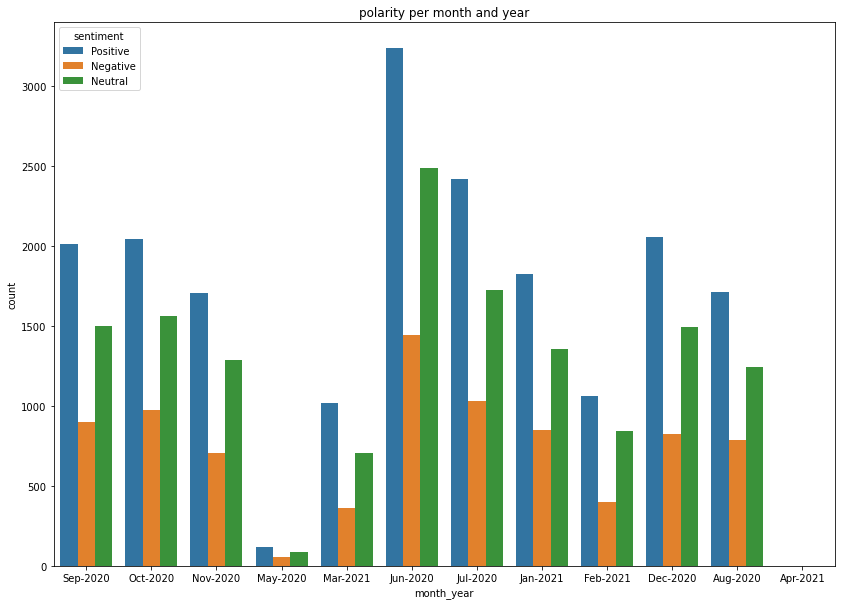

In [120]:
plt.figure(figsize=(14,10))
plt.title('polarity per month and year')
sns.countplot(x= "month_year",hue='sentiment',data=df_new)
plt.savefig("histo_sentiment.png")

/home/outif/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


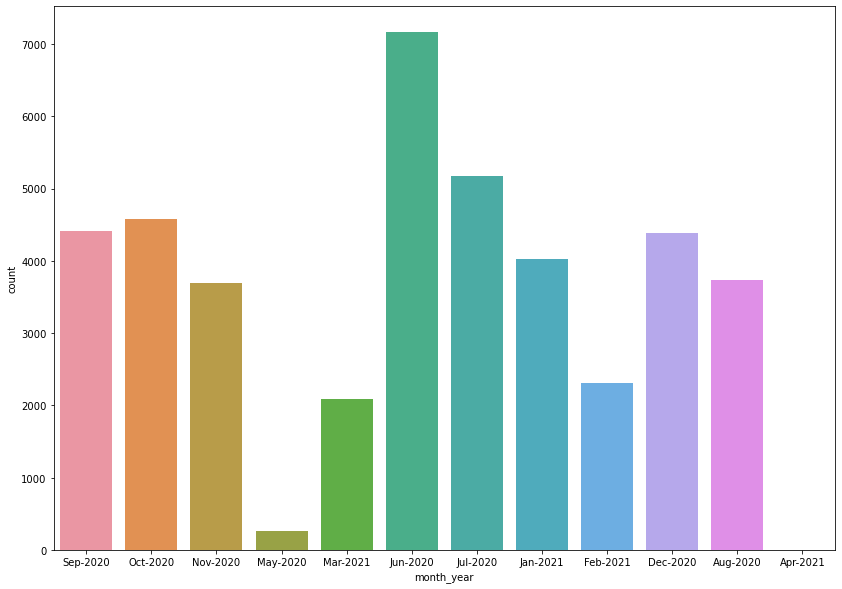

In [121]:
plt.figure(figsize=(14,10))
sns.countplot("month_year",data=df_new)
plt.savefig("count_date.png")

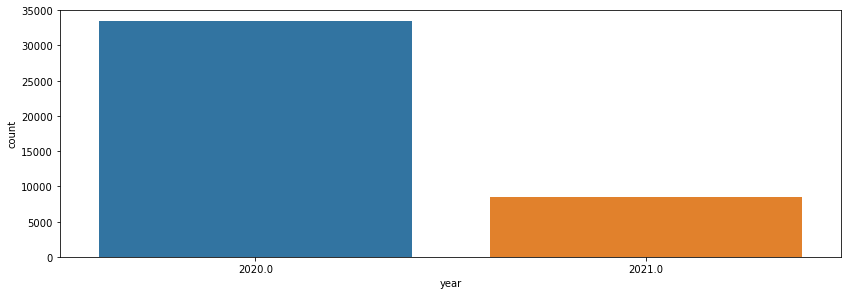

In [122]:
plt.figure(figsize=(14,10))
plt.subplot(211)

sns.countplot(x="year",data=df_new)
plt.savefig("count_year.png")

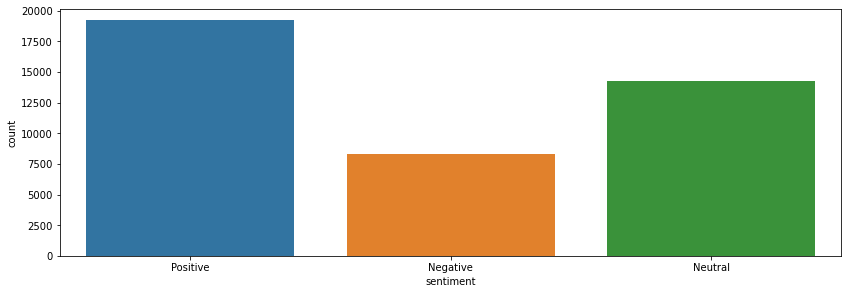

In [123]:
plt.figure(figsize=(14,10))
plt.subplot(211)
sns.countplot(x="sentiment", data=df_new)
plt.savefig("count_polarity.png")

In [124]:
#Collect the negative values for each news source
score_table_new = df_new.pivot_table(index='month_year',  values="polarity", aggfunc = np.mean)
score_table_new
#plt.savefig("score_table_new.png")

,polarity
month_year,
Apr-2021,-0.116667
Aug-2020,0.073989
Dec-2020,0.074236
Feb-2021,0.083422
Jan-2021,0.078102
Jul-2020,0.081573
Jun-2020,0.075220
Mar-2021,0.101744
May-2020,0.043954


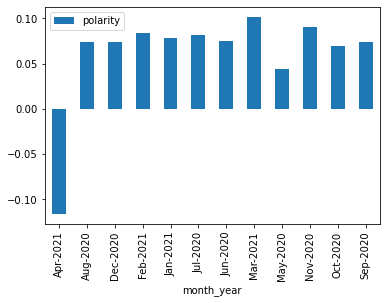

In [125]:
score_table_new.plot(kind='bar')
plt.savefig("score_table_new.png")

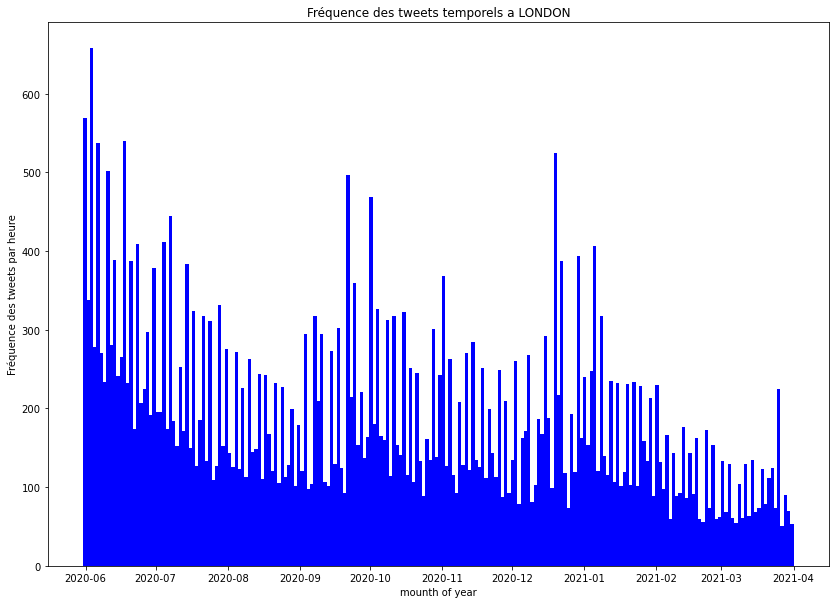

<Figure size 432x288 with 0 Axes>

In [130]:
fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(111)
ax.set(title='Fréquence des tweets temporels a LONDON', xlabel='mounth of year', ylabel='Fréquence des tweets par heure')
plt.hist(pd.to_datetime(df_new.Timestamp), bins = 24*9, color = 'b')
plt.show()
plt.savefig("frequence.png")

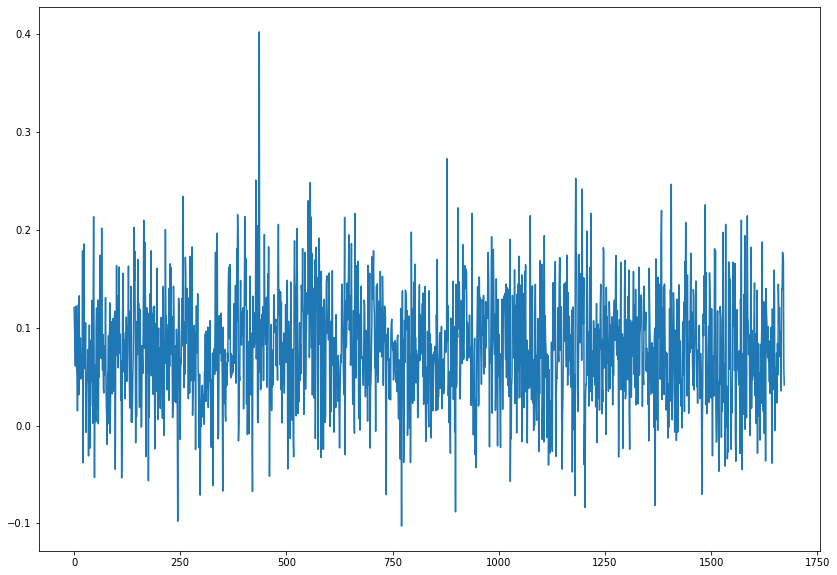

In [131]:
group = lambda liste, size : [liste[i:i+size] for i in range(0, len(liste), size)]
plt.figure(figsize=(14,10))
ax.set(title='Fréquence de polarité', xlabel='count tweets', ylabel='Fréquence de polarité')

polarity_par_paquet = group(df_new['polarity'],25)

liste_moyennes = []
for l in polarity_par_paquet :
    liste_moyennes.append(np.mean(l))

plt.plot(liste_moyennes)
plt.savefig("polarity.png")

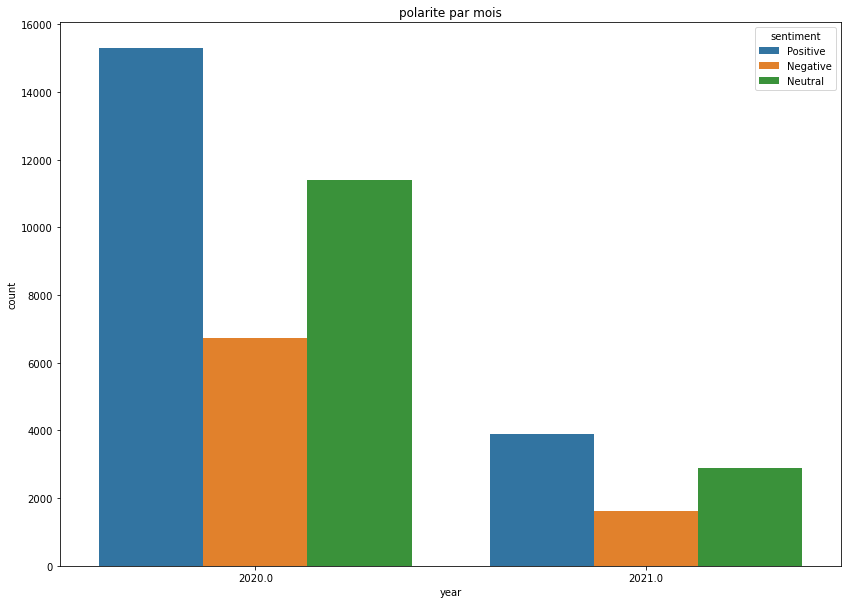

In [132]:
plt.figure(figsize=(14,10))
plt.title('polarite par mois')
sns.countplot(x= "year",hue='sentiment',data=df_new)
plt.savefig("sentim_year.png")

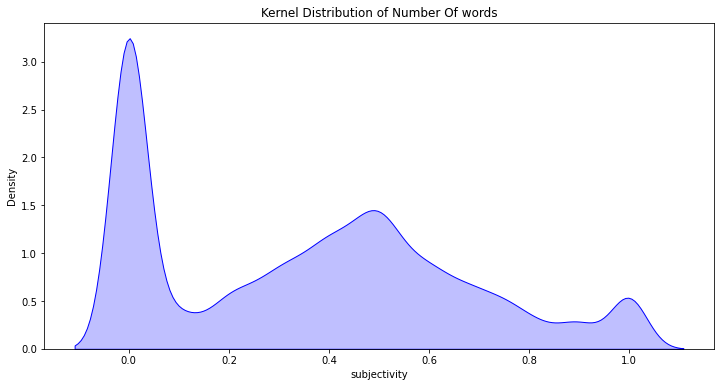

In [142]:
plt.figure(figsize=(12,6))
p1=sns.kdeplot(df_new['subjectivity'], shade=True, color="b").set_title('Kernel Distribution of Number Of words')
#p1=sns.kdeplot(df_new['polarity'], shade=True, color="r")
plt.savefig("subjectivity.png")

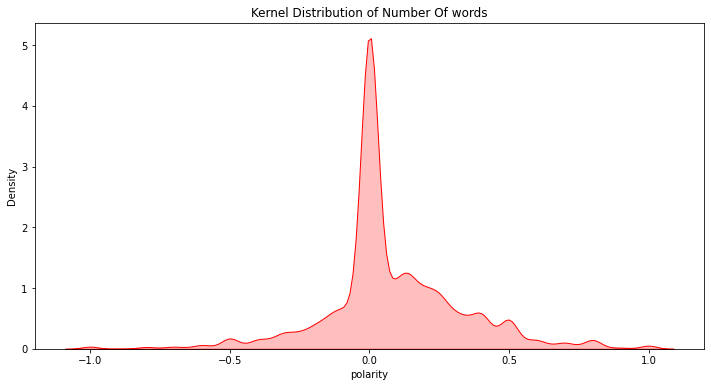

In [144]:
plt.figure(figsize=(12,6))
p1=sns.kdeplot(df_new['polarity'], shade=True, color="r").set_title('Kernel Distribution of Number Of words')
#p1=sns.kdeplot(df_new['polarity'], shade=True, color="r")
plt.savefig("polarity.png")

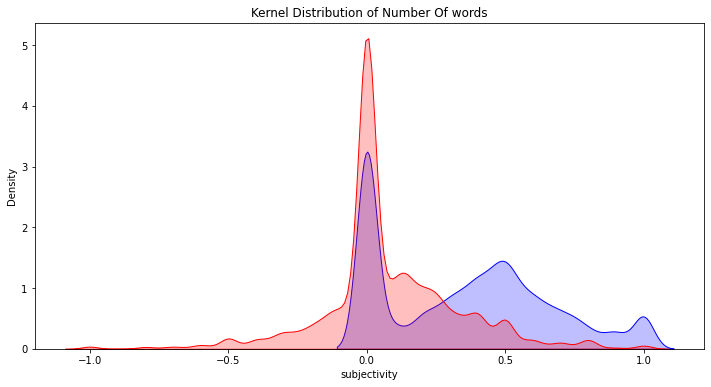

In [145]:
plt.figure(figsize=(12,6))
p1=sns.kdeplot(df_new['subjectivity'], shade=True, color="b").set_title('Kernel Distribution of Number Of words')
p1=sns.kdeplot(df_new['polarity'], shade=True, color="r")
plt.savefig("polarity_subjectivity.png")

In [152]:
# find categorical variables

categorical = [var for var in df.columns if df[var].dtype=='O']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :\n\n', categorical)

There are 8 categorical variables

The categorical variables are :

 ['tweetid', 'time', 'plus', 'Tweet', 'month_year', 'processed_tweet', 'sentiment_results', 'sentiment']


In [153]:
df_new[categorical].head()

,tweetid,time,plus,Tweet,month_year,processed_tweet,sentiment_results,sentiment
27641,1310234878919798784,16:08:32,+0000,<redstarneil> Excellent from @NickCohen4 in th...,Sep-2020,excellent observeruk sweden socialsolidarity,"{'polarity': 1.0, 'subjectivity': 1.0, 'sentim...",Positive
5299,1309412192828170241,09:39:29,+0000,<KulpaBart> New Zealand slump a red alert for ...,Sep-2020,new zealand slump red alert world economy newz...,"{'polarity': 0.06818181818181818, 'subjectivit...",Positive
5305,1309365537785499649,06:34:05,+0000,<JoWolffBSG> Carnivorous Coronavirus Early...,Sep-2020,carnivorous coronavirus early morning donât ...,"{'polarity': 0.1, 'subjectivity': 0.3, 'sentim...",Positive
5304,1309389184407416832,08:08:03,+0000,<Geri_E_L_Scott> ð¨NEW PODCAST! ð¨ On @yor...,Sep-2020,ð¨new podcast ð¨ yorkshirepostâs podsown...,"{'polarity': 0.06818181818181818, 'subjectivit...",Positive
5303,1309396726017478656,08:38:01,+0000,"<BritishHeraldUK> Czech Republic records 2,913...",Sep-2020,czech republic record new coronavirus case,"{'polarity': 0.13636363636363635, 'subjectivit...",Positive


In [154]:
df_new[categorical].isnull().sum()


tweetid              0
time                 0
plus                 0
Tweet                0
month_year           1
processed_tweet      0
sentiment_results    0
sentiment            0
dtype: int64

In [155]:
for var in categorical: 
    
    print(df_new[var].value_counts())

1309041110845714433    2
1322570562019954689    2
1373698185508442114    2
1304678456588939264    2
1319547000212381696    2
                      ..
1318611205561475073    1
1332359719726542849    1
1301899327527432193    1
1360929224727666691    1
1303973210124365824    1
Name: tweetid, Length: 39696, dtype: int64
12:48:03    9
11:14:32    7
11:02:06    7
19:18:48    7
09:47:34    7
           ..
11:42:11    1
04:38:02    1
13:34:30    1
19:36:25    1
19:22:42    1
Name: time, Length: 30101, dtype: int64
+0000    41819
ay fr        1
Name: plus, dtype: int64
<GThieuss> Que Dieu Ã©pargne le monde de #CORONAVIRUS . Que Dieu guÃ©risse les malades, assiste les prisonniers et qu'il bÃ©nisse les morts. Que Dieu remplisse nos vies de SantÃ©, Paix, Bonheur, Argent, longue vie, ouvre toutes les portes de reussites pour nous tous et qu'il benisse Le Mondeðð¾                              33
<Blod_wen> Help slow the spread of #COVID19 and identify at risk cases sooner by self-reporting your

In [158]:
# check labels in Tweet variable

df_new.month_year.unique()

array(['Sep-2020', 'Oct-2020', 'Nov-2020', 'May-2020', 'Mar-2021',
       'Jun-2020', 'Jul-2020', 'Jan-2021', 'Feb-2021', 'Dec-2020',
       'Aug-2020', 'Apr-2021', nan], dtype=object)

In [159]:
df_new.month_year.value_counts()

Jun-2020    7163
Jul-2020    5168
Oct-2020    4578
Sep-2020    4413
Dec-2020    4378
Jan-2021    4029
Aug-2020    3739
Nov-2020    3695
Feb-2021    2306
Mar-2021    2081
May-2020     267
Apr-2021       2
Name: month_year, dtype: int64

In [160]:
# check labels in native_country variable

df.sentiment.unique()

array(['Positive', 'Neutral', 'Negative'], dtype=object)

In [161]:

df_new.sentiment.value_counts()

Positive    19200
Neutral     14289
Negative     8331
Name: sentiment, dtype: int64

In [162]:
# find numerical variables

numerical = [var for var in df_new.columns if df_new[var].dtype!='O']

print('There are {} numerical variables\n'.format(len(numerical)))

print('The numerical variables are :', numerical)

There are 5 numerical variables

The numerical variables are : ['Timestamp', 'year', 'polarity', 'subjectivity', 'covid']


In [163]:

df_new[numerical].head()

,Timestamp,year,polarity,subjectivity,covid
27641,2020-09-27,2020.0,1.000000,1.000000,1
5299,2020-09-25,2020.0,0.068182,0.227273,1
5305,2020-09-25,2020.0,0.100000,0.300000,0
5304,2020-09-25,2020.0,0.068182,0.427273,1
5303,2020-09-25,2020.0,0.136364,0.454545,1


In [164]:
# check missing values in numerical variables

df_new[numerical].isnull().sum()

Timestamp       1
year            1
polarity        0
subjectivity    0
covid           0
dtype: int64

In [165]:
df_new[df_new['sentiment']=='Negative']

,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet,sentiment_results,polarity,subjectivity,sentiment,covid
5301,1309407259940794368,2020-09-25,09:19:53,+0000,"<KulpaBart> While Spain, France and UK suffer ...",Sep-2020,2020.0,spain france uk suffer covid surge italy ð®ð...,"{'polarity': -0.20833333333333334, 'subjectivi...",-0.208333,0.444444,Negative,1
5300,1309409421290864640,2020-09-25,09:28:28,+0000,<MissGpublic> Has anyone attempted to or actua...,Sep-2020,2020.0,anyone attempted actually gotten nh covid test...,"{'polarity': -0.10833333333333332, 'subjectivi...",-0.108333,0.495833,Negative,1
5306,1309271620058591234,2020-09-25,00:20:53,+0000,<afshinrattansi> Sir Keir Starmer's Lords on m...,Sep-2020,2020.0,sir keir starmers lord message supporting evic...,"{'polarity': -0.05000000000000001, 'subjectivi...",-0.050000,0.283333,Negative,1
5323,1309178732930912257,2020-09-24,18:11:47,+0000,<nessymon> Shit. Coronavirus: UK reports high...,Sep-2020,2020.0,shit coronavirus uk report highest ever number...,"{'polarity': -0.02121212121212122, 'subjectivi...",-0.021212,0.418182,Negative,0
5320,1309197802086465536,2020-09-24,19:27:34,+0000,<DianeCoyle1859> Support for students during t...,Sep-2020,2020.0,support student anxious coronavirus time thank...,"{'polarity': -0.024999999999999994, 'subjectiv...",-0.025000,0.600000,Negative,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
30708,1298961942443425792,2020-08-27,13:33:55,+0000,<ryanizzle19> @paulpogba Iâm not a Man Utd f...,Aug-2020,2020.0,paulpogba iâm man utd fan sorry hear tested ...,"{'polarity': -0.13636363636363635, 'subjectivi...",-0.136364,0.772727,Negative,0
30715,1298946735562199049,2020-08-27,12:33:29,+0000,<candyanne54> @LeShuttle if I need to change m...,Aug-2020,2020.0,leshuttle need change booking due covid rule,"{'polarity': -0.125, 'subjectivity': 0.375, 's...",-0.125000,0.375000,Negative,0
30716,1298943479574274051,2020-08-27,12:20:33,+0000,<MusicNewsWeb> https://t.co/cGbkkwFHAS Billie...,Aug-2020,2020.0,billie eilish share hope future reflecting wei...,"{'polarity': -0.25, 'subjectivity': 0.5625, 's...",-0.250000,0.562500,Negative,0
30717,1298943465489920001,2020-08-27,12:20:30,+0000,<Mr_C_Wadd> @lb_southwark 25 complaints and no...,Aug-2020,2020.0,lbsouthwark complaint one showing disgrace let...,"{'polarity': -0.2583333333333333, 'subjectivit...",-0.258333,0.313889,Negative,0


In [50]:
df_new[df_new['sentiment']=='Positive']


,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet,sentiment_results,polarity,subjectivity,sentiment,covid
18075,1304470823030358016,2020-09-11,18:24:14,+0000,<UB5simon> Caller to @LBC Brenda goes from say...,Sep-2020,2020.0,caller lbc brenda go saying shell continue mee...,"{'polarity': 0.21428571428571427, 'subjectivit...",0.214286,0.428571,Positive,1
18053,1304580564469547013,2020-09-12,01:40:19,+0000,<ColinPayn> @RSRMars I'm going to purchase a m...,Sep-2020,2020.0,rsrmars im going purchase million quid worth c...,"{'polarity': 0.26666666666666666, 'subjectivit...",0.266667,0.533333,Positive,0
18056,1304533862941446144,2020-09-11,22:34:44,+0000,<IndiraTandon1> @ashish30sharma COVID19 cases ...,Sep-2020,2020.0,case rise â¹ new lockdown restriction introdu...,"{'polarity': 0.06818181818181818, 'subjectivit...",0.068182,0.477273,Positive,1
18062,1304521827499356166,2020-09-11,21:46:55,+0000,<BhallaChaman> @upperclasstwit2 @laurie_sams @...,Sep-2020,2020.0,lauriesams realdonaldtrump trump definitely be...,"{'polarity': 0.3972222222222222, 'subjectivity...",0.397222,0.602778,Positive,0
18065,1304511767171805186,2020-09-11,21:06:56,+0000,<pemdave> â... itâs a portal where we can ...,Sep-2020,2020.0,â itâs portal leave behind old model worki...,"{'polarity': 0.09333333333333334, 'subjectivit...",0.093333,0.448333,Positive,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21586,1290092941718020096,2020-08-03,02:11:40,+0000,<richardwdean> @IanRCrane The enemy isnât Co...,Aug-2020,2020.0,ianrcrane enemy isnât covid offered â someon...,"{'polarity': 0.049999999999999996, 'subjectivi...",0.050000,0.344444,Positive,0
21585,1290093013457235968,2020-08-03,02:11:57,+0000,<kuyakim_atienza> These were taken same time i...,Aug-2020,2020.0,taken time london exactly year ago world didnt...,"{'polarity': 0.5499999999999999, 'subjectivity...",0.550000,0.616667,Positive,0
21584,1290120970229841920,2020-08-03,04:03:03,+0000,<ldx57> @VacunaDe @BBCBreaking @realDonaldTru...,Aug-2020,2020.0,vacunade bbcbreaking realdonaldtrump bbcnews h...,"{'polarity': 0.2, 'subjectivity': 0.5, 'sentim...",0.200000,0.500000,Positive,0
21582,1290159298996244481,2020-08-03,06:35:21,+0000,<FOREVERLUFC14> Leeds is in my blood â½ï¸â½...,Aug-2020,2020.0,leeds blood â½ï¸â½ï¸ððððâ½ï¸...,"{'polarity': 0.195, 'subjectivity': 0.55499999...",0.195000,0.555000,Positive,1


In [51]:
df_new[df_new['sentiment']=='Neutral']


,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet,sentiment_results,polarity,subjectivity,sentiment,covid
19040,1300860279203311616,2020-09-01,19:17:14,+0000,<Veronica_Foote_> #Covid19 infection hotspots ...,Sep-2020,2020.0,infection hotspot across europe courtesy ecdce...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral,1
18055,1304544902169141248,2020-09-11,23:18:36,+0000,<Jas_Athwal> Act now to prevent a local lockdo...,Sep-2020,2020.0,act prevent local lockdown âï¸ keep metre a...,"{'polarity': 0.0, 'subjectivity': 0.5, 'sentim...",0.0,0.500000,Neutral,0
18060,1304523902496972803,2020-09-11,21:55:09,+0000,<tinabali22> ð¥ð¥ð¥ #Mumbai #COVID19,Sep-2020,2020.0,ð¥ð¥ð¥ mumbai,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral,1
18061,1304523522644074497,2020-09-11,21:53:39,+0000,"<gianluca7rizzo> Earlier this week, I had the ...",Sep-2020,2020.0,earlier week pleasure share view impact brixto...,"{'polarity': 0.0, 'subjectivity': 0.5, 'sentim...",0.0,0.500000,Neutral,1
18064,1304512669618245632,2020-09-11,21:10:31,+0000,<WTBWvintage> Hold a public inquiry into the G...,Sep-2020,2020.0,hold public inquiry government handling covid ...,"{'polarity': 0.0, 'subjectivity': 0.0666666666...",0.0,0.066667,Neutral,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,1290062311659409408,2020-08-03,00:09:57,+0000,<Bluesewingclub> https://t.co/VfplAicLLe We a...,Aug-2020,2020.0,offering matching faceshield matching facecove...,"{'polarity': 0.0, 'subjectivity': 0.3, 'sentim...",0.0,0.300000,Neutral,0
21587,1290075218866733056,2020-08-03,01:01:15,+0000,<HeySCarter> 'Business and the #COVID19 Pandem...,Aug-2020,2020.0,business pandemic â go explore businessstrat...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral,1
0,1377396787011411968,2021-04-01,00:05:59,+0000,<calneeagle> #COVID19,Apr-2021,2021.0,,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral,1
4048,2. To help concentr,NaT,or get a,ay fr,"m any external distractions 3. When in doubt, ...",NaN,NaN,external distraction doubt ask image taken pri...,"{'polarity': 0.0, 'subjectivity': 0.05, 'senti...",0.0,0.050000,Neutral,0


In [166]:
pd.isnull(df_new["sentiment"])


27641    False
5299     False
5305     False
5304     False
5303     False
         ...  
30723    False
6730     False
11310    False
11309    False
15357    False
Name: sentiment, Length: 41820, dtype: bool

In [168]:
positive_tweet = df_new[df_new['sentiment'] == 'Positive']['processed_tweet']
neutral_tweet = df_new[df_new['sentiment'] == 'Neutral']['processed_tweet']
negative_tweet = df_new[df_new['sentiment'] == 'Negative']['processed_tweet']

In [169]:
positive_tweet

27641         excellent observeruk sweden socialsolidarity
5299     new zealand slump red alert world economy newz...
5305     carnivorous coronavirus early morning donât ...
5304     ð¨new podcast ð¨ yorkshirepostâs podsown...
5303            czech republic record new coronavirus case
                               ...                        
30711    ð¨ð²ð meet prof john n nkengasong jnken...
30713    benmitchellsong sapiofoxy none vaccine trotted...
30714    remote tribe india andamans recorded first cas...
30719    covid update regret idomeneo wrecker sir john ...
30720    âs ideal temperature degree c refrigeration ...
Name: processed_tweet, Length: 19200, dtype: object

In [170]:
neutral_tweet

5298           poland report daily record coronavirus case
5296     benefit work benefitsandwork latest news septe...
5294     bit blue girl today tellinme coronavirus lockd...
5308     idea boris johnson courtesy deloitte mckinsey ...
5317     ðso todayâs day ð²hereâs track trace ...
                               ...                        
30722    elliebatch nathanaelyoung lizfreeman michaelro...
30723             indiawilloughby stated sacked view covid
6730        wind could blow coronavirus away whilst itâs
11309                                                     
15357    external distraction doubt ask image taken pri...
Name: processed_tweet, Length: 14289, dtype: object

In [171]:
negative_tweet

5301     spain france uk suffer covid surge italy ð®ð...
5300     anyone attempted actually gotten nh covid test...
5306     sir keir starmers lord message supporting evic...
5323     shit coronavirus uk report highest ever number...
5320     support student anxious coronavirus time thank...
                               ...                        
30708    paulpogba iâm man utd fan sorry hear tested ...
30715         leshuttle need change booking due covid rule
30716    billie eilish share hope future reflecting wei...
30717    lbsouthwark complaint one showing disgrace let...
11310    thankyou dailymirror highlighting terrible pro...
Name: processed_tweet, Length: 8331, dtype: object

In [180]:
import neattext.functions as nfx
dir(neattext.functions)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [181]:
# Remove Stopwords and Convert to Tokens
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()

negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()

neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

positive_tweet_list

['excellent observeruk sweden socialsolidarity',
 'new zealand slump red alert world economy newzealand jacindaardern newzealandlockdown newzealanders auckland wellington asiapacific australia business money trade economy financialmarkets pandemic coronavirus coronavirusoutbreak',
 'carnivorous coronavirus early morning donâ\x80\x99t glass anagram gift conspiracy theorist',
 'ð\x9f\x9a¨new podcast ð\x9f\x9a¨ yorkshirepostâ\x80\x99s podsowncountry week iâ\x80\x99ve got benhouchen chatting devolution coronavirus plus robparsonsyp davidspereall run news wakefield fancy new graphic listen',
 'czech republic record new coronavirus case',
 'situation doesnt help early childhood trauma mirror hard filled uncertainty cant answer safe safe safety return lockdownuk coronavirus trauma anxiety',
 'social distancingwearing mask air purification best way stop spread coronavirus maybe wearing mask desk work bit hamster virus airborne feel change approach',
 'new coronavirus case russia reach highest 

In [182]:
negative_tweet_list

['spain france uk suffer covid surge italy ð\x9f\x87®ð\x9f\x87¹ adapted brutal phase rome milan conte italian europe pandemic coronavirus coronavirusoutbreak coronavirusupdate covid uklockdown madrid france',
 'attempted actually gotten nh covid test private fine hammering going fucking coronavirus impossible tested sense coronavirus fridaythoughts lockdown',
 'sir keir starmers lord message supporting eviction poor coronavirusafter yesterday firing labour mp daring defy starmers de facto support international war crime torture ð\x9f\x91\x87',
 'shit coronavirus uk report highest number new daily case',
 'support student anxious coronavirus time thanks posting link nancy',
 'animal bird tangled die snip strap disposable mask dispose carefully coronavirus wearamasksavealife',
 'long break night pointless girl oleoleoleoleoleole coronavirus lockdown isolation selfisolation zoom friend staysafe keepfollowingtherules',
 'opinion lockdown trashing economy loss job business mental health iss

In [183]:
neutral_tweet_list

['poland report daily record coronavirus case',
 'benefit work benefitsandwork latest news september dwp found guilty coronavirus health safety breach',
 'bit blue girl today tellinme coronavirus lockdown isolation selfisolation zoom friend staysafe keepfollowingtherules isaidit',
 'idea boris johnson courtesy deloitte mckinsey multinationallinked sage sercoð\x9f¤¦coronavirus',
 'ð\x9f\x97\x93so todayâ\x80\x99s day ð\x9f\x93²hereâ\x80\x99s track trace qr code ð\x9f\x8c\x8d â\x81nhs supportlocal coronavirus corona instagram nhsapp staysafeeveryone health smallbusiness covid lockdown app governmentguidelines ukgovernment qrcodes support',
 'coronavirus today china registered coronavirus case billion people',
 'ask world leader suspend debt repayment worldâ\x80\x99s poorest country help fight coronavirus add voice onecampaign petition oneworld',
 'sarahcpr brexit trump boris increase syphilis coronavirus',
 'boris got scared maybe doubt version coronavirus caused pain suffering sorry suff

In [184]:
# Tokenization
for line in positive_tweet_list:
#     print(line)
    for token in line.split():
        print(token)
        

excellent
observeruk
sweden
socialsolidarity
new
zealand
slump
red
alert
world
economy
newzealand
jacindaardern
newzealandlockdown
newzealanders
auckland
wellington
asiapacific
australia
business
money
trade
economy
financialmarkets
pandemic
coronavirus
coronavirusoutbreak
carnivorous
coronavirus
early
morning
donât
glass
anagram
gift
conspiracy
theorist
ð¨new
podcast
ð¨
yorkshirepostâs
podsowncountry
week
iâve
got
benhouchen
chatting
devolution
coronavirus
plus
robparsonsyp
davidspereall
run
news
wakefield
fancy
new
graphic
listen
czech
republic
record
new
coronavirus
case
situation
doesnt
help
early
childhood
trauma
mirror
hard
filled
uncertainty
cant
answer
safe
safe
safety
return
lockdownuk
coronavirus
trauma
anxiety
social
distancingwearing
mask
air
purification
best
way
stop
spread
coronavirus
maybe
wearing
mask
desk
work
bit
hamster
virus
airborne
feel
change
approach
new
coronavirus
case
russia
reach
highest
level
june
dwp
found
health
safety
executive
hse
breached
he

crosscountry
coronavirus
page
generic
advice
itâs
linked
homepage
book
seat
itâs
pretty
clear
need
reservation
travel
ive
got
bottle
aftershave
box
chocolate
coronavirus
happy
christmas
mp
sarahowen
spoke
candidly
gloriadepiero
tnewtondunn
timesradio
today
racism
sheâs
subjected
coronavirus
pandemic
itâs
worth
listening
chriswirral
engfocus
iâve
read
website
coronavirus
page
âreserve
seatâ
land
saying
youâre
onboard
donât
tmr
service
explain
weâre
told
hrh
pm
suffer
financially
coronavirus
chaos
actually
care
iâm
concerned
feed
kid
canât
leave
home
rely
costly
home
delivery
uc
toryshambles
msm
said
positive
pandemic
negative
scaremonging
pointing
fault
iâve
seen
better
idea
solution
strategy
especially
keirstarmer
msm
mediascum
scummedia
coronavirus
medaibias
lockdown
happening
inevitably
happen
â
waveâ
purely
british
publicâs
fault
thereâs
way
virus
spread
thatâs
people
mask
social
distancing
partiesthe
people
blame
coronavirus
thing
kept
coronaviru

ð
spotted
local
london
high
street
warned
ð
chiswick
business
coronavirus
london
economic
effect
covid
pandemic
resulted
people
claiming
universal
credit
million
coming
month
system
broken
urgent
need
investment
article
standardnews
timely
measure
taken
fight
wave
far
adequate
tighter
restriction
local
lockdown
break
chain
virus
necessary
feel
lucky
work
fantastic
partner
supporter
stmungos
critical
response
date
key
overcoming
future
challenge
endinghomlessness
rebuildinglives
whenweworktogether
kevinpascoe
ucu
nusuk
young
people
believe
wont
die
covid
lax
mask
etc
dont
realise
lot
younger
people
left
dehabitating
lung
respiratory
problem
read
georgebridges
economic
damage
covid
tough
hearing
everyoneâs
story
good
hear
fantastic
work
vcs
organisation
communitysupport
vcsheroes
piersmorgan
left
wave
covid
new
covid
case
announced
uk
hour
clear
proper
action
isnât
taken
soon
going
worse
time
close
highest
number
recorded
shame
covid
robbed
u
celebrity
football
match
arg
callum

experienced
bereavement
virus
donate
help
important
work
barnet
immune
economic
effect
covid
ask
help
locally
donate
barnettogether
barnetcouncil
poverty
set
double
christmas
new
paper
gone
live
lancetmicrobe
youâre
looking
read
free
given
itâs
openaccess
journal
free
empowering
good
thatâs
come
covid
improvement
inovation
change
focusonthepositive
happy
weekend
everybody
ð
davepiperdj
johnstevens
sense
leaving
lot
people
desperate
hope
good
news
let
harvest
light
im
expecting
government
try
interfere
minister
religion
treated
key
worker
great
freedom
work
day
tfl
chance
instruct
driver
allow
people
donât
wear
face
covering
getting
bus
group
youth
got
service
wimbledon
sutton
station
today
loud
disrespectful
btp
covid
generational
gap
increasing
despite
genx
geny
bearing
economic
burden
protect
boomer
asian
wedding
adjust
new
normal
need
away
status
driven
signalling
event
lot
broke
barn
morning
group
werenât
aware
rule
ð
farming
cattle
escapingcattle
working
articulate

strengthen
immune
system
sauerkraut
great
session
today
woman
covid
rule
followed
great
session
lead
great
coachðð¼
glad
serve
technical
program
committee
ieeeorg
cloudcom
comsoc
conference
publication
year
covid
yungdumbantory
gneissshorts
spilleroftea
âindirect
effect
virusâ
oh
mean
like
comorbidities
effect
followon
illness
result
virus
right
iâm
sure
realise
onethird
case
itâs
covid
learned
subject
burying
st
joseph
upside
rose
bush
morningcommute
weekendwanderings
houseselling
stjospeh
rosebush
upsidedown
coronavirus
lockdown
london
westminster
british
university
facing
rise
covid
case
latest
cgtneurope
cgtnofficial
covidã¼
coronavirus
end
world
result
stupidity
people
think
smart
know
better
everybody
fact
coviduk
covidiots
rise
âpolo
mintâ
economy
covid
revived
britainâs
local
high
street
highamspark
walthamforest
â¥ï¸
saveourhighstreets
uk
pledged
â
million
send
covidvaccine
world
china
pledged
big
fat
zero
obviously
money
crisis
madness
nhsdigital
nh
app


jamesmelville
dr
vladimir
zelenko
md
proven
zelenko
protocol
work
case
time
positive
use
medication
hydroychloroquine
plus
azithromyicin
covid
patient
combination
zinc
big
day
fcdogovuk
dominicraab
cohosts
event
boost
international
support
vaccine
diagnostics
therapeutic
secretary
general
un
director
general
south
africa
ð¬ð§ð¿ð¦
ðºð³ð
tackling
saveourrightsuk
goddersbloom
matthancock
dr
vladimir
zelenko
md
proven
zelenko
protocol
work
case
time
positive
use
medication
hydroychloroquine
plus
azithromyicin
covid
patient
combination
zinc
loved
talking
app
sommetgovtech
yesterday
help
slow
spread
identify
risk
case
sooner
selfreporting
symptom
daily
feel
ð
download
app
live
life
happiness
life
mentalhealthmatters
positivevibesonly
selfcare
selflove
motivation
faith
prayer
lifechoices
peace
lifestyle
coronavirus
wednesdaywisdom
wednesdaymorning
covid
killed
millionth
confirmed
victim
covid
canât
stop
rwxyo
soldier
wishing
surviving
el
alamein
veteran
happy
birthday
regi

davidhorne
staff
courteous
professional
special
mention
atalianservest
team
keeping
u
clean
route
know
shouldnât
laugh
butðððð
pretty
accurate
imo
testandtrace
petiton
gaining
momentum
sign
ask
friend
share
sign
let
sure
young
people
keavibg
care
faced
digital
poverty
digitalpoverrty
careleavers
thanks
tobiasgavin
smes
played
continue
play
huge
response
bedifrent
futuregov
sommetgovtech
nice
receive
gift
especially
itâs
ððððð
preparing
awaited
coronavirus
free
day
missbonglondon
loveyourself
workwearstyle
london
london
united
kingdom
believe
health
worker
protected
coronavirus
live
sign
petition
help
protect
generationcovidâ
ððâ
uk
government
advisor
tell
government
verge
losing
control
corona
virus
maybe
good
idea
uk
concentrate
resource
home
starting
covid
vaccine
trial
westminster
lead
example
expert
errrrr
iâm
sure
people
aware
particular
amendment
corona
virus
act
thursday
keeping
fingerprint
data
national
security
database
thatâs
significa

honest
rule
followed
peopleâs
home
simplification
ruleslaws
isnât
shit
giggle
ruleofsix
coronavirus
latest
gathering
limit
effect
uk
uk
suffered
europe
deadliest
coronavirus
outbreak
recorded
new
case
covid
day
running
sunday
coronavirus
know
total
death
decreased
couple
month
ago
recently
apparent
total
death
longer
headline
total
infection
reason
important
flat
photo
today
hot
meeeltinggggg
morningcommute
flatsale
photo
hot
heat
coronavirus
lockdown
london
westminster
shes
costume
ready
girl
nolans
gotta
pull
shouldadone
coronavirus
lockdown
zoom
friend
staysafe
dontbreaktherulesyoutwats
isaidit
new
trial
century
postponed
coronavirus
killing
belmarsh
prison
julian
assange
tortured
uk
according
un
covidinfected
relative
u
prosecutor
young
person
left
home
wake
coronavirus
fair
chancetomoveon
homelessness
willquince
canât
wait
year
act
promise
raise
local
housing
allowance
homeless
young
people
young
person
left
home
wake
coronavirus
fair
chancetomoveon
homelessness
willquince
c

stingy
automate
email
asking
review
important
travel
covid
interview
hotelcaferoyal
london
england
set
collection
interview
follow
link
bio
visit
covid
section
website
book
hotelcaferoyal
anyâ¦
bbcjustinr
bbcfour
youâre
allowing
climate
denialism
presenter
climatechange
undisputed
scientific
fact
need
preemptive
action
like
maybe
docâll
help
tellthetruth
xrebellionuk
travel
covid
interview
hotelcaferoyal
london
england
set
collection
interview
follow
link
bio
visit
covid
section
website
book
hotelcaferoyal
anyâ¦
bbcfour
bbcjustinr
bbcworld
youâre
presenter
climate
denier
climatechange
undisputed
scientific
fact
requires
preemptive
action
like
maybe
docâll
help
tellthetruth
xrebellionuk
uk
entertainment
medium
industry
responding
pandemic
trend
impacting
industry
find
latest
uk
pwcoutlook
ergh
dis
tew
tour
de
france
race
director
christian
prudhomme
test
positive
covid
mexican
village
chance
banned
riding
borisjohnson
brexit
surely
bojothebozo
dominic
cummings
prompted
drastic

care
professional
medium
social
stigma
associated
address
prevent
ðplease
read
patel
bbglpc
unbelievable
nhsenglandldn
released
londonflu
cphcy
spec
putting
past
lpcs
seen
sonar
require
consent
form
signed
retained
ppvcâs
light
incredible
yâday
harpwallen
ran
series
clinic
candidate
redundant
impact
travel
devastated
loss
experienced
talented
travelprofessionals
devastating
support
rishisunak
grantshapps
savetravel
dear
govt
break
new
covid
rule
limited
specific
manner
appears
plausible
given
infinite
wisdom
youre
going
allow
thousand
people
gather
doncaster
race
ban
gathering
telling
old
toyota
camry
estate
family
flip
seat
boot
people
banned
cleverly
taking
prioritising
symptom
politicslive
hancock
explicit
bbcbreakfast
morning
symptom
getting
tested
ð¤
ðð¿ââï¸
fair
governmentâs
management
covid
continues
shamble
freaking
gathering
group
illegal
theyâve
permitted
decriminalised
publicised
covid
life
changed
especially
job
need
embrace
new
future
work
survey
int

invoice
arrive
inbox
support
chat
service
way
slow
weâve
experienced
precovid
afghani
kabuli
rice
look
beautiful
taste
better
created
recipe
social
distancing
video
shoot
cleanfood
foodlover
foodgasm
foodpic
eat
tasty
hungryâ¦
unprecedented
global
cooperation
world
eradicated
smallpox
way
removing
polio
need
cooperation
fight
covid
united
mp
chair
appgvaccination
drphilippaw
ðð­
sadiqkhan
talking
sense
bbcbreakfast
push
people
office
treat
people
like
adult
let
company
properly
plan
test
trace
sorted
need
thriving
economy
increase
covid
case
yesterday
âfuck
itâ
itâs
school
today
son
case
covid
rising
uk
positive
note
intention
getting
arty
today
original
print
available
etsy
shop
harperbizarreart
swearylandscape
fuckit
super
excited
gig
zombie
apocalypse
begun
ð§ââï¸
tomorrow
ill
gigishoxton
hoxton
ð¶
shoreditch
hoxtonsquare
gigis
london
lockdownuk
lockdown
acoustic
piano
pianocover
originalmusic
cover
coronavirusuk
happy
monday
kensington
pad
morningcommute
temp

eradicate
covid
embedded
factor
ie
future
impact
huge
reduction
regular
health
screening
particular
routine
cancer
check
ladybird
book
keeping
latest
covid
social
distancing
rule
broadened
readership
baseð²
covid
new
big
brother
bromley
confirmed
case
sept
lewisham
confirmed
case
sept
youâd
funny
united
sign
bale
loan
fan
obsessed
sancho
summer
fitting
transfer
alternative
covid
bale
van
de
beek
lb
cb
possibly
better
sancho
vdb
mind
latest
wisconsin
university
eliminates
spring
break
uk
test
covid
vaccine
work
better
inhaled
atlanta
â
coronavirus
pandemic
disrupted
fight
hiv
theâ
covid
hamper
fight
hiv
progress
hiv
stalled
recent
year
advocate
worry
country
risk
backsliding
spike
new
hiv
infection
statement
university
confirmed
restart
acrossâ¦
jennifa
learn
new
day
âno
safe
safeâ
norway
prime
ministre
actaccelerator
facilitation
council
meeting
unbelievable
highlight
importance
covid
vaccine
public
good
left
interestingly
mention
prime
cause
spike
pub
mixing
home
grassroots

afyah
food
programme
able
support
local
family
essential
food
parcel
ongoing
support
family
facing
food
hardship
insecurity
covid
pandemicð¤ð¾
thank
woolwichcomcc
gcdauk
fareshareuk
bame
communityshield
fareshare
nowaste
day
nearly
new
case
graph
spike
currently
experiencing
andrew
lansley
lord
earlier
asked
govtâs
new
regulation
ignore
vast
difference
risk
outdoor
indoor
gatheringsâand
good
reply
govt
way
suppressing
public
protest
thought
day
ð¤
cebu
lapulapu
philippine
itsmorefuninthephilippines
rose
rose
city
urban
urbanromantix
art
contemporaryart
contemporary
thoughtoftheday
thought
thursday
travel
teampixel
motherland
covid
cordova
light
footieblacklist
nomination
process
open
year
weâve
needed
black
excellence
society
football
covid
wonât
stop
u
celebrating
leader
spread
word
nominate
deserving
people
ðð½
huge
economic
burden
lmics
sujatvis
evankirstel
antgrasso
mikequindazzi
iiotworld
ronaldvanloon
survey
run
data
date
taking
consideration
impact
hcps
onlyim

feel
comfortable
enjoy
favorite
indian
restaurant
putney
eatlocal
shareourputney
indianfood
ordernow
dining
restaurant
trackandtrace
covidsafe
staysafe
eatout
jared
polis
release
colorado
inmate
prison
high
risk
dying
covid
sign
petition
ukchange
faceofboe
imscottishneil
stephenkb
ive
actually
sinus
infection
caused
anosmia
confirm
notice
absence
smell
current
condition
think
people
going
aware
smell
key
symptom
covid
join
hackneyabbott
claudiawebbe
bellribeiroaddy
richardburgon
antiracismday
online
fringe
tuesday
september
policing
blacklivesmatter
join
facebook
live
youtube
great
arcticle
inclusivity
new
tony
hawk
game
sundayvibes
sundaymotivation
uktransrights
sundaymorning
tonyhawksproskater
blacklivesmatter
skateboarding
today
shift
northcliffe
month
barely
felt
like
weâre
living
pandemic
lack
face
covering
crowded
pavement
busy
shop
social
distancing
minimal
question
sadiqkhan
eminently
announce
local
ldn
lockdown
jamesmelville
peterjukes
let
follower
know
qualification
relevan

rickyvaja
highlighting
need
bridge
lab
work
clinic
best
help
patient
ft
morning
nice
article
outlining
possibility
school
half
term
october
extending
closure
extra
week
tunbridgewells
school
covid
testing
easy
simple
email
u
care
e
info
w
glorious
friday
fabulous
weekend
harleystreethealthcareclinic
covidtesting
dido
harding
claim
saw
demand
test
coming
blame
sage
getting
prediction
wrong
incredible
given
ð¢
iâve
asked
share
news
new
testing
centre
opening
london
road
wembley
symptom
tested
book
calling
brentcouncil
bktimes
good
uk
thread
concluding
âwhere
gvmnt
hear
rumour
national
lockdown
new
restriction
announced
late
night
need
daily
press
briefing
dont
need
gloss
need
honesty
ownership
mistake
planâ
ðð»ðð¼ðð¾ðð¿
register
gowerinitiative
upcoming
zoom
event
sun
sept
billyblog
conversation
phil
armstrong
discussing
mmt
view
response
covid
education
activism
âmacroeconomicsâ
great
reset
donât
miss
youreperfidy
femisorry
guyverhofstadt
ðððð

covidâ
letâs
watch
healthy
povertystricken
nigerian
starve
street
face
covid
food
inflation
dwayne
johnson
family
tested
positive
covid
join
global
patient
congress
free
sep
hear
socialdeterminants
healthinequality
biology
determined
high
infection
rate
poor
outcome
bme
community
michaelmarmot
worldwide
outrage
condemnation
russia
novicok
poisoning
political
opponent
personand
rightly
worldwide
condemnation
sanction
outrage
china
covidthousands
millionsð¤just
asking
forthemanyð
fly
kiteðª
twitterâï¸
bbcðbbcnewsðbbclondonnewsðbbcworldservice
skynewsðkayburleyðkateemccann
itvðitvnewsðitn
ukð¬ð§jeremycorbynðhocð¼
covidâ
ï¸
usaðºð¸
cbsnewsðwashingtonpostðnytimesðlatimes
dwayne
johnson
family
tested
positive
covid
single
person
planet
need
hear
family
covid
itâs
picky
kill
doesnât
effect
itâs
wild
fire
storm
thatâs
ravaging
happy
election
day
jamaica
vote
vote
safely
taking
precaution
giannocaldwell
glad
hear
london
want
hom

today
ð½today
commences
londonmarathon
virtual
ð
amazing
runner
running
thirst
relief
appeal
ð
jon
bon
jovi
filming
new
york
covid
surreal
pmâs
vaunted
phrase
âtake
controlâ
government
evidently
look
like
effective
mean
control
present
historian
future
going
talk
entertainment
television
company
u
covid
era
people
tonightâs
bgt
people
think
âno
wonder
people
died
wonder
gave
hopeâ
profkarolsikora
gps
private
dental
appointment
easily
canât
covid
youâre
near
credit
card
machine
evidently
ð¤¨
howâs
work
u
b
isolating
month
u
pub
pub
test
positive
u
hv
isolate
week
week
u
restaurant
test
positive
u
isolate
wks
bc
u
test
itâs
like
fr
symptom
itwould
nice
scaremongering
medium
fact
right
new
potential
tier
system
imposed
week
thesun
metrouk
state
plan
left
bbcnews
right
big
difference
ultimately
need
ensure
general
practice
offer
patient
flexibility
size
fit
approach
taking
account
limitation
brings
fantastic
blog
friend
abbiesbrooks
ðð¾ðð¾ðð¾
team

coronavirusde
liberalismisamentaldisorder
gofundmeplease
true
pcr
test
invented
year
ago
covid
virus
isolated
pcr
test
detect
specific
disease
akokombero
johnnjenga
believe
government
step
enforce
social
responsibility
reflects
kind
people
weâve
sensible
callous
greatest
angst
point
covid
viewed
hiv
bare
minimum
protect
bbcquestiontime
michael
share
thought
provoking
view
prediction
bbcqt
questiontime
wednesday
passed
group
young
men
hanging
garden
ignoring
covid
rule
connection
police
swoop
tonight
course
bbcquestiontime
measure
plan
banana
republic
seriously
sophisticated
crook
helm
affair
bbcqt
questiontime
asked
meeting
tomorrow
sage
committee
scientist
livestreamed
briefing
discus
latest
covid
situation
question
scientific
rationale
curfew
cancelthecurfew
weareviable
wearethentia
week
pleasure
panellist
discus
impact
covid
dance
community
thank
paradanceuk
helping
highlight
incredibly
important
issue
ð
beactive
everyonecandance
youtube
albeit
briefly
today
filming
benedictneu

event
hearing
lse
formed
group
fabian
beveridge
report
bretton
wood
implemented
lse
support
proud
lsealumni
thefabians
member
lsepublicevents
internationalcooperation
investment
imfnews
im
backing
eminent
infectious
disease
epidemiologist
public
health
scientist
grave
concern
prevailing
policy
recommend
focused
protection
join
signing
great
barrington
declaration
october
number
key
understanding
life
ð«ðð
beautifully
biblicalð½
thank
president
trump
ready
ð¿
popcorn
gitmo
obamagate
spygate
redoctober
tonight
way
cargorooms
pal
hotvox
involved
people
amazing
cause
fundraising
tonne
propaganda
livestream
fundraiser
music
mondaythoughts
today
fluvaccine
protect
pregnant
woman
protect
patient
protect
healthcare
service
winter
thoroughly
encourage
healthcare
professional
new
case
covid
uk
hour
ð³ð³ðð
genrentuk
constant
ignoring
sidestepping
conservative
robertjenrick
rent
crisis
claddingscandal
disgrace
tell
u
need
know
real
attitude
housing
ð¤³ð¾
increase
case
worr

excuse
johnson
government
pivot
old
day
cameronosborne
government
real
lesson
covid
uk
opposite
given
u
china
handled
pandemic
crisis
oh
india
miss
ð
able
travel
ð¢
privilege
travel
family
enrich
u
rest
life
travel
india
jaipur
feedback
friday
great
work
team
bestadvice
tip
leadership
management
motivation
innovation
business
mentalhealth
workplacehealth
hr
healthandsafety
employeewellbeing
mentalwellbeing
wellbeing
workplacewellbeing
hr
healthtech
therapistsconnect
long
covid
thank
god
right
government
place
beingðð¬ð§ð
teamcno
cnoengland
elliephonstan
therealsprigger
hi
david
write
new
book
âpeter
friend
experience
covidâ
focus
role
seeking
submission
weekly
meeting
peter
nursing
time
story
week
ð¤ª
testing
nearly
number
hospital
low
getting
right
time
live
bullshit
corona
coronavirusuk
london
endsarsnow
lilyy
spilleroftea
god
omnipotent
creator
covid
living
kingdom
thatâs
thorny
problem
cause
vicarious
redemption
dr
knight
covid
paper
âdeveloped
score
help
gp

cute
handmade
mask
pouch
find
project
site
facecovering
facemask
mask
sewing
sewingprojects
earlferrers
streatham
look
great
day
better
night
theyâve
kept
going
adapting
prioritising
safe
measure
great
stuff
need
local
pub
eating
taking
away
donât
loose
âlevelling
building
peopleâ
patmcfaddenmp
joined
mmlabour
tonight
online
session
uklabour
arguing
national
âcircuit
breakâin
line
scientistsâ
advicelonger
term
prioritise
early
yearsâ
education
address
digital
divide
etc
day
raiseacup
bookkeeper
world
supporting
micro
smallbiz
wednesday
november
day
celebrate
success
thankyou
icbglobal
icbuk
icbaustralia
mbuhari
talking
nonsense
broadcast
endsars
innocent
people
killed
going
telling
u
covid
social
medium
poverty
old
man
youre
talking
nyanyampu
iâm
sure
rishisunak
lied
fiscal
stimulus
package
highest
worldanother
lie
iâm
sure
weâre
weâre
richest
country
apparently
ð¥´
toriesout
torieshavefailedthenation
toriesarescum
salvationarmyuk
essential
people
experiencing


charles
dna
uk
need
like
covid
come
term
episode
ukð¬ð§
today
bhmuk
un
â¤ï¸
royalfamily
clarencehouse
kensingtonroyal
welcome
inquiry
led
lucyworsley
slavery
restoration
charles
dna
uk
need
like
covid
come
term
episode
ukð¬ð§
today
bhmuk
un
â¤ï¸
royalfamily
clarencehouse
kensingtonroyal
welcome
inquiry
led
lucyworsley
slavery
restoration
charles
dna
uk
need
like
covid
come
term
episode
ukð¬ð§
today
bhmuk
un
â¤ï¸
week
news
relating
increased
covid
risk
lack
vitamin
surface
took
news
seriously
time
iâm
sure
lot
case
preventedless
severe
betsydet
fabric
thank
betsydet
iâm
gutted
rozassociates
couldnât
share
conference
platform
april
going
powerhouse
change
shall
rise
stronger
great
bbc
london
visit
clubhouse
night
talked
impact
lockdown
club
ððºð½
britishindians
thank
self
rishisunak
support
till
foreign
office
minister
james
cleverly
said
attack
video
followed
pattern
tweeting
left
dont
like
u
bame
people
successful
given
tremendous
way
south
korea
dealt
pa

tbt
live
concert
uk
tbtâ¤ï¸
concert
liveevent
liveevents
musiclover
music
event
covid
covid
coviduk
london
entertainment
london
united
kingdom
fooked
bbc
news
covid
nearly
catching
virus
day
study
find
new
compromise
way
forward
deal
ð
ðconcludes
great
thread
proposal
end
spectrum
drraghibali
ð
good
report
highlighting
deep
impact
covid
aspect
uk
lung
cancer
management
commend
read
section
opportunity
lcsm
proper
tbt
whatmobile
alum
waved
dmaudsley
poignant
photo
taken
loved
greasy
spoon
shepherdesscafe
forced
shutter
july
year
le
understanding
landlord
great
shame
chipswitheverything
ð
right
terminology
spread
word
â¬ï¸
today
day
lionesscircle
foodbank
croydon
menu
today
curry
chicken
chickpea
rice
saladcoleslaw
free
groceriesbasic
essential
available
delivery
today
collection
flyer
addressâ¬ï¸
surely
faruvc
light
thought
realdonaldtrump
elonmusk
realdonaldtrump
got
covid
donald
trump
super
spreader
event
case
check
nearest
icu
superspreadertrump
mauritius
defiantly


speechunion
metpoliceuk
chancellor
best
decade
unfortunately
contend
covid
uk
stewardship
booming
fantastic
man
itâs
application
vaccine
itâs
methodology
testing
viral
infection
eg
dodgy
enjoyed
talking
awmenswear
youâre
interested
bespoke
menswear
business
work
change
especially
mind
find
away
âcompliance
distancing
measure
prevent
newâ
lockdown
covid
control
need
sociology
virologyâ
proud
cousin
honoured
queen
leading
way
bereavement
care
covid
mbe
coviduk
ð¾
ð¥
ð
janefisherevans
heather
amazing
apart
survive
socialdistance
important
pandemic
caused
dont
covidiot
good
analysis
covid
situation
devisridhar
covid
unmasked
true
nature
donald
trump
trumpism
jonathan
freedland
absolutely
brilliant
news
docgurj
mbe
kingscollegelon
kingsmedicine
important
information
covid
test
doesnt
detect
covid
detects
similar
virus
detects
person
covid
similar
virus
body
dealt
exactly
body
deal
virus
upheaval
covid
loveliest
thing
saint
quietly
faithful
lord
year
dear
saint
calm
river
fl

safe
fast
accurate
uk
falling
test
disease
tb
hiv
manufacturing
centred
america
covid
test
uk
today
transported
inâ
trumpster
kristinoem
flouted
covid
got
people
killed
congratulation
governor
south
dakota
successful
sturgis
rally
trumpvirus
yesterday
daughter
sent
picmiss
miss
tallinn
estonia
daughter
missing
love
faraway
stupidcovid
beautifulcity
absolute
state
membership
onewandsworth
dreg
ð¤®i
banned
long
ago
calling
member
saying
hoax
ð±collection
entitled
cyclist
hater
backed
populist
ukip
gammon
âlibertarianâ
type
ew
early
year
found
coronavirus
information
ft
objective
maybe
money
politics
reason
mustread
thing
miss
able
socialise
freely
friend
iâm
sure
feeling
theyâd
social
join
u
facebook
live
discussing
navigating
church
covid
tomorrow
run
film
booked
week
ago
delighted
email
today
bfi
saying
southbank
open
subject
measure
flaneuse
kicking
tomorrow
âthe
battle
algiersâ
drmargareth
chance
know
vaccine
horizon
âliveâ
blood
cancer
told
canât
live
vaccine
id

wondering
constituent
downloaded
âworld
beatingâ
appperhaps
surreytorycllrs
knowalso
wondering
u
realise
u
mobile
old
run
itmy
bh
case
point
wireduk
u
prepared
listen
dominicraab
matthancock
hospitalised
testandtrace
testingshambles
isolate
wearadamnmask
ð¡
idea
educated
uk
population
qr
code
donât
agree
standard
nutrition
qr
labelling
food
cool
scan
know
nutrition
origin
ethically
sourced
cert
carbon
footprint
health
allergy
info
etc
ð¤ð¥«ð²
foodtech
govtech
mrbrightsideuk
careful
germany
travel
theyâre
tightening
entry
restriction
requiring
selfisolation
canât
prove
youâre
free
covid
hello
nasa
hope
organisation
need
right
dire
coronavirus
aka
situation
francierobin
francierobin
fashion
best
pride
energie
fitness
enfield
clean
safe
environment
member
enfield
enfieldtown
enfieldlove
gym
gymlife
gymtime
covid
ãnergie
fitness
important
video
consider
left
robert
f
kennedy
jr
prof
mark
crispin
miller
censorship
miller
censored
teaching
class
nyu
propaganda
censorship


love
nick
ferrari
lbc
good
letusworktogether
asaunitedbritain
wearfacemask
washyourhands
socialdistancing
protectyourself
protectothers
covid
isreal
wearmasks
loveyouall
loveuk
britain
borisjohnson
staysafe
wearmasks
nodealbrexit
covid
going
lead
deeper
recession
higher
unemployment
subsequently
higher
suicide
rate
poverty
inequality
imagined
affected
cardiac
arrest
time
cardiac
arrest
havenât
stopped
covidâ
watch
latest
technique
restartaheart
â
â
restartaheartday
latest
official
data
confirm
alarming
rise
covid
case
uk
suppressing
infection
rate
thing
work
curb
direct
indirect
economic
effect
moving
wrong
direction
happyfriday
covid
covid
safe
covidsafe
ppe
ppekit
shaziyaramji
shazdesigns
london
united
kingdom
lewisham
confirmed
case
oct
bromley
confirmed
case
oct
time
appears
uncertainty
overwhelm
keeping
thing
simple
best
solution
turning
foot
breath
repeat
good
anxiety
therapistsconnect
confidence
important
message
club
regard
london
recently
elevated
national
covid
status
ask
a

pandemic
entirely
appropriate
increasingly
clear
government
step
curve
controlling
coronavirus
crisis
tiered
restriction
announced
today
minister
finally
virus
rebuild
public
confidence
watch
new
zealand
leader
winston
peter
slay
donald
trump
handling
coronavirus
jacinda
ardern
second
term
nz
pm
trumpvirus
ref
ben
thompson
signing
thereâs
chance
lord
lucan
turning
proclaiming
cure
corona
virus
loved
proved
wrong
thou
pompey
girl
love
zumba
class
lovely
naomi
campbell
isaidit
zumba
coronavirus
lockdown
isolation
selfisolation
zoom
friend
staysafe
keepfollowingtherules
xherdan
shaqiri
coronavirus
test
false
positive
huge
boost
liverpool
âcoronavirus
mental
health
workplaceâ
written
facebook
group
join
hr
happiness
mentalhealth
mindfulness
wellness
productivity
wellbeing
workplace
business
success
leadership
safety
watch
decide
pandemic
coronavirus
lie
âhow
margaret
thatcher
dealing
coronavirus
pandemicâ
asks
stig
abell
time
radio
sound
brain
bobbing
skull
like
pickled
egg
jar
a

married
tory
minister
tory
minister
husband
think
coronavirus
likely
mental
illness
metrouk
priority
important
amidst
global
pandemic
unprecedented
recent
human
history
ðð¿
imagine
southwestgooner
ð¤¦ð¿ââï¸
coronavirus
covidiots
grassrootsfootball
feel
coronavirus
right
herewegoagain
imagine
mp
kept
voting
confidence
theresa
brexit
agreement
totally
fine
boris
handled
entire
coronavirus
crisis
school
university
staying
open
great
know
coronavirus
canât
enter
school
university
consent
london
time
moved
away
march
coronavirus
good
plunge
ice
cold
bath
twat
coronavirus
arianagrande
â
health
promotion
message
biggest
âevilâ
moment
sarscoronavirus
virus
ð¦
cause
covid
best
way
beattheevil
break
chain
transmission
wearamaskâ
going
thatâs
doctor
wearamaskâ
ð¥âï¸â¤ï¸ððº
breaking
important
statement
cyclingkev
neunion
ð
breaking
circuitbreaker
lockdownuk
coronavirus
romanian
tennis
star
halep
test
positive
coronavirus
good
microsoft
excel
spreadsheet
analyse

chef
proud
burger
restaurant
foodnetwork
foodblog
teamwork
support
ladapt
adjustment
change
issfoodservices
danwootton
discussed
talkradio
drive
coronavirus
heartbreak
surely
come
close
allowing
newborn
die
truly
lost
plot
ð
share
know
furlough
coronavirus
job
retention
scheme
draw
close
abtalifeline
support
people
travel
industry
need
mostâ¦
struggling
abta
lifeline
able
help
hcq
study
thousand
waiting
sept
metaanalysis
rcts
demonstrates
hydroxychloroquine
use
outpatient
safely
reduces
incidence
composite
covid
infection
hospitalization
death
hcq
work
interesting
development
wake
tosadly
putting
million
american
risk
attitude
family
risk
realdonaldtrump
ãã©ã³ãããã³ã­ãé½æ§
president
trump
lady
melania
trump
tested
positive
covid
oh
profound
realdonaldtrump
underground
president
trump
lady
melania
trump
tested
positive
covid
maybe
time
start
demanding
hcq
unblocked
sept
metaanalysis
rcts
demonstrates
hydroxychloroquine
use
outpatient
safely
reduces
incidence
composite

testing
associated
reduction
number
critical
case
overall
mortality
worrying
able
trust
country
case
statistic
unicoviduk
belgium
spain
reclassified
case
hospitalisation
pcr
cycle
symptom
uk
catastrophic
legislation
based
result
test
fit
purpose
ðð½
people
losing
huge
thank
redbridgelive
enforcement
officer
public
health
team
helping
keepredbridgesafe
pleasure
meet
lauriedalrymple
team
stoop
today
challenging
time
harlequin
spoke
sport
minister
huddlestonnigel
straight
case
financial
support
rugby
quin
successful
safe
pilot
welcoming
limited
number
fan
journalist
offthepitchcom
continue
bring
good
insight
sport
thrive
era
sport
business
football
innovation
swap
digitalcollectibles
technology
realmadriden
bvb
arsenal
arsenalwfc
truly
deserved
wonderfully
tankslider
true
credit
country
veteran
service
piersmorgan
belgium
spain
reclassified
case
hospitalisation
pcr
cycle
symptom
uk
catastrophic
legislation
based
result
test
fit
purpose
ðð½
people
losing
case
shmases
reuters
case

turnover
hit
withâ
best
strategy
place
immune
coronavirus
quote
republican
strategist
think
completely
factually
correct
breaking
trump
adviser
kellyanne
conway
tested
positive
covid
according
daughter
claudia
conway
attended
saturday
white
house
scotus
event
coronavirus
infected
gop
senator
tillis
lee
president
trump
sadio
mane
liverpool
forward
isolating
positive
coronavirus
test
twittercomms
realdonaldtrump
wish
coronavirus
survives
win
battle
consistently
invited
violence
caused
fatal
injury
thousand
american
surprised
didnât
suspend
account
tweet
doesnât
surprise
heard
coronavirus
infected
realdonaldtrump
prayer
thought
encourage
poor
bacteria
stay
strong
wish
speedy
recovery
god
u
âbreaking
senator
thom
tillis
tested
positive
coronavirusâ
tyfs
mmpadellan
story
moving
fast
proving
momentous
day
letâs
hope
ultimately
lead
better
approach
virus
u
theðwearamask
staysafe
ðð½
briankarem
realdonaldtrump
drumpts
garden
party
covid
plenty
coronavirus
cocktail
served
shak

impact
trading
business
result
arcadia
board
working
number
contingency
option
secure
future
groupâs
brand
brand
continue
trade
store
opening
england
roi
soon
government
covid
restriction
lifted
weekâ
detail
new
local
covid
daily
testing
site
day
week
ealing
gurnell
gurnell
leisure
centre
car
park
southall
featherstone
car
park
acton
michael
flanders
centre
notthelen
govuk
said
previously
nh
comfortably
cope
covid
patient
discharged
english
hospital
month
october
reported
discharged
day
november
seasonal
death
year
average
mitel
covid
business
aware
importance
customer
experience
enable
selfservice
joint
online
journey
dr
fauci
covid
vaccine
available
public
spring
hang
got
phone
today
day
work
week
wednesday
gentleman
club
day
today
tested
positive
covid
ive
got
isolate
day
good
news
ive
got
symptom
lovely
ð
tim
hackneycouncil
contacting
hackney
resident
nh
shielding
list
pleased
vulnerable
called
support
available
biased
love
ð
council
shielding
appear
primary
type
conserva

send
thread
response
saying
ârespectfully
allow
governor
stop
singing
let
sing
worship
godâ
raise
interesting
issue
nygovcuomoâs
rule
moderna
early
data
vaccine
nearly
effective
preventing
covid
good
piece
city
today
lord
mayor
alderman
william
russell
citylordmayor
recovery
covid
chance
build
wall
cooperate
cityam
excited
thanking
involved
canât
imagine
work
vaccine
pressure
moderna
early
data
vaccine
nearly
effective
preventing
covid
looking
forward
tonightâs
appgai
evidence
meeting
cover
ai
postcovid
recovery
uk
economy
weâll
critically
discus
socioeconomic
consequence
accelerated
adoption
ai
applied
alleviate
looming
economic
crisis
aã§ãµes
eua
sobem
acentuadamente
e
estão
caminho
de
atingir
novos
recordes
depois
que
moderna
diz
que
sua
vacina
experimental
covid
ã©
altamente
eficaz
today
excellent
vaccine
news
ha
ha
ha
doris
surprised
raraavispress
thats
point
need
know
people
personally
conversation
kind
advice
etcis
repeat
know
personally
suffered
covid
answer
yes
kno

vaccine
promising
effectiveness
pretty
good
plus
itâs
tcell
promoting
therapy
tcells
appear
recent
study
cover
fairly
long
term
immunity
covid
cadoret
avantiwestcoast
simoncalder
iata
study
prof
start
year
billion
passenger
flown
case
covid
contamination
attributed
directly
flying
flying
safe
going
gymnasium
safe
air
change
cleanliness
ðª
officialalw
making
news
vaccine
think
adamlensonâs
sober
approach
accurate
china
report
new
covid
case
pfizer
new
vaccine
gate
send
conspiracy
theorist
hyperdriveð¤ð¤
covidvaccine
pfizervaccine
covid
vaccine
available
british
public
december
uk
beat
u
jonsparkes
essential
people
experiencing
homelessness
face
choice
dying
rough
sleeping
dying
covid
providing
safe
appropriate
effective
accommodation
support
vital
glad
quote
getting
picked
let
exaggerate
psychiatric
consequence
covid
sophiasleigh
wouldnât
smiling
held
accountable
care
home
disaster
outset
saw
thousand
covid
discharged
hospital
near
certain
death
perfect
covid
test
accurate
tes

covid
come
ð¤¯ð¤¬
morning
rnru
staff
learnt
neurological
consequence
legendary
consultant
dr
greenwood
registrar
dr
nasir
budapest
today
iâm
sure
resident
feel
secure
covid
thanks
presence
gentleman
orbã¡n
rewriting
constitution
overnight
time
include
bit
gay
bashing
legalising
corruption
rewriting
electoral
law
edstetzer
covid
mutation
new
hitting
denmark
ð©ð°
recently
vaccine
isnt
ready
prepped
pandemic
hit
end
day
pharmaceutical
company
especially
pfizer
bank
big
money
china
ð¨ð³
sold
usa
ðºð¸
national
paper
lead
news
uk
european
country
record
covid
death
nearly
death
today
complete
embarrassment
mockery
football
covid
protocol
add
fuel
hell
playing
pointless
friendly
increasing
spread
risk
turkey
croatia
domagoj
vida
play
minute
covid
good
read
doctor
advising
aka
realdonaldtrump
sputnik
v
russiaâs
claim
successful
vaccine
doesnât
pas
âsmell
testâ
critic
windies
allowed
drop
isolation
new
zealand
testing
vitamin
omega
fatty
acid
reduce
risk
infection
certai

â
njemaäka
pfizer
â¬
moderna
ameriäka
rusku
u
engleskoj
ne
pominju
tune
ð»
bbcnewshour
bbcworldservice
vaccine
huge
promise
speak
uniofoxford
astrazeneca
gavi
robmalley
biden
secofstate
ablinken
end
hanko
japan
simondenyer
washingtonpost
genuine
question
britainâs
road
rail
ready
covid
christmas
gettogether
plan
backed
uk
nation
tmz
god
speed
hope
recovery
come
swiftly
beatable
odds
slim
personally
came
severe
infection
sleep
hydrate
vegetable
fruit
smoothy
inside
rest
nutrition
vital
help
breathing
return
strength
covid
geographic
distance
sure
wont
prevent
u
christmas
cookie
baking
party
family
ðð
ð¤¶ð¹â¤
christmasiscoming
gbbo
lockdown
stayhome
tested
positive
mild
symptom
great
news
barnardos
campaign
investment
young
people
mentalhealth
rishisunak
announce
â
mental
health
spendingreview
vir
da
criticises
celebrity
posting
video
taking
covid
test
social
medium
âtilting
head
degree
managing
sneeze
engaging
contentâ
tweeted
bollywood
virdas
katrinakaif
wife
asked


azithromycin
effective
therapeutic
approach
covidâ
http
bringing
community
empowering
local
action
keeping
vulnerable
safe
iâm
honoured
covid
volunteering
initiative
praised
work
united
nation
info
statement
thanks
opportunity
participate
todayâs
event
talk
amazing
work
avivaplc
smart
working
supporting
people
covid
delighted
partnering
award
winning
shampangroup
mental
fitness
consultant
aware
impact
covid
business
look
forward
supporting
individual
team
group
hospitality
bromley
wellbeing
team
orchid
nominated
team
yr
covid
hero
award
swlstgâs
quality
award
deserved
service
created
start
pandemic
provides
safe
alternative
ae
received
lot
positive
ptcarer
feedback
proud
mental
health
support
line
team
nominated
clinical
team
year
covid
hero
award
swlstg
quality
award
newly
expanded
service
adapted
lot
change
busy
year
mhsl
ask
earlier
yr
lingering
symptom
virus
march
confirmed
antibody
july
oct
ongoing
respiratory
probs
fatigue
numerous
bacterial
infection
gbdoc
happy
thanksgi

time
year
group
thats
known
case
gavinwilliamson
borisjohnson
drtam
lazy
tracing
canadian
need
better
action
governement
hidding
number
flight
covid
case
day
minimum
telling
crew
contaminate
crew
family
friend
school
family
grandparent
cant
believe
year
heard
covid
news
actually
telling
client
worked
travel
industry
big
deal
holiday
fco
advice
racism
racial
profiling
defend
right
protest
manchesteruniversity
covid
safety
campus
solidarity
rentstrikeuom
studentsdeservebetter
dolly
parton
dolly
parton
percent
effective
vaccine
covid
year
ago
today
case
covid
identified
china
little
know
lay
ahead
pain
sacrifice
damage
great
man
said
âwhen
youâre
going
hell
goingâ
weâll
going
apparently
chinese
safe
vaccine
covid
thatâs
released
virus
place
think
money
theyâll
sale
vaccine
saying
cynical
ð
thedryhtscipe
ive
watching
video
expect
mutation
covid
covid
hit
u
february
universal
basic
income
long
great
reset
apparently
teach
magic
grandpa
wear
mask
covid
corbyn
fastest
way
end
p

updayuk
new
liverpool
football
club
mo
salah
test
positive
coronavirus
happy
got
strain
coronavirus
trumpâthe
fictitious
kind
ð¥³
new
trump
announces
new
york
coronavirus
vaccine
blame
governor
cuomo
good
news
usstocks
advanced
record
high
friday
broad
rally
investor
weighed
worsening
coronavirus
pandemic
hope
potential
vaccinesbut
long
vaccine
provide
protection
worry
pfizeruk
happydiwali
wishing
peace
prosperity
happiness
good
health
maskup
maskon
maskupindia
socialdistancing
powerful
weapon
defeat
evil
coronavirus
coronavirusindia
indiafightscorona
japanpm
need
new
coronavirus
emergency
european
coronavirus
infection
jumping
high
school
open
uk
thanks
support
coronavirus
community
support
fund
able
provide
muchneeded
advice
information
service
community
challenging
time
service
available
telephone
online
touch
communitiescan
mask
kill
coronavirus
ready
christmas
mailonline
corona
virus
people
learning
disability
story
channel
news
think
corona
virus
people
learning
disability
sto

inquiry
â
leaked
lockdown
mpvadodara
congratulation
best
wish
coronavirus
free
year
ahead
hazard
pay
appropriate
especially
police
social
care
worker
life
line
pandemic
police
line
risk
higher
friendly
interaction
risk
coronavirus
interesting
money
found
war
destruction
â
billion
coronavirus
medical
care
worker
vital
running
country
government
sure
easy
read
info
accessible
coronavirus
people
learningdisability
gmb
gmb
goodmorningbritain
matthancock
piersmorgan
leeds
v
arsenal
liverpool
v
leicester
pub
phenomenal
wish
coronavirus
disappear
quickly
dictatorship
continues
medium
isnât
owned
god
government
isnât
owned
god
tell
eye
blink
fast
blink
virus
believe
lockdown
coronavirus
uk
impose
cut
public
service
subsidize
big
pharma
shareholder
report
russian
sputnik
v
vaccine
cost
le
nato
nation
big
pharma
coronavirus
alternativesð
ive
seen
good
coronavirus
broke
chart
chart
sunday
treat
ð
giving
nh
extra
â
billion
record
longterm
settlement
tackling
coronavirus
backlog
pay
mill

march
people
died
hand
security
force
covid
listen
ðð¾
endsars
evidence
lockdown
government
action
border
closure
lockdown
high
rate
covid
testing
associated
statistically
significant
reduction
number
critical
case
overall
mortality
clarkemicah
meta
analysis
study
hcq
effective
covid
probability
ineffective
treatment
generated
result
positive
study
date
estimated
billion
p
early
covidanalysis
planning
preparing
investing
research
critical
able
pivot
understand
impact
people
experiencing
risk
crisis
advocate
appropriately
vcs
leadership
afternoonâs
lgfl
math
training
natashadolling
supporting
teacher
england
practical
help
advice
close
gap
math
free
training
coming
thursday
find
book
â¬ï¸
uk
record
new
covid
case
im
sure
vaccine
ensure
cant
pas
cant
vaccine
hypnotherapy
aide
surgical
recovery
hypnotherapy
hypnosis
covid
pain
painmanagement
positivemindset
paincontrol
ppe
clean
clearthinking
peacecon
participant
join
great
panel
discussion
december
tell
u
impact
peacebuilding
el

friend
adopted
family
love
know
boundary
god
bless
perfect
coronavirus
bubble
spread
covid
whitehouse
bbcbreakfast
realdonaldtrump
world
international
community
real
democracy
watching
anger
depression
certain
knowledge
win
weâre
going
suffer
runaway
climate
change
u
death
corona
virus
disaster
russia
hit
record
number
new
coronavirus
case
death
germanyâs
confirmed
coronavirus
case
increase
mexico
record
new
coronavirus
case
astrazeneca
covid
âvaccine
worldâ
effective
coronavirus
mainstream
school
report
huge
loss
covid
support
petition
fully
fund
school
covid
cost
provide
relief
loss
income
borisjohnson
exactly
people
contracted
covid
swiming
pool
ð¤ð¤
ridiculous
decision
hi
starbucksuk
help
going
treat
reward
drink
week
christmas
flavour
ive
tested
positive
covid
self
isolate
ð
way
reward
drink
extendedruns
ð
welcome
office
credit
cnnpolitics
cnn
bbcnews
ukparliament
today
pmqs
uselection
covid
usa
plumstead
common
biden
win
election
die
covid
vote
soon
iâm
carefu

visible
historically
invisible
district
nursing
group
dont
vital
work
thank
mark
âno
maskâ
meadow
tested
positive
covid
shocker
nick
nigelfarage
right
unique
code
identify
sample
testing
covid
test
carried
nh
blood
etc
bar
code
medical
note
doctor
note
identifying
code
kid
donât
bar
code
havent
united
state
june
taken
start
planning
post
covid
trip
joe
biden
win
ðºð²
astrazeneca
fallen
far
short
target
deliver
covid
vaccine
dos
uk
end
september
able
supply
cent
promised
end
year
incredible
challenge
setting
behmhtnhs
testing
site
wondered
topped
turn
shortlisted
topoldigitalfellowship
nhshealthedeng
excited
digitaltransformation
sarahwilki
mgregson
drveisi
drmandaluke
thinking
result
coming
state
grassroots
dem
work
making
big
gain
clearly
possible
covid
safe
direct
action
running
campaign
based
value
science
democracy
enables
mobilisation
election
enter
lockdown
travel
border
incredibly
limited
heathrow
airport
large
airpark
lockdown
heathrowairport
heathrow
airport
covid
lo

happymonday
haircut
foggy
coronavirus
lockdown
london
westminster
queer
ugandan
beaten
iron
rod
burned
firewood
forced
confess
gay
lgbt
ugandan
arrested
dubious
coronavirus
charge
revealed
harrowing
level
abuse
faced
prison
â
beatenâ
â
week
uplift
universal
income
lifeline
coronavirus
britain
poorest
family
ive
emailed
mp
urge
need
stay
good
italy
record
new
coronavirus
case
new
uk
government
message
bring
eye
lockdown
tiersystem
tier
coronavirus
ukgovernment
handsfacespace
year
far
seen
death
coronavirus
related
truly
worse
year
date
mainlandchina
report
new
case
feeling
right
decison
obvs
lockdownuk
requested
additional
data
found
hcq
reduce
covid
given
day
exposure
requested
data
clarify
figure
tvkev
requested
additional
data
found
hcq
reduce
covid
given
day
exposure
requested
data
clarify
figure
neunion
requested
additional
data
found
hcq
reduce
covid
given
day
exposure
requested
data
clarify
figure
new
england
scotch
egg
satisfy
substantial
meal
criterion
entitling
bar
pub
drink

given
day
exposure
requested
data
clarify
figure
mdfdvntrs
iduncansmithmp
number
normal
time
year
ward
heaving
patient
normally
normal
winter
virusesflu
spring
staff
business
usual
time
struggling
time
realcarlvernon
infection
rate
fall
theyd
treat
people
early
requested
additional
data
found
hcq
reduce
covid
given
day
exposure
requested
data
clarify
figure
requested
additional
data
found
hcq
reduce
covid
given
day
exposure
requested
data
clarify
figure
like
flu
like
restriction
imposed
u
â
donât
want
catch
thing
covid
measure
find
le
boat
europe
tough
european
course
including
ð¬ð§
facing
problem
post
brexit
reality
marked
strong
european
dimension
case
australia
record
new
case
month
covid
covid
âs
covid
forecast
changed
spectator
best
halloween
trend
iâd
dress
woman
thanks
jim
tuscano
philippine
guest
series
empoweredtv
talk
covid
different
kind
school
leadership
professionalism
isnât
half
necessary
authenticity
day
petition
allow
openair
swimming
pool
lido
lake
open
n

support
extending
transition
time
need
coronavirus
heymp
bestforbritain
coronavirus
belgian
prince
joachim
test
positive
lockdown
party
new
book
coronavirus
blessing
library
closed
coronavirus
pandemic
library
user
able
use
computer
minute
day
task
applying
job
virtual
learning
rbkclibraries
service
available
monday
friday
discrepancy
course
boris
claimed
test
carried
statement
available
smell
testing
test
coronavirus
uk
exceeds
testing
capacity
target
latest
reporting
team
brasã­lia
brazilian
president
jairbolsonaro
gather
supporter
believe
plot
designed
break
world
economy
country
nation
highest
death
toll
isnât
bit
ironic
usa
blame
china
lieing
covid
spreading
missleading
number
forgotten
iraq
war
wmd
covid
usa
iraq
china
ppvernon
pheuk
femioke
shiktadas
weneedanswers
ubeleinitiative
rehanaazam
contact
patrick
help
collaboration
safiya
life
sheffield
supporting
bame
community
coronavirus
start
big
bat
host
wide
range
zoonotic
virus
including
ebola
hiv
total
people
uk
tested
positi

crucial
stigma
âcreates
sense
shameâ
âthat
withâ
day
work
narnia
house
internet
mobile
reception
leaf
lot
desired
ho
hum
morningcommute
monday
firstday
badconnection
coronavirus
lockdown
london
latest
ð
ðªðºeuropean
union
ready
start
withholding
covid
shot
ð¬ð§
britain
blocking
astrazeneca
exporting
vaccine
ingredient
coronavirus
neoliberalism
coronavirus
created
global
health
emergency
different
government
responded
different
way
tonight
bbcone
bbciplayer
bbcpanorama
got
right
lifeofwyllie
pandemic
profdalefisher
lindagailbekker
shailajateacherâ
ban
leaving
uk
reasonable
excuse
included
set
newâ
coronavirusâ
law
coming
force
week
coronavirus
thrilled
photograph
goodwoodraces
summer
commended
aipsmedia
award
covid
sport
photography
action
titled
âhorseracing
coronavirus
pandemicâ
racingpost
year
ago
day
people
died
coronavirus
uk
lifetime
passed
love
longer
left
unable
grieve
properly
feel
warmth
hug
longest
day
heartbreaking
x
negative
unbalance
positive
created
b

awarded
october
case
defendant
acted
unlawfully
defendant
governnent
covid
emergency
coronavirus
slowing
wave
poor
mental
health
taking
health
fitness
hr
happiness
mentalhealth
mindfulness
wellness
productivity
wellbeing
workplace
business
success
leadership
safety
depression
grass
root
issueinspire
aspire
ambitious
mayor
understand
tempodifficult
away
muchmy
campaign
suffered
significant
covid
damage
confidence
plan
london
votersdr
mckenzie
hons
divinity
cytodyn
file
accelerated
rolling
review
mhra
interim
order
io
health
canada
treatment
critical
covid
patient
u
uk
canada
indication
combination
therapy
haart
forâ¦
forthemanyð
ð´labours
jonashworth
werehealth
secretary
id
investigationof
coronavirus
great
butâ
ï¸covid
vasculotropicvirus
himtheð©ð©bojos
barmyð¬ð§uk
msm
anti
antifaarmyð
twitterâï¸
bbcnews
washingtonpost
trending
cardiac
injury
troponin
play
important
role
outcome
covid
contribution
clarify
prognostic
role
covid
troponin
cardiology
cardiovascular
ca

growth
disinflation
caused
ageing
population
globalization
infor
technology
filmâs
strapline
read
âextraordinary
unexpected
fantastic
beacon
hope
uk
vaccine
story
coming
soonâ
yeah
unexpected
tory
vaccination
represents
huge
nh
success
despite
pratt
handjob
manso
plane
flying
flat
morning
way
heathrowairport
noisy
like
time
london
interesting
discussion
proud
supporting
learningdisability
vaccine
jab
yesterday
good
great
service
went
bed
fine
woke
morning
believe
mike
tyson
broken
house
beaten
ð
smashing
patriarchy
new
earring
stuff
morningcommute
onwednesdayswesmashthepatriarchy
earring
pearlandqueenie
stuff
coronavirus
lockdown
london
westminster
jeremyclarkson
pier
morgan
itv
good
morning
britain
wont
brilliant
sod
harry
want
privacy
self
tv
god
save
queen
lot
lie
carrying
charity
work
netflix
impact
nh
test
trace
unclear
despite
uk
government
setting
aside
â
year
mp
warning
worked
tory
doners
rich
covid
nh
test
trace
clear
impact
despite
â
budget
enjoy
simonmundieâs
dont

b
powerful
trial
speak
uk
homeless
death
rise
year
study
find
dying
homeless
project
reveals
nearly
unhoused
people
died
country
read
waheguru
nishkamswat
swat
lockdown
farmersprotest
homeless
finally
fully
vaccinated
covid
partnering
britishredcross
â
peer
jab
local
nh
provider
bameasianitâs
effective
way
protect
loveones
effect
virus
ðð½
protected
possible
symptom
covid
antibody
circling
body
ready
washing
hand
hand
gel
giving
space
home
work
wearing
mask
proud
nh
feedback
friday
great
work
team
bestadvice
tip
leadership
management
motivation
innovation
business
mentalhealth
workplacehealth
hr
healthandsafety
employeewellbeing
mentalwellbeing
wellbeing
workplacewellbeing
hr
healthtech
therapistsconnect
daviddavismp
jamesclifton
avoiding
concerning
variant
free
choice
choose
good
medical
reason
avoid
vaccination
expect
excluded
situation
covid
taught
u
thing
working
home
doesnt
easier
good
worklife
balance
fmcg
wlb
wfh
signed
immediately
getting
u
inoculated
youre
brilliant
v

fda
commissioner
dr
scott
gottlieb
warns
new
york
variant
covid
reinfect
survivor
virus
people
vaccinated
coronavirus
vaccine
great
drnighatarif
bbcbreakfast
mrdanwalker
informative
clearly
helping
local
community
year
tv
honesty
integrity
leadership
mondaymotivation
onairnow
brilliant
inspirational
ð
ðºð¸
new
astrazeneca
covid
vaccine
u
phase
trial
data
published
â
effective
severe
critical
disease
hospitalisation
â
effective
preventing
symptomatic
covid
â
vaccine
efficacy
day
work
narnia
house
internet
mobile
reception
leaf
lot
desired
ho
hum
morningcommute
monday
firstday
badconnection
coronavirus
lockdown
london
interesting
dhlglobal
â¬
sustainability
investment
release
morning
covid
reinforced
major
megatrends
time
globalization
digitalization
ecommerce
sustainability
topic
sustainability
pressing
challenge
grandfather
posted
article
obesity
covid
link
note
asking
isnât
uk
good
question
gramps
lbc
nickferrarilbc
message
live
coexist
covid
sink
like
handing
borrowed
mo

living
consequence
wish
light
thousand
candle
hug
individual
loss
thought
jacquegerrard
towerhamlets
ð¯ð¹
borisjohnson
matthancock
reformpartyuk
gbnews
come
boris
letâs
cheap
safe
efficacious
ivermectin
approved
treatment
lovely
member
public
donated
lovely
mural
thank
oneyearon
oneteam
nhshomerton
edhomerton
maevemcken
catherinepelley
ceohomerton
cookadoodledoo
nickcarthew
sadiqkhan
luisaporritt
odds
understand
grew
epsom
childhood
friend
bookie
johnson
candidate
fading
fast
lusiaporritt
worth
fiver
especially
polling
door
woman
recognising
benefit
woman
leader
particularly
managem
im
ashamed
im
tear
watching
remembering
past
year
thrown
u
forever
proud
teamcroydon
caring
u
dayofreflection
booster
jab
âï¸
uclh
brilliant
effortless
job
staff
involved
better
day
ahead
øªù
øø®ø°
ø§ùùùø§ø­
ø§ùø«ø§ùù
ùø§ùø­ù
ø¯ùùù
ø§ùùø§ø¯ù
øùø¶ù
pfizervaccine
uclh
nhsð
matthancock
approve
cheap
safe
efficacious
ivermectin
load
irrefutable
evidence
work
gain
experimental
vaccine


number
remain
high
gavinwilliamson
gavinwilliamson
testing
school
child
day
sending
home
public
transport
going
reduce
spread
coronavirus
matthancock
borisjohnson
twitterretweets
coronavirus
covid
backtoschoolchallenge
borisjohnson
testing
school
child
day
sending
home
public
transport
going
reduce
spread
coronavirus
mp
twitterretweets
goodschoolsuk
bbceducation
coronavirus
definitely
lucky
portsmouth
away
time
year
ticket
man
city
game
mikel
arteta
got
coronavirus
team
stress
canât
stand
away
day
light
end
tunnel
eventually
ðð¾
ground
hog
day
nearly
year
went
work
corona
virus
hard
people
hopefully
im
going
work
soon
ð¤
meu
deus
eu
acordei
e
esse
paã­s
tã¡
pegando
fogo
depois
dessa
entrevista
harry
e
da
meghan
pra
oprah
parece
q
coronavã­rus
acabou
e
sã³
falam
disso
paã­s
dividã­ssimo
entre
quem
apoia
casal
e
quem
tã¡
lado
da
famã­lia
real
parece
eleiã§ãµes
brasil
teamharryandmeghan
piersmorgan
meghan
compare
time
royal
family
similar
coronavirus
lockdown
diedare
dying
die
wh

youngadvisors
tnlcomfund
sign
covid
hunt
mystery
person
infected
brazilian
variant
concern
case
confirmed
britain
uk
news
sky
news
âthe
whereabouts
individual
unknown
complete
test
registration
cardâ
ðð¤¦ââï¸ð
news
hubby
vaccine
dose
tomorrow
ðð
covidvaccine
deployment
medic
excited
staysafe
thank
emmalewellbuck
thanks
vickyford
sounding
positive
note
today
schoolbreakfasts
extending
nsbp
putting
breakfastinthebudget
help
guarantee
fair
recovery
schoolchildren
ðð¼
familyaction
magicbreakfast
expert
reaction
encouraging
real
world
result
oxford
pfizerbiontech
vaccine
background
oxford
vaccine
background
pfizer
vaccine
interesting
discussion
need
coordinated
cooperative
collective
action
particularly
experience
pandemic
leveragedâ
enable
new
transformative
behaviour
policy
eg
climatechange
lsefestival
lsenews
timhowellx
prolandscaperuk
thank
joining
inkingstonuk
online
workshop
evening
timhowellx
itâs
exciting
project
lot
thing
consider
space
wonderful
potent

citizen
ex
proactive
effort
reduce
cyclone
nisarga
impact
truly
admire
officeofut
uddhav
thackerayji
calmness
deal
situation
cmomaharashtra
overwhelming
failure
uk
government
response
coronavirus
pandemic
beautifully
shown
dispatch
horrific
glory
ð¤¦ð»ââï¸
borisjohnsonfaileduk
ive
seen
security
concern
social
distancing
question
asked
life
lost
uk
coronavirus
people
dying
day
dont
find
way
want
delay
end
lockdown
yearold
test
positive
coronavirus
coronavirus
pandemic
changed
workplace
affect
team
culture
company
learn
business
adjusting
culturebuilding
activity
maintain
morale
productivity
clutchco
hr
teamculture
reminder
earlier
today
boris
johnson
described
coronavirus
response
success
accused
keir
starmer
overlooking
government
achievement
dispatch
interesting
read
finding
purpose
work
coronavirus
selfhelp
pastor
win
religious
discrimination
claim
comparing
gay
paedophilia
balancing
right
easy
navigating
result
employer
walking
legal
tightrope
coronavirus
death
uksâ
itâs
i

quarantine
traveller
vital
avoid
second
coronavirus
wave
minister
uk
quarantine
traveller
vital
avoid
second
coronavirus
wave
minister
âfrom
monday
people
arriving
uk
need
selfisolate
wereâ¦
depraved
reprehensible
action
maggot
spat
train
employee
victoria
station
knowing
heshe
infected
corona
virus
causing
death
couple
week
later
carry
people
smdfh
ððððððð¤¦ð¿ââï¸ð¤¦ð¿ââï¸ð¤¦ð¿ââï¸
coronavirus
latest
news
fifth
briton
breaking
lockdown
dominic
cummings
effect
toll
telegraph
curfew
coronavirus
outbreak
started
announce
day
peaceful
protest
advertised
oh
announce
statement
english
itâs
load
b
government
use
control
public
violate
right
boris
proud
response
coronavirus
death
advisor
flouting
rule
lack
ppe
nh
higher
bame
death
rate
thats
problem
far
right
wing
politics
lie
covering
crack
borisvoteofnoconfidence
purpose
quarantine
protect
u
people
coming
higher
risk
country
country
europe
higher
infection
rate
higher
risk
uk
spot
bbcnickrobins

glad
routine
stressful
experiencing
covid
lockdown
thought
family
experiencing
new
childhoodcancer
diagnosis
yr
byebyebraintumour
delighted
mhdtcommunity
important
localitynews
report
want
know
hungry
kid
fed
summer
lieu
voucher
read
people
donât
happen
proud
national
movement
itâs
reaction
covid
crisis
â¤ï¸â¤ï¸
best
way
beat
covid
face
mask
ð­ð·
social
distancing
ð
âï¸
face
mask
social
distancing
grouponuk
strong
feeling
grouponuk
company
taking
advantage
chaos
caused
covidð
got
contacted
journalist
writing
story
issue
nonfood
shopping
march
montblancworld
awesome
socialdistancing
charming
staff
luxury
brandambassador
bankingconsultant
resident
thebarbican
lockdown
london
coronavirus
super
cute
lockdown
crazytimes
hard
patient
advice
dont
feel
comfortable
national
guidance
rational
published
britishindians
stand
pritipatel
brave
police
force
risk
life
protect
ð¬ð§
ð¬ð§
ð¬ð§
ð¬ð§
ð¬ð§
ð¬ð§
condemn
hypocrite
lecture
government
promote
illegal


ago
china
restored
lockdown
travel
limit
capital
city
beijing
amid
new
outbreak
coronavirus
newâ¦
petition
offer
support
art
particularly
theatre
music
amidst
covid
hi
guy
ðdonât
forget
partner
maidinaprons
cleaning
offer
best
service
ð§¤ð§¼cleans
end
tenancy
deep
clean
carpet
cleaning
ð¦all
exceptional
price
plus
beatâ¦
bat
rat
second
wave
thebamegp
celebrity
love
campaign
deployed
work
covid
actively
promoted
effect
pandemic
mental
health
healthcare
worker
stigma
attached
love
campaign
wendypuerto
bbc
argument
family
suffering
disadvantaged
hmm
ð¤
ambivalent
lingerie
hosiery
company
nudealingerie
launched
face
mask
stunning
bra
knickers
paraphrase
famous
advert
face
mask
nudea
face
mask
ðââï¸
today
tomorrow
providing
clinical
support
pheuk
research
study
primary
school
london
aim
understand
covid
affect
child
royal
free
hospital
tested
stay
healthy
happy
protect
people
wear
face
mask
glove
stop
spread
infection
royal
free
londonâ¦
powerful
video
cafctrust
suppor

nursing
smalltouches
appreciated
michaelrosenyes
people
labour
supporter
covid
prayer
bigger
space
outdoors
virtual
r
major
concern
newhamlondon
newhammuslims
lifehacks
quarantine
best
time
life
ð
victoriavives
wellness
signed
major
ons
oxfordcity
iqviauk
government
study
tested
covid
week
result
available
u
gp
date
test
single
result
good
people
tried
helpful
simply
working
thank
customer
visited
week
onwards
upwards
staysafe
feed
covid
measure
place
ensure
feel
safe
inthistogether
stayalertsavelives
ending
lockdown
ethically
requires
statemanship
evidence
based
decision
making
global
level
short
supply
globally
need
leader
inspire
national
unity
global
solidarity
iapo
news
mayoroflondon
bbclondonnews
responsible
london
death
deliberately
reducing
train
making
overcrowded
encouraging
protest
mixed
message
uselesssadiq
resign
sound
advice
borisjohnston
tom
bower
pm
appears
week
salvage
reputation
nigeria
confirms
new
case
covid
kess
ewubare
minute
ago
nigeria
centre
disease
control


grown
lockdown
camden
mask
dessert
time
proud
watched
free
clicking
linktree
bio
find
link
support
performer
covid
highlyâ¦
taking
booking
post
covid
free
consultation
manage
crowd
eventsmanagement
eventsplanning
planningwell
bridestobe
groomtobe
london
united
kingdom
time
confusing
pandemic
careful
sure
socialdistancing
totheleft
totheleft
need
help
patient
visitor
staff
safe
visiting
friend
family
hospital
walk
totheleft
â¬
ï¸
staysafe
socialdistancing
ðð¿
ðð½
usable
face
mask
different
pattern
cotton
washable
â
mask
buy
free
postage
uk
facemask
face
mask
mask
covid
instamask
instadailyâ¦
twicktribune
fact
public
toilet
twickenham
green
shut
year
request
sign
pointing
public
accessible
toilet
pavilion
arthur
provided
access
toilet
freely
problem
closed
putting
portoloos
increase
number
green
covid
use
underground
saw
beautiful
place
mean
reality
eye
fashion
shop
high
street
architecture
park
londonâ¦
swarchitects
proud
sarah
wigglesworth
architect
planned
david
morris
c

announce
lifting
certain
restriction
july
caught
daily
briefing
hope
realise
going
absolute
disaster
government
doesnât
rule
interpreted
business
think
disease
doesnât
exist
open
door
covid
today
pm
borisjohnson
announced
accommodation
provider
pub
museum
theme
park
restaurant
hairdresser
reopen
covid
secure
july
england
â¬ï¸
petition
offer
support
art
particularly
theatre
music
amidst
covid
good
insdevforum
member
involved
important
programme
initiative
allows
ifc
enlarge
lending
capacity
wt
loan
geared
smes
emerging
developing
country
struggling
recover
economic
impact
new
drug
breakthrough
battle
covid
askdrh
good
morning
youtube
glad
july
appointment
guideline
come
watch
space
wowbromley
covid
barber
bromley
coneyhall
westwickham
hayes
barber
greatbritishbarberingâ¦
said
farewell
great
friend
usainuk
air
attachã©
usairforce
return
home
state
hug
kiss
sad
wish
new
life
tampa
photo
pre
excited
day
welcome
apprentice
sailability
group
onsite
like
massive
thank
support
volunteer

theatre
music
amidst
covid
eug
true
uncomfortable
im
glad
people
time
free
discus
thing
detail
hope
continue
talked
covid
remarkable
story
proud
colleague
iye
happy
partner
ibrahim
recovered
covid
nh
declares
nigeria
free
polio
pray
grace
almighty
allah
nigeria
shall
soon
declared
free
disease
hiv
aid
malaria
tb
long
live
nigeria
nigerian
rate
england
dropped
despite
huge
mass
gathering
protest
fortnight
possible
told
large
gathering
prohibited
stop
spread
infection
help
nh
fridaythoughts
coronavirus
great
rotherhithe
photographer
tinyakkoâs
project
letterstothelovedones
southwarknews
frontpage
familiar
face
londonlockdown
lockdown
covid
community
report
arccltd
urged
govuk
provide
support
black
asian
minority
community
organisation
wake
coronavirus
crisis
partnership
blbroadgreen
read
report
yourcroydon
cllrtony
report
highlight
impact
local
community
reveals
issue
marginalisation
exacerbated
lockdown
read
report
blbroadgreen
bushraahmedwcv
localtrust
mattleach
lorrainehartclu
paulb

able
correctly
identify
advice
people
underlying
health
condition
join
independentage
government
clearer
guidance
great
sergioutheo
yesbartshealth
nhsbartshealth
alumnus
nhsengland
nhsyouthforum
hitting
eveningstandard
headline
tonight
work
supporting
young
people
fab
work
theo
iwillcampaign
youthvoice
calexandernhs
awilliamsnhs
ð
petition
offer
support
art
particularly
theatre
music
amidst
covid
summary
survey
downsyndrome
result
dsainfo
thought
thing
unequal
look
happened
bame
community
lockdown
report
action
itâs
sadiqkhan
borisjohnson
ehrcchair
kemibadenoch
marcusrashford
piersmorgan
blacklivesmatter
evidently
government
apple
begun
install
corona
track
trace
app
iphones
ð¬ð§
userâs
consent
cheeky
tracktrace
corona
privacy
apple
appl
dataprotection
dataprivacy
coronavirus
iphone
gdpr
nearly
death
day
uk
minister
accused
downplaying
covid
peak
interesting
appear
phone
covidapp
latimeralder
isnât
true
covid
killed
ppl
thatâs
number
whoâve
died
virus
virus
true
number

wimbledon
book
fridayâ¦
coronavirus
nigeria
record
new
covid
death
total
infection
exceed
wale
akinolaa
day
ago
nigeria
covid
case
increased
ncdc
announced
new
infection
friday
juneâ¦
new
tshirt
design
goalpower
â½
covid
threatened
relegate
woman
football
goal
power
raising
cash
help
female
football
bench
play
theyve
commissioned
artist
comeâ¦
loveholidays
airline
cancelled
flight
mean
arenât
able
actually
destination
want
cash
refund
hasnât
gone
away
thereâs
evidence
itâs
rise
reminder
need
great
care
follow
stayalert
new
rule
stay
safe
ðâ¤ï¸
uk
bill
gate
modern
day
version
james
marion
sims
racism
covid
pandemic
brokedis
ndc
govt
neck
close
boardersand
closedwhy
cry
voltarians
wise
decerning
saynotondc
tribal
bigotry
jojoldn
saving
u
covid
gonna
lie
waiting
foe
theresnosignla
x
recess
party
thing
settle
going
best
vibe
year
swear
feeling
earns
crust
singer
ð¤ð»
oliverdowden
action
fast
nbcnews
new
case
florida
state
halt
reopening
beach
bar
likely
extend
gymsdanc

â¬ï¸
warns
substandard
fake
medical
product
surge
associated
w
coronavirus
delighted
join
unodc
webinar
w
puttonenriikka
flaviaromiti
sf
parallelpandemic
open
reg
link
jpnadda
pm
care
fund
covid
unaudited
bjp
come
clean
source
funding
mla
trading
opposition
mp
purchased
karnataka
mp
goa
gujarat
uk
healthcare
worker
death
born
outside
uk
included
doctor
nursesmidwives
support
worker
staff
â¢
ppe
guidance
uk
govt
addressing
impact
bame
assemblyhealth
yesterday
conservative
mp
voted
weekly
covid
testing
nh
care
worker
yes
thats
right
voted
weekly
testing
people
look
u
sick
vulnerableð©ââï¸ð¨ð¾ââï¸
need
safe
likely
exposedð©ââï¸
petition
offer
support
art
particularly
theatre
music
amidst
covid
final
online
class
donation
lockdown
period
charity
supporting
bame
community
lost
loved
covid
lockdown
ending
complimentary
yoga
class
andâ¦
budgetair
agreed
refund
cancelled
philippinesairlines
flight
sniff
refund
apology
budgetaircouk
cnnphilippines
needle
lost
custom
d

covid
crisis
warmth
skill
commitment
enthusiasm
freely
given
thankyou
lbrut
lbrutmayor
ðkeep
playing
hex
people
try
play
flow
best
believeð¤
lockdown
music
singer
writter
songwritter
rnb
londonsinger
voice
musician
plutoinscorpioâ¦
âpeople
taking
liberty
guidance
â
dominiccummings
â
heâs
mate
powerâ
borisjohnson
ð
gtto
coronavirus
covid
covidiot
covidiots
boristhebutcher
borisknew
sackboris
sackcummings
dear
mr
mayor
rerecord
message
told
people
stand
shoulder
shoulder
solidarity
break
rule
social
distancing
blacklivesmattters
nh
sadiqkhan
pretty
basic
stuff
âseek
findâ
bible
love
hold
matthew
trump
u
seeing
outbreak
uk
localized
upsurge
ppl
movement
smaller
rural
le
connected
community
relatively
spareddifference
centralized
system
local
area
power
action
seriesofwaves
ð
current
report
fact
covid
social
distancing
policy
way
acted
highly
likely
second
wave
hit
uk
saturdaymorning
coronavirus
normalpeople
saturdayvibes
peterfrankopan
evanfeigenbaum
great
idea
m

authority
education
coronavirus
ðð»ð©âð«ðââï¸
look
initiative
video
ð
wandbc
willwandsworth
battersea
health
wellbeing
tip
employee
returning
work
sociowellbeing
mentalhealth
employeewellbeing
coronavirus
hr
leadership
management
business
safety
workingsafely
workright
healthandsafety
hear
news
correctly
man
jailed
year
coughing
police
officer
face
claiming
corona
virus
police
officer
life
important
black
woman
justice
bellymujinga
blackwomenmatter
christopherhope
school
age
child
kept
away
school
lockdown
kept
apart
social
distancing
likely
hit
lightning
die
coronavirus
great
hear
lockdown
effective
came
uk
released
new
guideline
help
government
encourage
trust
artificial
intelligence
aspect
technology
playing
increasingly
important
role
light
coronavirus
ai
bbcnews
itâs
great
translating
coronavirus
press
conference
sign
language
need
obscure
right
extreme
xaxis
chart
important
bit
showing
latest
progress
adoptdontshop
dog
dogsoftwitter
little
guy
started
they

disgrace
human
life
george
floyd
protester
potentially
killing
thousand
million
people
total
disregard
coronavirus
pandemic
man
killed
potentially
killed
youâre
protest
need
locking
ã»ã»ãã
asymptomatic
spread
coronavirus
rare
asymptomatic
spread
coronavirus
rare
joshuapotash
coronavirus
gonna
absolute
field
day
new
afternoon
norm
lockdown
isaidit
bosleyjohnbosley
daviddexdextermassey
coronavirus
lockdown
isolation
selfisolation
new
afternoon
norm
lockdown
isaidit
bosleyjohnbosley
coronavirus
lockdown
isolation
selfisolation
statement
coronavirus
like
âthe
uk
second
country
u
pas
milestone
deathsâ
âthe
uk
open
trying
report
accuratelyâ
country
open
piersmorgan
test
purely
headline
dr
h
said
didnt
know
tested
symptom
coronavirus
symptom
carolecadwalla
leadership
lesson
jacinda
ardern
â¤ï¸
boris
johnson
ð¤¬
new
zealand
rubbing
inover
toriesliepeopledie
coronavirus
newzealand
free
coronavirus
auckland
jacindaardern
wellington
coronavirus
coronavirusoutbreak
coronavirusup

traffic
coronavirus
crisis
daviddpaxton
wondering
today
possible
large
proportion
coronavirus
death
particularly
care
home
wont
feature
excess
mortality
rate
died
relevant
period
new
boris
johnson
uk
government
statemandated
bbc
refuse
change
coronavirus
briefing
broadcast
georgesfloyd
funeral
skynews
courageously
continues
coverage
houston
ruptly
blacklivesmatter
spending
ealinghour
test
council
meeting
debated
councilâs
coronavirus
response
joined
thanking
staff
criticised
delay
discretionary
business
grant
emergency
cycle
scheme
making
meeting
like
actual
public
fantastic
stuff
wonderful
stmarylebone
school
dioceseoflondon
woodardschools
singing
choir
rscmcentre
mustnât
let
music
silent
thanks
church
school
offering
amazing
music
human
excellence
godâs
glory
âpeople
taking
liberty
guidance
â
dominiccummings
â
heâs
mate
powerâ
borisjohnson
ð
gtto
coronavirus
covid
covidiot
covidiots
boristhebutcher
borisknew
sackboris
sackcummings
people
talking
chance
second
wave


trial
vaccine
sarscoronavirus
showed
goodresults
patient
developing
immunity
vaccination
trial
ongoing
staypositive
bettertimesareahead
ðªâï¸â¤ï¸ðð¨â
petition
offer
support
art
particularly
theatre
music
amidst
covid
petition
offer
support
art
particularly
theatre
music
amidst
covid
renphogroup
oximeter
bloodoxygen
bought
renpho
oximeter
monitor
pulse
blood
oxygen
worried
amazing
little
device
accurate
small
carry
totally
worth
money
star
renpho
nh
finally
decided
drop
plan
centralized
contact
tracing
app
switch
use
api
solution
provided
apple
google
better
late
great
simple
comprehensive
online
training
round
collectively
safe
ð·
actor
acting
planet
hancock
dexamethasone
available
community
pharmacy
peace
mind
decide
intubate
ventilate
loved
home
sigh
live
london
boarded
tube
time
month
unbelievable
coronavirusuk
conversation
need
happening
tour
ops
adapt
covid
huge
disappointment
distrust
way
customer
treated
far
tour
ops
start
rebuilding
honouring
consumer
right
peti

dream
success
enterpreneur
pubsreopening
whitelivesmatterburnley
alllivesmatters
tuesdaythoughts
alleyesonkentucky
øµùøªø§ùùø¬ø§ø±
easyjet
coronavirus
tuesdaymorning
lockdown
tuesdayvibes
boycottwetherspoons
love
vegan
health
bit
emergency
coronavirus
primary
secondary
legislation
repealed
doubt
power
detention
infected
soon
boris
johnsonâs
claim
itâs
moving
legislation
guidance
advantageous
political
claim
factual
absolute
government
amended
coronavirus
covid
regulation
clear
people
wish
home
understand
stay
safe
alert
reason
smart
london
taken
health
measure
minimise
risk
smartmovelondon
dvlagovuk
hi
dvla
iâm
chasing
applied
week
ago
want
money
vehicle
tax
youâre
taking
web
chat
moment
itâs
bit
old
coronavirus
excuse
respond
iâm
deeply
concerned
number
amateur
drinker
hitting
pub
bit
like
christmas
time
surely
loyal
drinker
priority
coronavirus
stepdown
pub
coronavirus
dailybriefing
ending
going
oâclock
day
rerun
available
netflix
main
advice
surreal
stage
coronaviru

environment
biofogging
ready
protect
welcome
customer
safely
stayalert
savelives
protectournhs
support
incredible
organisation
government
tell
shut
indefinitely
animal
people
rely
income
generate
ticket
sale
great
discussion
vaccinestreatments
future
public
health
skynews
afterthepandemic
led
dermotmurnaghan
knowledgeable
guest
speaker
police
state
able
live
society
law
obeyed
feel
safe
police
concerned
liked
let
thug
mind
increased
death
rate
lockdown
ladyscrewlabour
demonstrator
dole
catch
covidthey
sue
employer
insufficient
care
nigerian
care
covid
brazil
death
toll
italy
reopens
border
barrygardiner
guess
youll
expect
nh
sort
contract
hope
havent
clapping
thursday
obviously
dont
shot
virtue
signalling
far
important
netherlands
reopen
tourism
june
specifically
exclude
uk
proud
borisjohnson
covid
aviation
industry
continues
find
way
wake
covid
saw
resurgence
total
flight
activity
driven
noncommercial
flight
tracked
total
daily
flight
time
end
march
love
dont
spend
life
time
searching

completely
billion
face
mask
annually
know
stuff
asked
black
gay
men
living
hiv
isolation
affected
normal
routine
mental
health
covid
said
yes
said
brilliant
day
cooking
lovage
project
vauxhall
serving
plantbased
goodness
nh
staff
homeless
people
worthwhile
local
org
support
southlondonvegan
feedthenhs
update
joke
social
distancing
keeping
distance
help
safe
pay
attention
sending
kid
school
ending
free
bus
travel
london
kid
middle
foolishness
hurt
poorest
family
sadiqkhan
stephenctimms
expressogrady
brexitstewart
like
selection
key
service
worker
honoured
ability
line
u
displaying
consummate
workpersonship
covid
key
service
worker
given
pay
rise
line
mrsrswipe
avasantina
itâs
government
strategy
document
âour
plan
rebuild
ukgov
covid
recovery
strategy
dated
march
itâs
interesting
read
lot
bbchughpym
hope
shed
light
iâm
confused
covid
whatâs
difference
daily
confirmed
case
infected
case
thanks
theresa
today
india
reported
new
case
new
death
disease
india
state
union
territory


deployment
ðð¥ð©ºin
uk
help
ð
want
hear
fromð
ðªðð
medstudenttwitter
nhsheroes
mbbs
medtwitter
juniordrblog
thebma
bmajuniordocs
erasure
andy
bell
parallel
aid
crisis
covid
half
synthpop
duo
erasure
andy
bell
mainstream
uk
pop
star
come
eighty
reflects
living
throughâ
absolutely
agree
economy
happy
business
ð¬ð§
till
ð¬ð§
supportsmallbusiness
ðð»
britishindians
hectordrummond
covid
spike
weekend
itll
safe
riot
safe
pub
church
nigeria
announces
new
covid
case
total
kess
ewubare
hour
ago
ncdc
confirmed
new
covid
case
country
lagos
state
accounted
highest
number
infection
forâ¦
year
age
riding
horse
inspiration
u
particularly
enjoyed
live
speech
given
covid
came
ðð¯ð¥°ð
ð¥ðð¥
new
easyreader
theinvisibleviruscomestotown
nowâ¼ï¸âð¨ðð¥³
covid
special
edition
written
havenhousech
ð·ð¦
ð
free
download
donate
â
iâd
gratefulð²
enjoyðâ¥ï¸
new
case
lagos
fct
ogun
kaduna
oyo
bayelsa
gombe
kano
delta
imo
river
niger
bauchi
pl

plant
garden
iâm
juxtaposing
isolated
lockdown
life
new
spring
growth
withâ¦
travelup
happy
travel
charging
â
admin
fee
refund
ticket
price
thatâs
â
ticket
booking
justify
money
taken
fault
airline
couldnât
fly
airport
got
locked
covid
extortion
solidarity
angelarayner
institutional
racism
lead
death
important
care
covid
danger
uklabour
offer
refuge
racism
suspend
labourleaks
suspect
aamecommunity
bbmbmc
nhsalifudagarti
idpaduk
jvoicelabour
callitbyitsnameafriphobia
tireð¤ð¤ð¤ð¤
werey
ni
man
yi
swear
omoteeangelk
come
carry
guy
ð¤
coronavirus
wife
coronawife
madness
hilarious
funnymemes
london
united
kingdom
breaking
immigration
news
home
office
covid
youtube
important
change
coronavirus
government
concession
need
help
advice
contact
junior
doctor
working
whippscrosshosp
ae
bike
stolen
whilst
working
covid
frontline
thing
find
hour
shift
putting
risk
helping
let
buy
new
bike
world
china
distract
world
covid
inquiry
world
stand
india
ð®ð³
proud
indian
army
fully
prepared

ago
nigeria
centre
disease
control
announced
new
case
coronavirus
country
latestâ¦
select
committee
creative
art
covid
currently
taking
place
virgin
channel
freeview
channel
important
impact
restriction
brought
covid
reality
caters
balance
support
thanks
leadership
chancellor
merkel
president
emmanuelmacron
ð©ðªð«ð·
recovery
initiative
support
protection
available
step
effort
uniteforourfuture
regsprecher
week
covid
food
project
supporting
local
community
delivering
homemade
healthy
food
ð
thank
volunteer
involved
ð
burgesssports
southwarktigers
pembrokehouseâ¦
lot
coming
long
tail
covid
affected
itâs
month
positive
swab
â
hereâs
personal
perspective
evidence
data
jerzybondov
â
pls
share
virus
covid
effect
severe
acute
respiratory
syndrome
death
rate
uk
june
background
information
virus
asymptomatic
causing
noticeable
illness
people
ââ¦
god
good
men
work
expose
wicked
intent
godless
know
christ
heart
deepstate
blmorg
antifa
un
eu
tool
implement
nwo
lawlessnes

continue
partnership
pgtimebank
easterncuisine
provide
hot
tasty
meal
member
community
shielding
experiencing
food
poverty
result
communityfund
huge
money
raised
far
thank
day
nhslockdownmarathon
londonmarathon
nhsmillion
letsgetrunning
twcgroup
clifbar
marathon
mondaythoughts
nhsheroes
new
protective
visor
ticket
thanks
excellent
initiative
markmasonshall
needed
donation
ppe
volunteer
safe
preparing
hot
meal
family
need
woodberrydown
manorhouse
mhdtcommunity
covid
sheâs
apparently
got
antibody
touring
paris
feb
dogsitting
bella
feel
like
normal
saturday
ala
london
dog
dogsduringlockdown
mistermattf
rickwhufc
westhamfootball
claretandh
social
distancing
sight
day
look
like
pretty
person
moment
roulette
dont
dodged
bullet
ffs
coyfi
westham
premierleague
meet
group
barbecue
right
lockdown
covididiots
theweather
london
borisjohnson
iwm
care
home
managed
private
sector
happened
covid
need
brought
public
sector
asap
market
force
clearly
donât
work
private
sector
putting
profit
life
gopl

corona
covid
covid
art
artistsoninstagram
artist
artwork
artoftheday
artofinstagram
artesanato
artlovers
art
artistic
artistsofinstagramâ¦
shoreditch
coronart
streetart
art
upto
speed
corona
covid
covid
art
artistsoninstagram
artist
artwork
artoftheday
artofinstagram
artesanato
artlovers
art
artistic
artistsofinstagramâ¦
shoreditch
coronart
streetart
art
upto
speed
corona
covid
covid
art
artistsoninstagram
artist
artwork
artoftheday
artofinstagram
artesanato
artlovers
art
artistic
artistsofinstagramâ¦
shoreditch
coronart
streetart
art
upto
speed
corona
covid
covid
art
artistsoninstagram
artist
artwork
artoftheday
artofinstagram
artesanato
artlovers
art
artistic
artistsofinstagramâ¦
shoreditch
coronart
streetart
art
upto
speed
corona
covid
covid
art
artistsoninstagram
artist
artwork
artoftheday
artofinstagram
artesanato
artlovers
art
artistic
artistsofinstagramâ¦
shoreditch
coronart
streetart
art
upto
speed
corona
covid
covid
art
artistsoninstagram
artist
artwork
artoftheday
artofi

reported
restart
professional
protocol
safeguard
covid
arsenal
cut
approach
includes
visitor
completing
groundbreaking
elearning
programme
weld
crowdfunding
page
live
open
investment
starting
â
piece
health
fitness
business
suited
post
covid
economy
youll
need
fast
weve
raisedâ¦
matthewherper
boulwaredr
stupidly
quick
easy
proper
trial
patient
community
iâm
sure
hasnât
broken
medium
response
campaign
uk
government
night
pledged
consult
continuing
teleconsultation
early
abortion
service
home
covid
pandemic
ð
faltering
aid
battle
risk
year
setback
covid
un
warns
latest
data
million
people
worldwide
infected
human
immunodeficiency
virus
hiv
cause
aid
reportâ
looking
forward
najrahman
talking
tomorrow
evening
covid
managing
pleural
disease
complication
enjoyable
webinar
âholy
communion
time
covid
â
good
hear
gtomlin
bishopoffulham
flexing
theological
muscle
led
juliegittoes
covid
ruined
academic
plan
ie
master
managed
start
new
article
publication
itâs
early
day
huuuge
idea
t

lot
shame
racing
normal
lea
think
ghislainemaxwell
situation
gonna
pan
ð¤
think
shes
gonna
die
covid
come
committed
suicide
theyre
actually
taking
piss
u
â
want
want
cant
shit
filipinonurseuk
oh
thanked
learned
philippino
colleague
year
iâve
worked
nh
amazing
generous
selfless
privilege
work
learn
itâs
shame
taken
cov
ugbulut
mgreerpr
southealingroad
tfl
ealingcouncil
ealingtodaycouk
ealingcustser
good
car
moped
stopped
parking
pavement
minicab
pizza
retail
outlet
forever
reporting
corner
moped
late
covid
billion
people
earth
expect
social
distancing
error
socialdistancing
happy
nhsbirthday
reflecting
amazing
community
pharmacy
thousand
team
member
surrey
sussex
cpsslpc
deliveredawesome
door
open
care
compassion
working
colleague
surreyheartland
sussexhcp
ð
lockdown
ðð¾
art
supremeagyengo
song
stay
away
corona
ghanaiandj
stonebwoyb
stayawayfromme
corona
coronavirus
music
ameyawtv
retweet
aypoyoo
beauty
love
tiktok
uk
london
newyork
africa
india
china
lol
love
petition
off

potential
wave
â¬ï¸â¬ï¸
brilliant
blog
maybpar
samirsamir
sania
andidon
britishasiaheroes
campaign
bame
thank
work
virtual
webinar
meeting
focusing
infection
prevention
control
minimising
risk
wave
vital
training
care
worker
covidã¼
barbdrummond
wasnât
covid
iâd
hiring
horse
right
interesting
reflect
changed
past
lockdown
latest
uk
r
rate
region
cmmidlshtm
worrying
statistic
published
youth
sport
trust
impact
covid
young
people
â¡ï¸
primary
school
child
currently
feeling
lonely
normal
level
â¡ï¸
child
le
physical
activity
usual
covid
safe
weâre
ready
ð
come
car
cleaned
david
lloyd
club
chigwell
safe
environment
staff
wear
glovesmasks
time
sanitise
vehicle
stay
safe
ð
covid
safe
weâre
ready
ð
come
car
cleaned
david
lloyd
club
chigwell
safe
environment
staff
wear
glovesmasks
time
sanitise
vehicle
stay
safeâ¦
finalist
hthackney
openmic
poetryslam
final
mhassan
love
event
bc
covid
joined
u
winner
set
way
new
zealand
wasâ¦
think
mild
case
covid
doesnât
sound
ba

special
thanks
homestart
uk
generous
â
emergency
grant
help
fund
unexpected
cost
caused
covid
ðthe
money
enable
u
continue
work
supporting
family
remotely
helping
safe
summer
holiday
interesting
wondering
paneurope
approach
helped
eu
member
wondering
approach
like
help
u
coronavirusuk
yesterday
felt
breathless
know
covid
symptom
short
nh
online
questionnaire
got
gp
min
told
tested
ordered
test
online
today
nh
amazing
ð
people
guatemala
struggling
salvationarmy
people
need
thank
frontlineheroes
thank
saworldservice
enabling
kind
work
strong
relationship
built
trust
understanding
otherâs
need
china
africa
strengthen
existing
relationship
opportunity
accelerate
progress
finding
mutual
ground
greenrecovery
sustainablerecovery
think
place
distance
called
london
canât
remember
rush
return
catch
covid
process
itâs
safe
lowest
infection
rate
borough
think
iâll
stay
long
iâm
allowed
surprisednot
surprised
facemasks
wonât
compulsory
area
newly
opened
bl
specific
arrangement
cli

vid
conf
etiquette
waving
end
meeting
ðð¼ðð¿ðð»this
happened
end
face
face
meeting
ð
better
people
look
like
end
university
challenge
doubt
people
aware
law
itâs
probably
enforced
need
law
changed
thereâs
change
relevant
medication
taken
home
clinic
second
business
opening
day
croydon
thanks
sulemanrazauk
team
bringing
spicevillage
croydon
economic
recovery
yourcroydon
continue
promote
inward
investment
opportunity
attract
new
retain
existing
business
confirmed
new
case
hr
uk
germany
france
ireland
spain
sweden
coronavirus
school
suspended
hong
kong
cluster
fear
people
test
positive
covid
including
public
housing
block
scmpnews
impact
covid
asia
pacific
hiv
diagnostics
market
expand
steadily
impact
covid
asia
pacific
hiv
diagnostics
market
expand
steadily
europe
germany
france
uk
russia
italy
enjoy
life
enjoy
work
support
enjoy
meeting
new
people
life
good
life
enjoyable
life
feel
happy
love
borisjohnson
fantastic
job
covid
ianbremmer
doesnât
apply
whils
risk
tr

mask
ðit
perfect
end
warmestdayoftheyear
beautiful
rainbow
ð
london
londres
coronavirus
instafit
instagood
picoftheday
photooftheday
instadaily
instagay
cityvibes
photographyâ¦
great
time
devon
family
thankful
holiday
battery
definitely
rechargedððâ¡
incredibly
saddened
effect
coronavirus
pandemic
smallbusiness
changing
join
coronavirus
special
peach
tomorrow
bbcberkshire
expert
advice
dr
jane
spurgeon
drsarahjarvis
tweet
question
morning
delighted
meet
team
royalmarsdennhs
sutton
today
thank
effort
coronavirus
lockdown
incredible
childrenâs
cancer
unit
seen
great
improvement
ð
stella
immanuel
doctor
unproven
coronavirus
cure
claim
issue
dr
immanuel
target
gay
marriage
saying
result
adult
marrying
child
according
daily
beast
offer
aâ
person
man
woman
camera
tv
boris
johnson
unveils
new
coronavirus
slogan
borisjohnson
harmed
receiving
health
care
patient
safe
darentvalleyhsp
protect
patient
staff
cmoengland
pritipatel
gmcuk
twitterretweets
ptsafetynhs
nhswhistleuk
nhs

uk
coronavirus
data
comparison
population
respectively
nice
government
seriously
borisjohnson
coronavirus
public
health
england
action
obesity
covid
fight
ð
died
uk
face
covering
compulsory
customer
shop
england
new
coronavirus
rule
came
force
yesterday
covering
mandatory
enclosed
public
space
asâ¦
ððð
hackney
rise
look
worried
coronavirus
self
isolate
home
tested
symptom
donât
forget
social
distancing
wear
mask
public
transport
shop
ð·notachinstrap
âsuccess
country
w
woman
leader
eg
germany
norway
new
zealand
widely
progress
testing
contact
tracing
containing
spread
coronavirus
country
woman
leader
suffered
time
fewer
confirmed
covid
death
govmnts
men
topâ
japan
virushit
apparel
maker
try
ai
find
trendy
color
design
tech
fashion
psych
coronavirus
intelligenceartificielle
coronavirus
government
breached
disabled
peopleâs
right
time
pandemic
johnpringdns
boris
johnson
didnât
understand
coronavirus
soon
hit
italy
got
worried
uneducated
person
like
realised
early


pleased
h
covid
lockdown
spoke
ritual
ceremony
enjoy
thing
love
step
enjoy
today
iâve
waiting
pint
guinnessgbâ¦
love
highgate
love
libdem
lizmorris
thanks
local
update
lightupblue
remembering
lost
life
pandemic
proud
northmidnhs
covid
special
fuck
free
meal
great
eballroomcamden
adapted
covid
safe
secure
welcoming
hand
sanitizer
temp
check
way
system
perspex
screen
table
service
app
iâm
officially
postlockdown
customer
londonisopen
time
masjid
prayer
issue
great
small
pretty
guarantee
lambethconservatives
lambethnews
manage
wrong
climateemergency
pleased
pub
open
hope
pray
people
sensible
cant
help
thinking
thing
people
pub
toilet
covid
ancientish
brave
ive
worked
lockdown
centre
people
whove
covid
unwell
hospitalised
exposed
daily
basis
adequate
social
distancing
place
ive
lived
dangerously
going
work
x
magic
sinã©ad
ð
inspired
need
pick
right
challenge
brill
catch
support
super
work
struggling
difficult
day
free
âï¸
ð
thing
iâve
found
analyst
twitter
compelling
drjenn

took
place
evening
covid
great
british
summer
weather
âï¸
stop
todayâs
celebration
partying
face
adversity
ð
beginning
bankuet
itstimetohelp
bigeatin
confused
antibody
test
mean
yes
hereâs
distillation
know
donât
know
need
know
inimitable
jerzybondov
anther
excellent
film
youtube
supremekourtnee
ballotboxco
love
michael
jackson
â¤
line
belonged
pioneer
cameroonian
singer
passed
away
recently
covid
paris
ð¤²ð¿ð¤²ð¿ð¤²ð¿
absolutely
correct
drug
company
profitable
world
drug
company
licence
covid
vaccine
fortune
shareholder
bagseybumble
hi
christina
ok
thanks
te
recovered
minor
procedure
thursday
need
surgery
covid
lowing
later
year
family
certainly
monies
worth
nh
ðx
general
manager
jejhardie
writes
reactionlife
challenge
opportunity
classical
music
wake
covid
upcoming
digital
season
launch
thursday
july
patchmiddleton
trombiker
dailystar
sainsburys
law
purchase
alcohol
tobacco
defined
trigger
point
easily
proved
asked
driving
licence
passport
birth
certificate
p

unlocking
deal
rising
situation
showed
process
secure
good
mental
health
stepbystep
guide
building
resilience
useful
reminder
effective
meditation
boris
johnson
news
saying
government
response
covid
massive
success
rewind
sure
id
heard
right
ð¤
hand
face
space
appears
latest
covid
catchphrase
govt
vow
provide
style
fashion
inspiration
pray
journey
lead
u
game
wouldâve
loved
celebrate
year
milestone
fan
follower
covid
unfortunately
wasnât
possible
u
execute
ð§¡
today
twitter
chat
breaking
radical
love
romantic
relationship
talking
radical
self
love
time
isolation
quarantine
radicallove
covid
selflove
week
shielding
pleased
necessity
hem
pair
casual
trouser
today
figured
hem
turnup
iâm
happy
ð
â
deal
ready
implemented
april
backdatingâ
nhsnotforsale
nurse
ppe
maskson
health
hazard
nh
coronavirus
payrise
â¦thercnâ©
context
coronavirus
covid
outbreak
face
covering
safely
cover
nose
mouth
buy
reusable
singleuse
face
covering
latest
guideline
positive
covid
gay
toilet
clean

breaking
law
lock
theyd
stats
glance
covid
hit
spot
recent
week
right
fine
people
skynews
covid
hot
spot
recent
week
doubt
find
white
people
fine
ð
bbcnews
amazon
kinda
social
service
u
lockdown
view
covid
pandemic
social
habit
celebration
restricted
modified
nation
taking
foreign
holiday
right
consider
risk
getting
caught
local
lockdown
itâs
exactly
chose
staycation
instead
donât
handwringing
especially
whoâve
spent
month
carping
uk
gov
slow
act
revealed
latest
rate
covid
case
london
borough
hackney
highest
ð¢
brilliant
conversation
ewenharrison
fantastic
study
ethnicity
thursday
thanks
ewen
podcast
journalspotting
answering
question
ethnicity
truly
play
role
covid
risk
publishing
wednesday
lewisham
confirmed
case
july
ysjagan
pmoindia
besafe
coronavirusuk
coronavirus
great
article
ð
love
travelling
donât
want
risk
making
worse
lavenderfields
surrey
âï¸
instead
video
laugh
money
spare
support
circleorgâ¦
cat
animal
test
positive
covid
uk
cat
animal
test
positive
co

join
conversation
decide
bring
u
filling
survey
thankyoutogether
togethercoalit
finally
good
news
local
hospital
getting
referral
new
post
covid
clinic
proper
help
itâs
taken
month
iâm
grateful
itâs
finally
ð
hopefully
life
soon
covid
longcovid
longhaulers
lovely
day
stroll
remember
safe
live
healthy
life
privilege
basic
right
harleystreethealthcareclinic
harleystreet
drrdanapal
healthcaresupportpack
fightagainstflu
flu
wellbeing
fluvaccine
plus
fails
mention
ehrc
work
windrush
impact
covid
ethnic
minority
hostileenvironment
real
right
happily
rid
organisation
progressive
force
defending
undermining
ehrc
new
uk
office
national
statistic
england
highest
level
excess
mortality
europe
january
june
coronavirus
iâm
wondering
heâs
compliant
country
appear
âfailingâ
tad
strange
government
arenât
telling
u
moment
saving
later
mrjamesob
bigheaders
putneypolitics
ammunition
use
event
bromley
confirmed
case
july
lewisham
confirmed
case
july
touristy
behaviour
good
pc
tourist
to

need
change
reducing
singleuse
plastic
important
learn
sascampaigns
plasticpollution
yep
â
churchill
certainly
borisjohnson
ð¤¦ð½ââï¸
gtto
coronavirus
covidiot
covidiots
borishasfailedtheuk
boristhebutcher
borismustgo
covid
pandemic
lead
surge
hiv
tb
malaria
death
lancet
study
said
professor
timothy
hallett
imperial
college
london
uk
coled
research
âin
country
high
malaria
burden
large
hivâ
chemo
new
âgoing
outâ
cancer
land
cancer
exists
talk
need
action
emma
âtreatment
lifeâ
kind
girl
cycle
u
time
ballet
beyoncã©
fascinating
insight
emmerdale
able
continue
filming
safely
encouraging
news
work
tv
production
thanks
reallisariley
xx
interesting
covid
artwork
grand
union
canal
tow
path
covid
london
united
kingdom
seen
alyathepm
magazine
july
issue
fun
activity
robot
artificialintelligence
child
alyathepathmaker
learningathome
ukedchat
educhat
caschat
child
coding
link
c
project
million
user
updating
daily
â
week
ending
july
r
london
r
day
number
new
case
longer
falli

blog
post
website
covid
weâre
navigating
storm
ðªï¸
âwhat
thought
best
set
aâ¦
new
law
wearing
facemasks
uk
think
start
panic
buying
mask
like
toliet
roll
let
hope
store
limit
customer
buying
facemasks
uk
uksupermarkets
coronavirus
walpole
comment
savingcentrallondon
covid
pandemic
catastrophic
impact
london
britainâs
economic
power
house
capital
face
biggest
crisis
generation
walpoleceo
helenâ¦
july
age
year
old
shop
england
wear
face
mask
failing
fined
â
â
month
ago
maybe
people
survived
facemasks
facemask
coronavirus
uk
glad
contribute
black
community
action
plan
debate
brentlive
taken
murder
george
floyd
highlight
racial
injustice
weâve
spoken
change
letâs
act
resident
relying
u
blacklivesmatter
wear
appropriate
mask
everyones
social
responsibility
protect
mask
hatleystreet
harleystreethealthcareclinic
drdanapal
protecteveryone
splashprotection
shelter
like
people
country
moment
trying
find
bedroom
studio
apartment
rent
losing
job
role
beginning
covid
furloughed
topp

covid
warrant
commission
share
billion
community
money
considering
purpose
money
nddc
budget
allocation
meant
sharing
state
people
delta
benefit
commission
watched
contagion
âoh
thank
god
itâs
movieâ
feeling
completely
forgot
weâre
living
covid
uk
secured
early
access
mln
vaccine
dos
includes
mln
dos
vaccine
biontech
pfizer
deal
signed
govt
trial
phase
deal
mln
dos
vaccine
valneva
corona
coronavirus
good
morning
inspirational
quote
today
covid
certainly
taught
u
manage
little
whatbut
mean
u
care
safe
fantastic
monday
xxâ¤
covid
doesnt
stop
hiv
support
group
living
successfully
seeking
coping
tool
resource
recently
invited
weekly
meeting
called
living
successfully
hivaids
facilitated
scott
aâ
mpiainds
know
man
teacher
n
california
hospitalised
early
march
vemtilator
died
week
tube
inserted
assist
breathing
june
went
rehab
july
recovered
âyou
donât
staircase
stepâ
martin
luther
king
jr
motivationmonday
reflection
queenelizabetholympicpark
metime
arcelormittal
orbit
monday


quavo
saweetie
new
gq
feature
quavo
saweetie
share
glimpse
twoyear
relationship
ranging
quavoâs
initial
dm
slide
hazardous
crab
cake
kept
busy
covid
time
keepitgiftdid
giftdidnews
itâs
july
itâs
scorching
hot
itâs
going
hotter
london
mandatory
wearing
facemasks
going
practical
borisjohnson
covid
nh
mary
robinson
unit
ealingpartnershas
new
service
protect
care
home
whilst
providing
safe
care
resident
recover
return
care
home
note
resident
coverage
today
discharge
carehomes
test
contributing
outbreak
annadown
arjundhillon
article
hsjnews
âto
avoid
repeating
pattern
outbreak
pathwaysmust
clear
robustto
alter
course
outbreaksâ
struggling
lost
employment
covid
lockdown
nrpf
goldenheartsnewham
junadaly
free
meal
distribution
sunday
compassion
kindness
love
world
beautiful
katherine
road
receive
hot
meal
abolishnrpf
piersmorgan
friend
lost
parent
week
covid
thousand
bereaved
people
lost
love
covid
positive
aishwarya
rai
bachchan
admitted
nanavati
hospital
coronavirus
strike
positi

crisis
ð
sign
card
thank
nh
thankyounhs
ð
birthday
thank
nh
hero
kept
u
healthy
coronavirus
crisis
ð
sign
card
thank
nh
thankyounhs
ð
wellknown
nigerian
celebrity
died
june
sola
oloruni
hour
ago
year
challenging
people
activity
halted
coronavirus
pandemic
life
lost
theâ¦
lovely
night
lot
isaidit
thankyouforbeingafriend
thatswhatfriendsarefor
coronavirus
lockdown
zoom
friend
staysafe
keepfollowingtherules
lucybenjamin
barnabymeredith
mrdavidmassey
cazdeverill
ladyofthehouse
ccallproduction
brick
lane
london
called
bangla
town
bangladeshi
restaurant
serve
delicious
bangladesh
ð§ð©
food
dear
wife
absolutely
love
going
chance
huge
shame
coronavirus
pandemic
â¸ï¸
grey
start
summer
let
hope
nextweek
better
lookingforward
alfresco
dinning
london
â¸ï¸
coronavirus
londonedition
londres
thisislondon
travelgramâ¦
birthday
thank
nh
hero
kept
u
healthy
coronavirus
crisis
ð
sign
card
thank
nh
thankyounhs
ð
kensington
chelsea
hounslow
highest
rate
new
coronavirus
case
dete

library
ð
ð
brenda
coronavirus
filming
hold
later
year
spring
cast
incredible
looking
forward
going
mate
vassilliouren
invited
extra
year
film
bollywood
video
photo
shoot
oliverdowden
fantastic
start
helping
wonderful
industry
survive
letâs
hope
start
individual
organisation
benefit
coronavirus
art
venue
welcome
â
government
support
oneforthedr
consider
ukâs
coronavirusrelated
extension
tier
work
permit
holder
expires
july
suspect
fair
kiwi
returning
impacting
quarantine
demand
end
august
europe
opening
travel
cnt
simondolan
tried
sue
government
lockdown
worth
â
money
shipping
ppe
nhsfrom
lockdown
life
tax
exile
monaco
piece
shit
simondolan
coronavirus
ukgovernment
scumoftheearth
âeveryoneâs
helped
coronavirus
meâ
word
year
old
ð¥°
miniheroes
thankyounhs
southernnhsft
coronavirus
news
â
live
boris
johnson
blame
care
home
owner
high
death
toll
tell
pubgoers
âstuff
upâ
lockdown
eased
twat
uk
govt
provide
ppe
frontline
nh
safe
coronavirus
sign
petition
ukchange
thin

cover
occupied
lockdown
coronavirus
lockdown
album
cover
madonna
davidbowieâ¦
bbð¡
job
cut
news
department
cityam
cityam
bbc
said
axe
job
news
department
result
coronavirus
crisis
marking
redundancy
broadcaster
originally
planned
www
cityam
com
donât
wait
till
july
wear
facemasks
iâve
started
today
thing
need
learn
smile
eye
work
ð
mask
facemask
london
coronavirus
writer
writersoftwitter
lgbt
lgbtpride
realdonaldtrump
safe
america
attended
coronavirus
task
force
mtg
april
sending
loud
clear
message
donât
shit
impact
single
biggest
pandemic
experienced
lifetime
trumpvirus
matthancock
longer
ignore
bbcnewsbeatâs
young
listener
question
coronavirus
technology
provides
basis
bringing
people
closer
mainly
creation
best
form
mean
communication
evident
pandemic
continue
shrinking
globalvillage
post
coronavirus
youâre
looking
coronavirus
covid
information
isnât
written
english
nonverbal
accessible
resource
free
use
creative
common
licence
including
animated
film
printyourown
pa

look
like
puma
staff
arnt
following
rule
viral
explorepage
london
coronavirus
social
thetrainline
corona
virus
meant
embassy
cancelled
appointment
refund
ticket
gatwick
ldn
victoria
thanks
trainline
given
uk
produce
vaccine
brexit
uk
outsource
russia
nice
little
earner
gosh
let
think
referendumcoronavirus
happy
hair
day
morningcommute
weekendwanderings
hairstyle
haircut
hair
dualipa
johansford
vlad
coronavirus
lockdown
london
johansfordsalon
westminster
llama
antibody
proven
effective
bro
cover
spike
coronavirus
preventing
attaching
human
cell
animal
trial
proven
successful
far
come
autumn
human
itâs
oxfd
uni
solution
iâll
share
time
antiface
mask
protester
load
twat
better
dotheyâd
risk
elseâs
life
wear
poxy
mask
itâs
hardly
chore
face
covering
theyâre
lucky
thereâs
national
service
antimaskerproblems
antimask
coronavirus
good
thread
consequence
teaching
colonial
history
properly
impacting
important
field
coronavirus
research
ð
pretty
looking
thing
london
weekend
mood


music
musician
classicalmusic
supportthearts
rich
country
percent
worldâs
population
locked
percent
worldâs
vaccine
supply
pandemic
coronavirus
coronavirusoutbreak
coronavirusupdate
covid
vaccinenationalism
vaccine
sputnikv
covid
need
know
novavax
coronavirus
vaccine
approved
fourth
coronavirus
vaccine
available
uk
including
hiv
positive
participant
immune
system
areâ
novavax
norfolk
hospital
key
role
trialling
latest
coronavirus
vaccine
report
successful
result
case
related
uk
strain
virus
identified
south
african
strain
jab
effective
peopleâ¦
iâve
lurking
bb
find
coronavirus
thread
interesting
thought
ok
design
image
thought
ok
sign
long
year
feel
like
time
standing
bbc
news
coronavirus
government
withdraws
sexist
stay
home
advert
probably
accurate
fortune
cookie
coronavirus
big
thanks
harpreetuk
sharing
coronavirus
experience
bbcnewsbeat
glad
feeling
better
ðª
uk
record
coronavirus
death
hour
yahoonewsuk
stay
safe
people
stay
safe
covid
virus
worse
variant
mutant
contagion


announcing
severity
delaying
action
monitoring
novel
coronavirus
taking
place
china
year
discovered
downplayed
fear
causing
panic
doctor
nurse
best
cure
patient
coronavirus
risking
life
doctor
nurse
guy
real
heroesð
great
example
write
headline
story
clearly
state
âthe
person
tested
positive
coronavirus
december
vaccinated
hour
jan
deathâ
irresponsible
thing
bbc
news
coronavirus
labour
leader
sir
keir
starmer
selfisolates
time
ok
humping
bench
ð­ð­ð­ð­
brain
cell
â
like
âpresident
trumpâ
â
clearly
zero
ð¤¦ð½ââï¸
covid
coronavirus
covidiot
covidiots
jailtrump
itâs
nice
far
bethrigby
kayburley
need
rid
left
wing
biased
taxpayer
salaried
bbclaurak
coronavirus
journalismisdead
msm
scummedia
like
toâ
â
gather
better
understanding
impact
coronavirus
family
experience
covid
symptomsâ
â
testing
early
year
setting
open
respond
survey
steeptsa
new
britain
highest
official
number
coronaviruslinked
death
million
population
world
toll
time
death
recorded
ons
claimsu

album
perfect
fitting
getting
u
covid
covid
thought
lbc
illegal
gathering
involved
people
taking
place
wonder
police
officer
knowingly
breaking
law
covid
whilst
enforcing
offence
â
fine
offence
dismissal
loss
pension
congratulation
nowomennopeace
partner
insightful
critical
recommendation
gender
equality
peace
security
covid
world
including
immediate
direct
core
flexible
funding
wro
global
south
fcdogovuk
norwaymfa
lidlgb
update
customer
wearing
mask
left
unchallenged
staff
immune
time
covid
pandemic
thats
good
exciting
offer
direct
order
ð
favorite
dish
cmon
waiting
ð¤
order
takeaway
delivery
ð
discountcode
discount
directorder
foodorder
familydinner
takeaway
delivery
covid
spicevillage
close
local
hostel
confirmed
covid
case
ttgirl
called
told
shes
walking
rupert
want
enter
flat
outside
collect
disinfect
lead
wash
hand
immediateley
chrismasonbbc
liamthorpecho
forthemanyð
vasculotropic
virusâ
ï¸covid
began
killing
humansð
effect
killingoff
human
societalinfrastructureð

government
pharmacy
able
play
uk
covid
vaccine
programme
sign
petition
ukchange
freyacole
lovely
story
love
pandemic
despite
danger
restriction
love
reign
covid
ðº
miss
performing
life
covid
damper
everyones
life
including
u
performer
performing
art
industry
let
hope
thing
hope
suffering
stay
safe
staystrong
al
naa
boris
johnson
thereâs
evidence
uk
variant
covid
higher
degree
mortality
beautiful
flower
hand
cream
celebrate
end
week
vaccine
clinic
vaccinated
protected
covid
far
ð
thank
herosupportteam
thinking
u
ð
ð
royalfreenhs
coronavirus
coronavirusvaccine
barnet
new
variant
deadlier
ð²
rip
phil
mcnamara
general
builder
family
friend
tested
positive
covid
week
ago
died
night
kind
gentle
man
proud
son
interested
family
covid
fatality
circle
stay
safe
wow
million
dos
uk
adult
covid
jab
covid
likely
u
forever
live
natgeo
vaccination
staff
shortage
borisjohnson
time
train
recruit
young
unemployed
british
social
medium
influencers
instagram
youtube
facebook
influencerltd
so

protection
covid
visit
u
touchfree
accesscontrol
shiptoday
doorcontrol
covidâs
tragic
death
toll
reshape
attitude
workplace
health
wellbeing
health
fitness
hr
happiness
mentalhealth
mindfulness
wellness
productivity
wellbeing
workplace
business
success
leadership
safety
walked
way
dunelmuk
avoid
busppl
hit
daily
target
step
ðªð¿
alhamdulillah
left
complete
ia
ð
brother
nh
worker
nurse
doctor
work
gps
office
cev
jab
fine
thought
know
motherâs
today
canât
sheâs
double
vaccine
jabbed
fighting
fit
look
favourite
family
portrait
featuring
fearsome
aussie
face
sheâs
hound
hearing
report
bbcnews
israel
wonderfully
vaccine
roll
let
hear
million
palestinian
gaza
west
bank
hrw
report
denied
andyc
pretty
lesson
day
âassemblyâ
week
mainly
self
contained
lesson
bit
casual
wile
bos
covid
ipad
overtimeð
looking
forward
able
walk
covid
vaccine
start
new
centre
open
uk
uber
going
cover
trip
â
traveling
original
seven
massvaccination
center
uk
looking
forward
hear
prof
azeemmajee

vaccine
market
focus
encompassing
major
statistical
evidence
figure
uk
hiv
vaccine
sale
growth
rate
spitalfields
banglatown
covid
help
team
delivered
hot
food
spitalfields
banglatown
self
isolating
vulnerable
people
thank
volunteer
helping
today
huge
thanks
sheba
restaurant
brick
lane
providing
hot
meal
mildly
raising
issue
border
check
londonassembly
april
mp
stephenctimms
raised
issue
gov
question
saying
hindsight
ethically
owe
refuse
covid
vaccine
raise
question
nicely
answer
need
bit
reflection
clear
current
vaccine
bring
end
new
dawn
new
president
actually
acknowledges
issue
like
racism
real
need
tackling
head
bbc
gavinwilliamson
wife
primary
school
teacher
colleague
tested
covid
despite
claim
gavin
williamson
saying
bbcnews
welcome
paris
colleague
ukinusa
looking
forward
working
team
prepare
green
economy
offer
huge
opportunity
build
better
new
data
imperialcollege
react
study
regional
prevalence
round
early
january
given
high
rate
london
regional
pattern
vaccine
number
nh
englan

village
coming
hot
ð¥ð¶ï¸ð¥µ
open
week
normal
hour
takeaway
delivery
ð
croydon
southall
southend
backtowork
letâs
honest
coronavirus
ainât
anytime
soon
letâs
adjust
ð¤·ð¾ââï¸keep
essential
shop
takeaway
opened
nightclub
included
day
freedom
ð
ð¥´
great
idea
vaccine
covid
covid
coronavirus
bestrong
besafe
staysafe
stayhome
stayalert
stayhealthy
eathealthy
walton
fine
art
tamannaahmeed
pfizer
confirmed
animal
fat
covid
vaccine
lockdown
iii
wave
better
trilogy
twilight
stay
safe
ðª
wearamask
stayhome
nationallockdown
colossal
twatfeatures
alias
boris
announced
lockdnown
vaccine
lockdnown
vaccine
lockdnown
pivoting
lockdnown
vaccine
stay
home
summary
press
conference
twat
tbh
liked
week
getting
fit
shed
nogolf
lockdown
different
country
virus
different
rule
different
restriction
worldwide
contest
better
iâm
curious
lockdown
million
dose
vaccine
midfebruary
ambitious
iâm
sure
seen
pmâs
statement
ukwide
lockdown
clear
long
new
variant
highly
transmissible
se

distancing
big
party
test
social
gather
supporting
line
team
covid
case
increase
delivered
lunch
dinner
stgeorgestrust
today
criticalnhs
tunanicoise
grilledhalloumi
bon
appetit
nhsheroes
doshfornosh
drphilhammond
covid
mainly
transmitted
aerosol
droplet
spread
derived
exhaled
breath
containing
virus
thats
face
mask
essential
source
control
transmission
fomite
hand
eye
mucosa
wash
hand
socially
distance
wear
useful
word
lockdown
edition
makaton
sign
youtube
lockdown
vaccinateteachers
schoolsclosed
sign
chair
governor
think
essential
frontline
worker
safe
barrygardiner
mountstewartsch
sadiqkhan
petition
prioritise
teacher
school
childcare
staff
covid
vaccination
brilliant
way
explain
vaccine
work
said
better
vaccine
slowthai
wont
let
covid
pandemic
delay
new
album
tyron
slowthai
slowthai
nurse
received
thousand
donation
ravaged
covid
dragged
gay
party
mike
schultz
gay
nurse
received
donation
cover
covid
medical
cost
dragged
ongoingâ
mapleponds
amazing
cant
use
nh
covid
app
surely
people


proved
effective
covid
uk
variant
great
news
uk
million
ordered
great
vaccine
covid
beaten
uk
ðâ¨ðâ
novavaxs
covid
vaccine
prevents
infection
u
detected
case
covid
variant
initially
detected
south
africa
britain
adequate
healthy
eating
focus
response
covid
academic
happy
birthday
husband
ð
time
year
wonât
dinner
sjrestaurant
celebrate
think
plan
doover
july
covid
revealed
uk
lockdown
different
cautiouskoala
bbcbenthompson
bbcbreakfast
forthemanyð
tathought
id
hallucinated
deadlyâ
ï¸covid
vaccine
donot
work
u
infectedor
stop
transmissionreinfection
destroysðsinusesâ¤ï¸heartð§
brainneuroinvasionlungsâï¸before
bloodstream
antibody
react
sebenarnya
aku
dah
mula
pasrah
dgn
covid
ni
mulai
hari
ini
aku
akan
cuba
pikir
yg
positive
aku
tahu
ada
yg
badly
affected
covid
hope
thing
better
soon
â¤ï¸
brilliant
news
ðð»ððð¦
interesting
info
mutated
version
news
efficacy
vaccine
absence
clear
info
transmission
risk
post
vaccine
shielding
urging
data
collected
t

far
pop
ð§ðªtheyâve
proactive
learning
prev
infectious
disease
improving
public
healthcare
sys
theyâve
optimised
testing
combining
sample
single
test
ramsaysky
skynews
report
powerful
captured
brutal
reality
report
london
icuâs
mortuary
covidiots
stayhome
lockdown
special
report
coronavirus
red
zone
youtube
dailymailuk
covid
real
follow
rule
wear
mask
distance
wash
hand
day
ago
tweeted
abt
wandsworth
night
uk
vertical
spike
causing
panic
clearly
proving
tier
system
isnât
working
borisjohnson
matthancock
wake
die
ð¤·ð»ââï¸ð¡
vote
confidence
govuk
uk
report
new
covid
case
sunday
death
coronavirus
äºockdown
challenging
relationship
write
essay
vaccine
strategy
better
vaccine
strategy
start
shieldedvulnerable
youngmobile
likely
cause
increased
spread
government
start
mass
vaccination
tomorrow
vaccination
patient
spent
week
ward
covid
including
private
ward
mid
week
conclude
spike
mate
infection
chart
test
far
young
people
paid
high
price
covid
intervention
worseâ
mond

courageous
penrose
care
home
care
worker
colleague
achieved
zero
coronavirus
case
client
thanks
skill
professionalism
onwards
busy
week
teamhaem
glad
helping
roll
vaccine
imperialnhs
hammersmithhospital
hub
teamwork
ðimperialpeople
nursesmidwives
lucy
said
âi
thing
coronavirus
trying
split
family
ð§
donât
know
positive
test
co
think
positive
good
word
negative
bad
word
â
mauricejohnmoro
andrejapejic
schlocktopus
unforgivingpoet
loladreambomb
mstinyzero
buddhabukowski
alexishotline
tinablondielove
wardenlelia
happy
new
year
mauriceð¤
vampire
suck
corona
virus
start
flying
new
coronavirus
case
death
greece
greece
greececoronavirus
greecelockdown
cyprus
record
death
new
coronavirus
case
cyprus
coronavirus
cypruscoronavirus
coronavirustests
cyprusfacemasks
cypruscoronavirus
uk
report
new
covid
case
death
coronavirus
äºockdown
coronavirus
entry
corona
co
cousin
strain
new
year
ð
shrutikdoc
mayureshkrishna
vivekshandilyaa
geedatatania
minzkapz
sucheritak
vivekanandg
coronavir

step
day
feel
alright
covidlong
covid
long
covid
given
ensemble
chronic
symptom
suffered
coronavirus
disease
frontline
worker
heart
nationâs
fight
pandemic
itâs
vital
risk
contracting
coronavirus
recognised
sign
petition
prioritise
frontline
worker
vaccination
busy
busy
remember
âa
discovery
witchesâ
season
start
tonight
sky
morningcommute
busybusy
friyay
adiscoveryofwitches
deborahharkness
sky
coronavirus
lockdown
london
coronavirus
nationallockdown
covidvaccine
wearamask
wearadamnmask
maskup
wfh
backtowork
stayhome
staysafe
london
stayathome
stayhomesavelives
covid
socialdistancing
major
incident
declared
london
mayor
sadiq
khan
new
mayor
london
declares
major
incident
claim
coronavirus
rate
uk
capital
good
thing
coronavirus
funny
thing
happened
people
zoom
skype
like
work
meeting
school
class
haha
london
mayor
sadiq
khan
declared
major
incident
spread
coronavirus
threatens
overwhelm
capital
hospital
story
newsshopper
balham
tooting
nicholls
ward
frederick
hewitt
pinckney
war

organised
safe
brochure
info
available
ðð»ððªð»
itsmymatepaddy
ischristmas
present
staffsmooth
dry
fruity
like
recovered
lucky
escape
bit
shitty
wouldnt
wish
tested
positive
covid
question
test
positive
covid
people
house
quarantine
day
day
passed
original
person
covid
better
mean
people
house
allowed
askingforafriend
eu
huge
economy
scale
delivers
value
money
mass
purchase
vaccine
citizen
long
prosper
survive
peace
prosperity
project
uk
post
brexit
need
closer
stop
future
hello
walfordweekly
feel
eastenders
representing
good
discussion
piece
iâm
watching
corrie
right
covid
necessarily
prominent
itâs
certainly
present
subtle
way
hmmm
ð¤
mayor
london
declared
major
incidentthere
solution
start
putting
checkpoint
road
actually
enforce
law
paying
attention
mockdown
protectthenhs
stayathomesavelives
david
friedbergs
covid
vacinne
rollout
strategy
need
win
war
irelandâs
cmo
case
south
african
variant
detected
country
ireland
report
new
record
daily
high
case
highest
numb

tested
positive
covid
today
feeling
ok
like
iâve
got
little
head
cold
far
trying
ignore
habit
lifetime
rest
stay
indoors
day
best
time
living
stay
safe
ð
natasha
recently
baked
large
number
cupcake
nhskingston
donating
staff
working
ward
treat
patient
designed
art
work
cake
box
incredible
thing
natasha
proud
ð
ð
covid
single
vaccine
dose
lead
greater
risk
saying
hiv
campaigner
activist
itâs
perfect
scenario
develop
multi
resistant
variant
experience
job
covid
testing
centre
gave
second
chance
homeless
come
conservative
somalian
muslim
background
gay
frowned
great
news
vaccine
available
uk
world
lab
rat
come
testing
vaccine
moderna
covidvaccine
bbc
news
moderna
covid
vaccine
approved
uk
excited
publicationdate
nearly
edited
contribution
socialwork
goodread
camden
gp
dr
aythen
sohrabe
grateful
hadmyjab
â
quick
easy
painless
thank
healthcare
staff
working
tirelessly
administer
vaccine
taking
u
step
closer
ending
pandemic
bmagp
drellie
allegedly
surbiton
particularly
loathso

tell
gloriadepiero
tnewtondunn
âi
think
going
brilliant
summerâ
happen
weâre
urged
âfollow
rule
stay
homeâ
timesradio
powkesmore
katiejr
love
flower
small
local
florist
week
buy
hand
gerbera
local
ticking
hope
survives
snd
brexit
hope
market
dukeofyorksquare
partridge
paused
moment
staysafe
seeyousoon
update
market
normal
garlicbread
easyrecipes
easycooking
mosteasy
rsoames
angelarayner
rupert
soames
obe
ceo
public
fund
exactly
serco
gained
relation
contract
inc
subcontracting
competitive
tender
etonian
entitled
charlatan
transparency
testandtrace
uk
record
new
covid
death
saturday
coronavirus
analysed
level
protection
eu
country
based
study
uk
netherlands
france
italy
fine
thread
police
issue
fine
violating
measure
spread
covid
cyprus
cyprus
coronavirus
cypruscoronavirus
coronavirustests
cyprusfacemasks
cypruscoronavirus
cypruspolice
wasnât
month
ago
maybe
coronavirus
number
wouldnât
high
whatâs
point
putting
measure
place
theyâre
stuck
otd
jan
news
death
come
imagin

uk
arrival
important
financial
lesson
covid
pandemic
read
latest
blog
pandemic
lesson
personalfinance
jonoshj
nl
bbcpolitics
earth
child
need
week
summer
holiday
come
rational
catch
need
extra
time
result
covid
time
year
lucky
week
year
thats
life
looking
forward
running
digitaldetox
webinatr
talkhealth
drawing
research
strategy
managing
techoverloadð±digitalhealth
consultant
techfatigue
digitalbehavioursð±
forthemanyð
ha
ha
nelson
muntz
thesimpsonsâ©
loveâ¤ï¸
laugh
enjoys
paying
priceâ©ð¥´
â
ï¸covidll
curb
enthusiasmâ©
laugh
oldnewðproblems
require
new
solutionsð
washingtonpost
gmb
bbcnews
twitterâï¸
trending
new
jamiemoreland
spent
time
lgnhs
speaking
staff
reflecting
year
day
londonâs
known
covid
case
arrived
lewishamâs
ae
uber
ðºð¬
returned
uganda
help
colleague
deal
wave
patient
ð
different
newspaper
pointing
tory
government
failing
control
border
year
struck
u
film
bloke
hughbon
nice
covid
downton
abbey
hugh
bonneville
vaccine
marshal
boss
legally


parent
friend
colleague
getting
covid
vaccine
youâd
right
year
ago
today
darloliz
hosted
glynnis
gale
foundation
palliative
care
workshop
work
virtually
huge
thing
come
amazing
partner
watch
space
new
immune
drug
seen
possible
covid
cure
cent
treated
patient
fully
recover
drug
aim
halt
extreme
overreaction
immunesystem
socalled
cytokine
storm
result
coronavirus
infection
covidcure
flower
dad
going
money
dad
favourite
charity
cancer
died
cancer
loved
rip
dad
hope
making
smile
love
covid
vaccine
ð
â
vaccine
project
family
community
save
life
vaccine
easy
safe
covidvaccine
safevaccine
easy
savelives
prorectnhs
safaforyou
safeforothers
getvaccine
saturday
million
briton
received
covid
vaccine
dose
ukcoronavirus
coronavirus
im
fucking
sick
hearing
wanting
school
reopened
shut
fuck
let
thing
right
direction
quicker
nice
know
people
r
dying
concerned
bout
thing
quick
instead
right
drcharlottel
drantoniafs
ð¤
old
photo
itâs
nice
piece
breadth
representation
profession
real
honour
ask

love
dad
dont
normally
watch
bbceastenders
cooking
im
sure
closing
credit
longer
episode
ð
thought
id
lost
minute
life
kitchen
ended
half
usual
duration
eastenders
great
work
harroweastpcn
team
molly
mollison
way
surgery
hive
covidvaccine
thank
dedication
commitment
fight
thank
captain
sir
tom
moore
heart
family
tough
time
word
express
joy
given
u
covid
pandemic
rip
captaintom
restinpeace
thankyounhs
million
pound
raised
captain
sir
tom
moore
nh
hospital
fly
union
flag
honor
captaintom
royalfreelondon
captaintommoore
hospital
new
osamabinladen
lo
spauracchio
il
quale
tutto
ã¨
lecito
update
russiaâs
covid
vaccine
sputnik
v
âthis
interim
analysis
phase
trial
gamcovidvac
showed
â·
efficacy
covid
tolerated
large
cohortâ
n
useful
information
shared
covid
pandemic
learn
vaccine
highly
encourage
member
bangladeshi
community
particular
join
important
webinar
georgiagould
munatasneem
tulipsiddiq
rushanaraali
sad
people
died
sir
tom
moore
fought
country
fought
nh
charity
raised
remarkab

âin
berlin
brussels
europe
vonderleyen
seen
defiant
loser
vaccination
procurement
frontâ
ð
thatâs
stjohnambulance
volunteer
vaccinator
signed
deliver
vaccine
great
bunch
volunteer
great
trainer
train
alongside
peterhollely
richsalter
good
luck
vaccination
site
volunteervaccinators
happy
saturday
tidying
tidying
morningcommute
weekendwandering
tidying
coronavirus
lockdown
london
westminster
health
social
care
worker
vaccination
come
elondonmosque
booking
necessary
intriguing
ð¤
subcutaneous
interferon
blue
line
ð
early
disease
reduces
viral
load
high
baseline
titre
possibly
reverse
phenotype
low
baseline
viral
titre
lancetrespirmed
goldilocks
croydon
anarchy
uk
let
hope
abiding
legacy
pandemic
croydon
council
went
bust
police
busy
patrolling
street
infringement
covid
rule
people
able
wander
major
city
lockdown
curfew
billienodates
ya
like
number
watch
stuff
x
hope
nof
use
coronavirus
â»
suspected
coronavirus
covid
important
information
safe
isolating
home
delighted
share
a

combine
create
supervariant
containing
trait
help
spread
unstoppable
need
limit
transmission
nowâ
excited
ambassador
sadieliza
join
young
film
maker
zoom
tomorrow
giving
u
invaluable
feedback
mentoring
young
people
isolation
story
short
film
funded
lppgsoak
peopleshealth
creating
history
sorry
world
wide
pandemic
rishisunak
best
save
job
personally
dont
agree
caused
job
crisis
endtribalpolitics
newham
resident
hotel
isolate
happening
uk
shared
household
pose
real
problem
isolating
obvious
solution
matthancock
borisjohnson
easier
willfuzz
lookingoodwillð
stillgorrit
nice
glimpse
jaketooâ¤ï¸jakedrakebrockmanð
ð¸echothe
bunnymenð§echoandthebunnymen
brilliantð¶band
sawðï¸the
firsteverâericsclubð´liverpool
blimeythis
morbid
â
ï¸covid
vasculotropic
virus
noherdimmunit
immune
booster
smoothie
ððð¥­
large
orange
calorie
â
cup
frozen
mango
chunk
calorie
â
cup
almond
milk
calorie
â
frozen
banana
calorie
â
cup
water
â
letâs
build
immune
system
fight
covid
ð

border
limit
travel
ft
lpftalk
jllhotels
happy
birthday
little
legend
nephew
harry
âsee
coronavirus
ââ¤ï¸
coronavirus
uk
news
live
â
sage
warns
thousand
death
despite
lowest
uk
face
thousand
covid
death
lockdown
eligible
early
vaccine
hiv
positive
spokenâ
happy
saturday
morningcommute
weekendwanderings
chore
work
run
coronavirus
lockdown
london
westminster
thank
communityraj
frankbothwell
fantastic
meal
client
enjoyed
support
coronavirus
crisis
supplied
foodparcels
ð¤
montysbakehouse
bbcnews
hmrcgovuk
according
hmrcgovuk
reporting
requirement
large
quantity
retail
redundancy
reported
subsequently
included
published
figure
retail
redundancy
retailjobs
coronavirus
redundancy
spreadsheet
morningcommute
weekendwanderings
spreadsheet
walk
work
coronavirus
lockdown
london
westminster
extraordinary
assumption
official
myriad
vaccine
available
produced
undue
unsafe
haste
background
year
coronavirus
vaccine
failure
safe
equally
safe
mayor
nice
seek
weekend
curfew
stem
spread
coronavir

local
pub
tonight
catching
outdoors
nice
reminder
âitâs
sinâ
available
iâm
reminded
aid
strap
line
âdonât
die
ignoranceâ
hard
aid
campaign
addwith
covid
ddi
âif
youâre
blackget
vac
blm
refugecharity
googleclouduki
dhscgovuk
menshealthuk
rte
ð®ðªð³ï¸âðð
bbc
news
covid
free
rapid
testing
pupil
family
england
new
zealandâs
auckland
set
second
covid
lockdown
month
help
humanityfirstde
warm
meal
provided
athens
need
greece
pandemic
cyprus
report
new
coronavirus
case
patient
state
hospital
cyprus
coronavirus
cypruscoronavirus
coronavirustests
cyprusfacemasks
thread
drericding
ventilation
criticalâthe
cdc
guide
encourage
improved
air
circulation
school
help
prevent
spread
cdc
paid
near
aâ¦
fda
clear
johnson
johnsonâs
vaccine
use
u
vã­a
rileyraygriffin
cyprus
police
issue
fine
covid
protective
measure
violation
cyprus
coronavirus
cypruscoronavirus
cypruslockdown
cypruspolice
cyprusmeasures
government
facing
urgent
tougher
border
measure
official
said
search

following
social
distancing
canât
imagine
like
lift
restriction
addressinglife
zaklockman
virusesimmunity
aaronmring
covid
vaccine
response
patient
autoimmune
disease
covaripad
study
washington
university
focusing
patient
rheumatic
disease
ibd
uveitis
autoimmune
dermatologic
condition
multiple
sclerosis
far
tell
begu
happy
saturday
morningcommute
weekendwanderings
chore
work
run
coronavirus
lockdown
london
westminster
great
article
data
supporting
cmoengland
decision
defer
ð
week
thank
supporting
allowing
ð
nhsuk
sonalikinra
borisjohnson
nadhimzahawi
nikkikf
despite
catastrophically
bad
response
populist
government
world
died
covid
way
weve
lucky
dress
rehearsal
time
need
act
fast
decisively
man
bench
tate
modern
time
covid
shot
film
nikon
f
photomic
nikkor
hiyafoto
photography
photooftheday
picoftheday
pic
london
nikon
mono
bnwphotography
bnw
blackandwhite
monochrome
happened
little
bit
unexpectedly
mean
iâm
adult
kid
like
thank
covid
making
remote
raid
possible
local
commun

corona
virus
look
taiwan
skorea
covidvaccination
covidvaccine
oxfordvaccine
vaccinestrategy
vaccine
coronavirusuk
coronavirus
coronavirusvaccine
wearamask
maskup
stayhome
uk
vaccinated
boris
eye
school
return
mailonline
fightback
coronavirus
variant
identified
uk
currently
evidence
suggest
reminder
important
free
hiv
test
gentleman
inspiration
welcome
good
news
story
admist
general
malaise
suffering
rip
sirtommoore
captainsirtommoore
bbc
news
covid
captain
sir
tom
moore
dy
coronavirus
frontline
worker
heart
nationâs
fight
pandemic
itâs
vital
risk
contracting
coronavirus
recognised
sign
petition
prioritise
frontline
worker
vaccination
thought
scientist
found
solution
new
variant
found
south
african
variant
coronavirus
discovered
area
england
read
article
map
area
new
variant
present
new
clinical
trial
raise
fear
coronavirus
learning
resist
vaccine
know
itâs
coming
coronavirus
employer
require
staff
covid
vaccine
ukâs
ambitious
vaccine
programme
raised
number
legal
question
emplo

new
epicentre
coronavirus
u
million
american
vaccinated
biggest
lesson
weve
learned
coronavirus
far
dropped
flower
chocolate
elderly
neighbour
told
shes
spending
tomorrow
doesnt
want
risk
contracting
coronavirus
visiting
son
bournemouth
wonder
elder
forced
stay
home
ð
grantshapps
new
coronavirus
variant
appears
emerge
nigeria
health
official
france
identifies
case
mutant
coronavirus
jesus
walker
man
city
test
positive
coronavirus
people
died
coronavirus
uk
day
happy
number
confirmed
coronavirus
case
gremany
rise
fly
vp
debate
write
cdc
claim
covid
viewed
story
global
health
website
story
malaria
hiv
africa
getting
attention
read
coronavirusâ¦
record
number
people
testing
positive
coronavirus
england
skynews
u
donât
u
today
plus
uninvited
guest
corona
virus
decided
pay
u
visit
tested
positive
feeling
ok
far
happy
christmas
iâve
tested
positive
coronavirus
confirmed
case
coronavirus
united
kingdom
according
public
health
england
friday
morning
people
died
data
entry
error
nearly


control
group
uninfected
people
wearing
mask
reduce
risk
infection
wednesday
marked
singleday
record
death
coronavirus
united
state
usa
surpassed
million
case
nbc
news
brexitpartridge
analysis
u
cdc
found
people
infected
new
coronavirus
reported
wearing
mask
âalwaysâ
âoftenâ
compared
control
group
uninfected
people
wearing
mask
reduce
risk
infection
germanyâs
confirmed
coronavirus
case
increase
philipwatson
analysis
u
cdc
found
people
infected
new
coronavirus
reported
wearing
mask
âalwaysâ
âoftenâ
compared
control
group
uninfected
people
wearing
mask
reduce
risk
infection
corrnotcausa
analysis
u
cdc
found
people
infected
new
coronavirus
reported
wearing
mask
âalwaysâ
âoftenâ
compared
control
group
uninfected
people
wearing
mask
reduce
risk
infection
tfl
analysis
u
cdc
found
people
infected
new
coronavirus
reported
wearing
mask
âalwaysâ
âoftenâ
compared
control
group
uninfected
people
wearing
mask
reduce
risk
infection
wevotedtoleave
scottishnotbrit
ana

cherry
tree
host
outdoor
christmas
market
spectacular
setting
year
great
effort
gone
planning
event
respect
covid
safety
information
book
guaranteed
entrance
space
head
website
ajkaywriter
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
thats
im
ð­
dad
cancer
immunocompromised
plus
cardiac
surgery
month
ago
brother
life
near
immunocompromised
cant
visit
covid
big
decline
fcking
shitð­
covid
come
huge
blow
public
service
whilst
government
continues
refuse
plug
financial
gap
caused
pandemic
mayoroflondon
providing
additional
funding
protect
frontline
policing
londoner
safe
important
message
georgiagould
chair
londoncouncils
standardnews
londoner
work
stop
rise
infection
ive
supported
shelter
urgent
action
pandemic
support
facing
urgent
housing
issue
crisis
join
lot
working
home
plus
going
replacing
vit
essential
u
covid
pheuk
huge
admissionð
matt
hancock
dept
health
social
care
admits
positive
pcr
test
mean
patient
novel
corona

impact
report
soon
outlining
amazing
work
took
place
challenge
pandemic
pleased
collaborate
menieressociety
survey
effect
covid
vestibular
symptom
quality
life
visit
menieressociety
website
detail
thank
ð
rhulpsychology
vestibular
covid
set
fibromyalgia
big
time
bent
stroke
dog
knee
went
feel
flat
twice
canât
properly
thinking
lovely
friend
sad
time
lost
uncle
ð¦
lion
barcelona
zoo
tested
positive
second
known
case
large
feline
contracted
coronavirus
staff
zoo
tested
positive
yearold
uk
woman
world
receive
covid
vaccine
outside
trial
attending
cnobmesag
leading
covid
crisis
addressing
inequality
heath
outcome
nhslongtermplan
great
presentation
dr
sudhanva
ðð½kingscollegenhs
feliciakwaku
chair
hosting
ðð½cnoengland
sineadmehigan
glove
apron
best
practice
yearold
uk
woman
world
receive
covid
vaccine
outside
trial
day
finally
good
day
ukâs
covid
vaccine
rollout
begin
ðð
live
london
pfizerbiontech
covid
vaccine
administered
member
public
london
hospital
country
vac

woman
accused
sexual
assault
president
ð¤
bus
service
announcement
social
distancing
face
covering
enforcement
tfl
lewisham
confirmed
case
dec
bromley
confirmed
case
dec
benzosarebad
new
case
covid
borough
week
youre
complaining
prove
youre
exempt
wearing
mask
im
saying
cant
travel
danger
infectedand
missed
needed
treatment
comparable
coronaviruses
closely
related
pandemic
virus
discovered
japan
cambodia
virus
found
bat
stored
laboratory
freezer
sarscov
relative
found
outside
china
amazing
read
beautiful
outlook
traumatic
experience
â¤ï¸
âmy
dad
survived
covid
month
hospital
showed
immeasurable
love
isâ
important
news
catholic
regard
forthcoming
covid
vaccination
stand
gavin
williamson
britain
got
covid
jab
better
country
yes
ð¬ð§britain
pride
commonwealth
member
state
ð¨
ð¯ð¬ð§saysaugustine
obodouk
leader
friend
trump
ukð¬ð§
commonwealth
affair
ðºð¸
international
day
person
disabilitiesâ
idpd
decemberâ
theâ
themeâ
thisâ
yearâ
âbuilding
better
aâ
disabilit

needy
people
covid
london
ð
new
lewis
hamilton
covid
weekendâs
sakhir
grand
prix
wef
sri
lankan
hella
veda
kama
found
permanent
medicine
covid
effect
healthy
ingredient
successful
patient
involved
pcr
test
medication
day
cured
good
world
uk
nroom
â
â
global
aid
response
track
covid
derailing
progress
new
report
country
notâ
view
article
new
successful
medication
covid
sri
lanka
pcr
test
patient
day
treatment
successful
medicine
dont
effect
help
lower
sugar
level
cholesterol
time
hella
veda
kama
realdonaldtrump
sri
lankan
hella
veda
kama
found
new
medication
covid
successful
test
involves
pcr
test
medication
day
patient
cured
day
find
medication
fellow
citizen
sri
lankan
found
hella
medication
remedy
covid
successful
patient
tested
time
pcr
diagnostic
method
medication
day
negative
best
world
sri
lanka
got
best
hella
veda
kama
sri
lanka
found
permanent
cure
covid
medicine
healthy
local
ingredient
pcr
test
time
patient
taking
medication
patient
diagnosed
treated
day
pcr
test
showe

lasted
year
spring
summer
winter
flu
harm
winter
ktchnking
lizwheeler
donât
understand
science
novel
coronavirus
flu
pandemic
introduce
bill
nye
explained
better
mask
help
prevent
spread
virus
trumpâs
lawyer
giuliani
test
positive
coronavirus
sun
gailsbakery
pre
coronavirus
era
ð¥ð
nyt
giuliani
tested
positive
coronavirus
trump
flabbergasted
took
long
german
rescue
cheer
eu
picture
coronavirus
jab
dos
uk
hospital
ready
le
mirror
online
croydon
batch
coronavirus
vaccine
ðâ¤µï¸
isnât
lovely
millwallfc
brexit
stop
u
shouting
coronavirus
like
christmas
coming
earlyð¬ð
latest
un
dec
epidemic
preparedness
day
uk
gear
coronavirus
vaccination
program
watched
world
â
citing
low
virus
rate
school
new
york
city
reopens
school
remember
month
ago
bit
surreal
think
press
conference
time
coronavirus
boris
johnson
set
drastic
action
ð´
bbc
news
bbc
youtube
new
research
jrfuk
staggering
rise
people
facing
destitution
weâre
living
pandemic
right
coronavirus
shown
ability
quickl

stay
silent
patient
died
needlessly
covid
youtube
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
dockaurg
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
hepworthclare
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
washingtonpost
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
borgerpieter
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
werahobhouse
libdems
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
flccc
alliance
press
conference
video
action
longer
stay
silent
patient
died
needlessly
covid
youtube
sadiqkhan
flccc
alliance
press
conference
video
action
longer


day
brexitreality
morning
ð¬ð§
twitter
follower
world
wish
safe
peaceful
christmas
heartfelt
condoloncies
thousand
people
sadly
lost
life
god
rest
soul
ððð
taken
church
midnightmass
iâm
religious
thought
perfect
opportunity
pic
church
pretty
christianity
nice
song
beautiful
music
shame
meant
couldnât
sing
ive
signed
petition
demand
rishi
sunak
emergency
support
available
thousand
business
worker
hit
new
tougher
covid
restriction
add
itâs
eu
face
challenge
covid
vaccine
fundamentally
developed
german
company
merry
little
christmas
mind
chance
covid
try
friend
family
safe
blessing
itâs
degree
celsius
outside
chat
man
whitechapel
appeared
wearing
face
mask
long
leather
coat
bright
blue
wellies
little
gladhewaswearingafacemask
bloominfreezing
itâs
slightly
different
welcome
ð
ð»
yearâ¦
â¢
mince
pie
ð¥§
â
â¢
port
ð·
â
â¢
covid
checkin
code
ð³
â
difficult
time
greek
sing
dance
n
surrender
faceless
enemy
called
covid
dance
happy
celebrate
appreciate
life

bettertogether
lovechristmaslyn
loveyourneighbour
fsm
katmandelstein
yeah
london
lockdown
ghost
town
head
large
supermarket
food
ð¥
johnfinagin
fernbritton
sure
people
know
school
taught
vitamin
c
doesnât
store
body
learned
started
consuming
vitamin
c
daily
unwell
donât
think
catch
covid
immune
system
strong
bbc
news
covid
uk
border
latest
childrens
role
bidens
jab
superb
question
thought
matter
month
delay
easter
mean
majestyâs
government
focus
covid
mutant
virus
border
travel
area
issue
stormhuntley
thejeremyvine
itnproductions
thanks
great
debate
great
tooð³ï¸âðð¬ð§
http
suspicion
grow
nanoparticles
pfizerâs
vaccine
trigger
rare
allergic
reaction
covid
vaccine
right
choice
shared
decision
support
aid
simple
clear
concise
think
helpful
share
reach
informed
decision
covidvaccine
covidvaccinesideeffects
covid
week
scheduled
long
cotton
bud
shoved
nose
business
pure
glamour
covidtestfr
presenter
work
nation
develop
smart
adaptive
covid
vaccine
mutant
fastest
way
en

thank
cmoengland
worked
ward
christmas
appreciated
chriswhitty
thing
iâll
accept
sliding
dm
right
appointment
vaccine
thnk
u
x
covidvaccine
lockdownuk
msm
factual
look
chance
trump
given
nobel
noble
msm
iâve
briefing
covid
level
london
worrying
people
hospital
covid
week
ago
case
infection
age
group
high
follow
rule
like
life
depends
question
country
started
vaccination
struggle
vaccinating
knew
coming
right
didnât
plan
good
strategy
vaccinate
possible
vaccination
new
covid
death
announced
hour
donât
know
covid
people
england
tier
new
year
eve
covid
coronavirus
london
lockdownuk
newyearseve
lka
day
uk
recorded
new
case
day
corresponds
people
uk
testing
positive
covid
daily
apply
rate
india
mean
million
new
case
day
coronavirus
rule
stricter
stricter
far
people
didnt
follow
old
rule
wont
follow
new
rule
police
army
enforcing
rule
completely
pointless
joshmoorexxx
teninchtopx
xxltoplondon
covid
free
sex
alarming
increase
deaf
patient
admitted
hospital
complication
doctor
nurse
he

ready
v
continuing
breastfeeding
forgoing
vaccine
iâm
glad
donât
breastfeeding
good
safe
new
yearâs
eve
clean
sheet
rock
ânâ
roll
morningcommute
happynewyear
cleansheets
smallthings
coronavirus
lockdown
london
westminster
normality
adjust
new
normal
masking
infection
control
social
distancing
like
japanese
korean
sars
outbreak
vaccincovid
seeing
getting
vaccinated
deadly
virus
caused
global
pandemic
thank
scientist
developed
vaccine
healthcare
staff
nhsbartshealth
making
available
frontline
staff
happynewyear
negative
new
positive
staysafe
tested
close
people
tested
positive
bit
todayâs
brilliant
news
astrazeneca
vaccine
people
uk
likely
shot
agree
fieldwork
dec
feel
overwhelming
pressure
deliver
poor
thing
pressure
arthurleeking
b
right
main
problem
time
year
flu
thanks
covid
restriction
flu
circulating
lower
normally
expected
final
atoryaday
nadhim
zahawi
mp
stratfordonavon
parliamentary
undersecretary
state
covid
vaccine
deployment
given
prominently
feature
register
memb

arsenalross
bro
thank
checking
mate
family
going
different
xmas
lose
loved
height
covid
lockdown
different
okay
huge
thanks
mnwbuk
development
project
coordination
better
gift
speaking
toseeing
loved
away
extraordinarily
long
period
time
thk
flyingangelnews
flexible
support
seafarer
gmb
drhilaryjones
âdiscouraging
case
prohibiting
research
use
drug
safely
decade
cost
thousand
people
livesâ
senronjohnson
early
treatment
essential
covid
solution
gmb
kategarraway
âdiscouraging
case
prohibiting
research
use
drug
safely
decade
cost
thousand
people
livesâ
senronjohnson
early
treatment
essential
covid
solution
gmb
âdiscouraging
case
prohibiting
research
use
drug
safely
decade
cost
thousand
people
livesâ
senronjohnson
early
treatment
essential
covid
solution
rlongbailey
gmbunion
âdiscouraging
case
prohibiting
research
use
drug
safely
decade
cost
thousand
people
livesâ
senronjohnson
early
treatment
essential
covid
solution
danwootton
âdiscouraging
case
prohibiting
research
use

politics
newsnight
cyprus
president
vaccinated
spokesman
cyprus
cyprusvaccination
coronavirus
cypruscoronavirus
coronavirustests
cyprusfacemasks
cypruscoronavirus
enjoy
christmas
remember
keeping
safe
worried
nh
staff
recovered
mentally
physically
catapulted
help
u
help
sensible
christmas
ððððððððððð
r
rate
rising
weâve
lockdown
like
surely
le
social
interaction
shouldnât
growing
slightly
surreal
feeling
lockdown
begin
earnest
covid
asadumar
sir
hear
u
got
god
bless
quick
recovery
asked
paramedic
mother
hospital
dad
said
hospital
rise
number
covid
bed
including
north
london
hospital
happened
day
lockdown
cause
damage
healthcare
economic
mental
donât
help
contain
spread
lockdown
delay
spread
measure
work
followed
wear
mask
wash
hand
practise
safe
distancing
use
common
sense
lord
endowed
day
compared
previous
increase
positive
covid
case
increase
covid
hospitalisation
increase
covid
death
doesnât
way
annamgoo
horrendous
crime
god
know
month
unfort

practice
drill
making
safe
ready
wednesday
carlton
house
surgery
covidvaccine
like
yesterday
âcelebratingâ
recruiting
recoveryrs
patient
today
recruited
going
away
thanks
trial
know
dexamethasone
save
life
hot
press
today
azithromycin
benefit
feel
hospitality
industry
lunchesdinners
iâve
able
protocol
place
stringent
ânon
essentialâ
shop
create
tierbut
think
tier
required
coronavirusuk
new
variety
covid
discovered
today
yay
ð¤
fashionable
mask
vomitð¤®
people
canât
wait
lockdown
continue
year
easy
impose
itâs
control
lockdown
mask
covid
risk
assessment
borisjohnson
matthancock
whatâs
safe
whatâs
covid
thatâs
need
right
mutated
covid
london
ð¤¦ð»ââï¸
new
variant
covid
identified
uk
minister
london
head
strict
lockdown
uk
coronavirusuk
lockdown
weâre
helping
lambeth
business
stay
safe
covid
crisis
taking
firm
action
staff
customer
risk
keeplondonsafe
keeplambethsafe
midweek
stat
attack
thanks
particularly
pretty
today
cricketwyvern
ons
report
highlight
us

home
roar
tier
similar
usual
home
god
bless
hope
enjoy
new
world
ðð
youre
alreasy
contributing
survey
good
time
start
help
slow
spread
identify
risk
case
sooner
selfreporting
symptom
daily
feel
ð
download
app
mikeysmith
ironically
saigon
conducting
intensive
contact
tracing
worldbeating
dealing
effectively
itâs
single
case
covid
hancock
joke
olliemillroy
sopeople
ignore
rule
area
uk
highly
contagious
reality
rule
far
greater
impact
economy
nation
health
lost
relative
covid
hand
experience
usually
fan
carbonated
drink
advert
pepsimaxuk
bus
stop
balham
south
london
smile
ð¤¦ð»ââï¸
covidchristmas
covid
italy
austria
belgium
netherlands
ban
uk
flight
new
coronavirus
strain
fear
uk
news
sky
news
pritipatel
trying
force
u
economically
inactive
work
u
got
thing
coming
whats
stinging
lowly
paid
high
tax
rishisunak
balance
book
covid
pandemic
funemgoyed
notreturningtowork
dbongino
gop
brought
gfc
war
war
burdened
u
debt
catâs
breakfast
covid
need
point
cockup
usâs
manifes

come
covid
fact
finished
peter
sutcliffe
theripper
light
end
tunnel
covidvaccine
â
opportunity
knock
covid
head
slick
service
drferdy
nhslewishamccg
thanks
opportunity
ðð·
nh
healthyldn
nikkikf
nelcsu
nhsenglandldn
croydon
covid
rolling
rate
borough
le
east
london
borough
local
level
upper
norwood
shirley
norbury
thornton
heath
new
addington
selsdon
particular
hotspot
rolling
rate
letâs
honest
weekend
shaping
boris
buffoon
double
whammy
announcement
brexit
deal
admitting
christmas
covid
rule
flawed
beginning
borishasfailedthenation
surely
vote
confidence
coming
campbellclaret
alastair
relax
stop
worrying
let
u
hope
catch
new
variant
covid
truly
believe
labour
handle
better
pandemic
midwifecrew
graduated
yr
intense
personal
professional
experience
continues
huge
challenge
midwife
aspired
constraint
enormous
particularly
covid
love
solidarity
hcpâs
â¤ï¸
theyve
started
walk
asymptomatic
covid
testing
local
sport
centre
min
fair
play
clarkemicah
new
variety
new
lockdown
coming


treatment
vaccine
ð¥we
protected
nh
built
nightingale
hospital
uk
bbc
news
coronavirus
tracking
new
outbreak
sewer
tomwho
beach
w
group
schoolcollege
friend
travelled
bournemouth
train
southamptonâit
feel
safe
mei
donât
know
coronavirusuntil
donât
think
feel
real
meâ
want
refreshing
change
ongoing
hell
government
coronavirus
heartily
recommend
fentonstevens
podcast
series
starpacked
interview
check
feed
surprisingly
diverse
list
coronavirus
vaccine
hope
rise
flurry
positive
result
eyeopening
study
reveals
queer
men
hooking
lockdown
gay
bisexual
men
significantly
le
sex
age
coronavirus
according
new
survey
havent
changed
theirâ
thatâs
new
case
seven
day
july
ð
echo
joining
sensationalist
headline
coronavirus
infection
rate
double
southampton
drcarrascoburge
maddieevelasco
arenât
aware
strong
economy
paramount
society
mental
health
need
read
book
destroy
economy
generation
fear
fall
economic
depression
corona
virus
look
like
tea
party
area
highest
coronavirus
spike
black

illtimed
play
conspiracy
theory
origin
covid
putin
compare
approval
covid
shot
new
sputnik
moment
ðð·ð¬ð§ðð¥ð§ððto
ð¥µ
sleep
ð¤
ð¤ð¤ð¤ð¤ð¤ð¤ð¤ð¤ð¤ð¤ð¤
ð¥
right
mix
mastered
soon
rollin
music
master
ð¶
ð
ð
ðboom
bass
meet
viral
sound
ð¬ð§
ðâ¦
yes
thank
nilerodgers
great
honour
work
meltdown
southbankcentre
year
industry
need
people
like
standing
speaking
wemakeevents
culturenotcorporate
southbanksos
plasaonline
renowned
european
scientist
covid
engineered
china
lab
effective
vaccine
âunlikelyâ
blog
lifesite
jnjnews
pfizer
astrazeneca
covid
vaccine
thats
developed
available
price
afford
join
patent
pool
treatment
available
need
coronavirus
uk
record
highest
daily
number
covid
case
nearly
month
truck
load
mdttex
parasol
way
happy
customer
sunshade
alfrescodinning
socialdistancing
need
cover
stock
uk
infoalfrescoeuropecouk
tesco
today
stanmore
middlesex
greater
london
store
staff
mask
client
mask
security
person
custom

co
covid
similar
holiday
hotel
interpreter
tc
invalid
defer
covid
legislation
covid
portugal
update
august
portugal
today
registered
death
confirmed
case
covid
compared
sunday
according
epidemiological
bulletin
directorategeneral
health
dg
released
today
âour
goal
sequence
genome
â
severe
acute
respiratory
syndrome
coronavirus
sample
inform
public
health
response
south
africaâ
holiday
miss
party
ð¥ºð¥º
lovely
getting
pic
team
receiving
little
thank
teamgynae
lewisham
keeping
service
running
woman
pandemic
kindness
thankyou
appreciation
gynaecology
epau
ericidle
probably
microplasticspollution
human
filling
ocean
messing
ðearths
magneticfields
dipole
creating
pothole
offplanet
outer
space
â
ï¸covid
virus
fall
lockdown
selfsheilding
thinkfor
better
worseð
daily
stat
attack
case
triage
figure
bit
tues
ons
death
depression
ethnicity
asymptomatic
positive
newark
covid
vaccine
u
pharma
giant
pfizer
promising
result
early
trial
unity
strengthâ¦
teamwork
collaboration
wonderfu

iâd
better
situ
uk
worry
upset
hol
good
neighbour
friend
care
best
weâre
going
need
lot
hand
build
new
better
world
new
better
life
u
culturereset
iaindale
asks
holiday
france
given
covid
crisis
surely
q
risk
going
holiday
england
given
case
death
champion
eu
better
self
isolate
read
new
book
said
telegraph
week
whitehallâs
response
way
woeful
iâm
sure
abolishing
pheuk
installing
didoharding
supremo
new
body
tackle
pandemic
best
response
robbievincent
covid
robbie
social
distancing
iâve
noticed
big
increase
people
travelling
packed
train
bus
london
tube
wouldnât
believe
thereâs
people
wearing
face
mask
ð¡
soap
hand
child
amazon
rainforestnext
step
building
soap
factory
ready
later
year
voice
kayapo
chief
bedjai
txucarramãe
thanking
help
covid
away
indian
amazonwatch
barrysheerman
euractiv
joined
convalescentplasma
programme
today
blood
taken
awaiting
antibody
level
status
sufficient
plasmadonation
ð¤ð¤
amazing
nursing
cabincrew
nhsbt
bexley
delivering
great
service


story
transcript
straight
rabbit
hole
trump
truly
read
like
stupid
person
realdonaldtrump
mr
president
british
conservative
look
save
world
covid
look
inovio
vaccine
met
dr
joseph
kim
wh
dr
kate
broderick
scottish
scientist
amazing
thing
fortune
favour
brave
american
getting
upset
able
âcelebrateâ
halloween
best
thing
covid
far
lewisham
confirmed
case
aug
bromley
confirmed
case
aug
waterlilies
kewgardens
nofilterneeded
icatching
covidtimes
covid
whatdidyoudo
lockdown
believe
mindset
positivity
mycovidlife
lifeintimesofcovid
inspirational
royal
botanic
garden
kew
interesting
thought
britishvogue
editor
iâve
heard
friend
similar
thing
lockdown
actually
deepening
old
friendship
new
iâve
certainly
got
know
devonpendleton
emilyceg
way
covid
refocusing
people
key
especially
post
environment
thanks
dhinchcliffe
digitaltransformation
marcushowarth
elliotcolburn
suttoncouncil
prior
ave
traffic
extended
pavement
corner
meet
banstead
road
disaster
good
option
best
left
save
money
spend
co

voutoreeneeâs
place
like
real
vibe
great
forget
covid
bit
knowing
completely
safe
voutoreenees
towerhillâ¦
fighting
invisible
disastrous
life
stealing
enemy
taken
lot
life
globally
broken
heart
ð
alert
avoid
complacency
uk
lost
people
impact
massive
best
ethiopia
hospitalclinic
taught
know
hcc
ð©º
remember
visit
student
fascination
know
boundary
friendship
ð
cooperation
ð¬
prataleix
humbled
inspired
âwalk
corridorsâ
ð¤
ianvisits
conceptually
taking
central
london
w
market
turning
exhibition
space
isnât
innovative
questioned
post
covid
retail
food
market
reflect
heritage
barge
bring
food
dagenham
viable
train
passenger
risk
catching
coronavirus
infected
person
implication
office
worker
spend
hour
infected
colleague
im
dreading
return
office
monday
important
message
headsupfacup
talking
supporting
listening
happy
anniversary
covid
know
preprint
research
article
suggested
dna
virus
contained
hiv
drug
use
trialled
uk
nationalâ
wow
cheering
stuff
ð
lockdown
dad
wrote


bella
b
afternoon
morningcommute
weekendwanderings
sociallydistant
picnic
bellab
bubble
deliveroo
coronavirus
lockdown
london
â¦
uk
renaming
holiday
favourite
travel
restricted
northern
light
blackpool
far
east
lowestoft
south
island
isle
wight
thanks
keithoswin
suggestion
hypothetical
poll
vaccine
ready
autumn
best
way
travel
london
new
zealand
gone
day
community
transmission
covid
â
best
thing
iâve
read
decline
america
world
superpower
covid
u
racist
divided
unjust
america
led
sly
moronic
unprincipled
people
annual
foot
measuring
kid
yesterday
year
old
size
rugby
boot
purchased
jan
longer
fit
frozen
pitch
storm
chickenpox
covid
think
wore
occasion
ð
new
zealand
gone
day
community
transmission
covid
â
borisjohnson
dominiccummings
leeds
learn
deal
pandemic
borishasfaileduk
saying
saying
loudly
ð
leaving
entire
industry
collapse
thousand
people
job
isnât
âjust
transitionâð
donât
pretend
covid
easy
answer
climate
crisis
hope
left
offer
solidarity
aviation
worker
w

pathogen
including
covid
ourâ¦
latest
addition
family
separator
screen
covid
safety
precaution
measure
stay
tuned
happened
road
tested
read
rest
covid
safety
measuresâ¦
check
latest
blog
starting
diet
basic
important
set
goal
track
ððª
walkbeforeyoucanrun
calorie
macro
gymileshealth
blog
covid
diet
motivation
blog
check
link
bio
safety
kungfuschools
kungfu
sifusergio
wingchun
clean
saftey
wingtjun
martialarts
cronx
croydon
southlondon
school
kung
fu
lewisham
confirmed
case
aug
morning
family
taken
flight
gatwickairport
kerala
annual
trip
meet
family
year
came
uk
havenât
journey
family
india
donât
know
realized
couldnât
free
nh
test
fly
home
pay
â
ð­ð­ð­
lush
sign
enter
sign
covid
racism
sexism
homophobia
transphobia
story
share
touch
metrolifestyleteammetrocouk
toddler
rescued
firefighter
getting
headâ
india
confirmed
million
case
covid
day
madness
â¢would
like
find
link
covid
air
pollutionâ
â¢are
interested
impact
lockdown
air
pollution
â¢would
like
discussion
cr

hologram
doctor
home
service
ð
ai
augmentedreality
nh
present
coronavirus
pandemic
crisis
pandemic
future
good
solution
nudist
test
positive
coronavirus
outbreak
french
resort
metrouk
wow
tina
coronavirus
oh
gosh
bet
thats
emotional
carter
family
nut
know
smash
bluisaw
eastenders
âa
yearold
man
hong
kong
infected
â½
month
caught
coronavirusâ
reinfection
coronavirus
implication
far
reaching
limited
immunity
time
efficacy
vaccine
âherd
immunityâ
approach
solomon
island
coronavirusfree
ive
wanted
visit
hang
native
beautiful
imagine
rely
heavily
tourism
coronavirus
hmrcgovuk
actually
stand
fight
fraud
good
thing
come
pandemic
donât
stopwith
furloughfraud
coronavirus
patient
needed
pacemaker
experimental
hiv
drug
combination
lopinavir
hiv
drug
combination
treat
coronavirus
patient
oxford
university
scientist
led
british
trial
drug
professorâ
new
mexico
interested
getting
russian
coronavirus
vaccine
sputnik
v
soon
possible
mexican
foreign
minister
marcelo
ebrard
said
wednesday
m

iâm
sure
iâm
officially
alive
coronavirus
gone
away
latest
ealing
update
youtube
mexico
witness
new
coronavirus
infection
whats
real
whats
supposed
information
age
sure
wouldnt
know
come
coronavirus
pandemic
day
news
outlet
social
medium
debunked
theoriesâ¦
cardiff
vale
health
charity
gareth
thomas
art
pride
cymru
send
u
photo
video
â·
uk
news
â·
general
election
â·
coronavirus
award
work
raising
awareness
stigma
hiv
typo
ânowâ
read
ânotâ
coronavirus
safe
work
government
advertising
encourage
return
office
bbc
news
coronavirus
want
sell
home
garden
look
nice
extend
furlough
scheme
certain
sector
hope
returning
year
wonât
income
area
work
come
october
furlough
end
rishisunak
furlough
furloughextension
coronavirus
metre
evidence
physical
distancing
regard
good
infographic
source
bmj
coronavirus
socialdistancing
covid
corona
suffering
postcovidsyndrome
chp
proud
wellington
hospital
covid
medical
rehabilitation
programme
physios
work
wider
mdt
help
fitness
achieve
goal
coron

effective
ð
âï¸not
scene
terminator
judgementday
popular
example
bowellism
cityoflondon
llyodsbuilding
âï¸
london
coronavirus
instafit
instagood
picoftheday
photooftheday
instadailyâ¦
know
frequently
asked
question
beitmenotyou
check
new
frequentlyaskedquestions
faq
page
faq
covid
question
frequentlyaskedquestions
marketing
coronavirus
question
qna
faq
business
sa
realestate
xiotex
mean
reason
death
coronavirus
certificate
heart
attack
collapsed
lung
nation
endeavour
itâs
employee
work
chill
monday
london
motivation
breaking
news
information
quote
entrepreneur
success
business
inspiration
coronavirus
lockdownextension
lockdown
iconic
new
coronavirus
infection
china
zero
case
xinjiang
older
child
coronavirus
new
wrinkle
debate
ð¦
love
contrast
modern
historical
architecture
cityoflondon
ð¦
londres
coronavirus
instafit
instagood
picoftheday
photooftheday
instadaily
instagay
cityvibes
walking
weekendâ¦
coronavirus
appeared
chinese
miner
come
wuhan
miner
test
hepatitis
den

majorcadailybulletin
privatejetrescue
victorrescue
covidcrises
nhsheroes
sustainabilty
birminghamlive
holbornlolz
birmingham
care
god
apparently
ð¡
hasnt
good
year
nasa
found
single
cure
trump
brexit
covid
ânow
link
positive
covid
case
infection
le
clear
acceptable
level
intervention
healthy
populationâ
interesting
article
worth
minute
read
donât
love
summer
ð
remember
bag
coat
brolly
lady
ð
avoid
cross
contamination
thank
riskassesment
tuesday
new
tshirt
morningcommute
happytuesday
newclothes
newtshirt
coronavirus
lockdown
london
westminster
getting
ready
todayâs
class
itâs
raining
outside
class
wait
childrenâs
creativity
keeping
safe
covid
preparing
classroom
georginagilbey
allâ¦
huge
team
effort
incredible
response
issue
caused
covid
lockdown
period
teameffort
thankyouall
charity
happinesshampers
ðâ¤ï¸ð
coronavirus
implication
far
reaching
limited
immunity
time
efficacy
vaccine
âherd
immunityâ
approach
wish
happy
birthday
ð
good
year
ahead
priyank

position
coronavirus
london
uk
stopnewnormal
ikeauk
checkout
open
ikeagreenwich
store
making
social
distancing
tenuous
matthancock
hospital
need
sort
treatment
need
able
gpâs
face
face
waiting
impact
dwarf
covid
impact
âvirgin
money
metro
bank
drawn
plan
add
new
facility
flexible
working
branchesâ
fintech
edbookfest
edinburgh
scotlandtours
visitscotland
edinburghcc
photographguru
canonlovers
trip
cancelled
year
home
visit
good
canât
tory
reduce
effect
covid
providing
free
broadband
laptop
canât
afford
reduce
education
class
based
division
oh
yes
tory
upper
class
borisjohnson
hello
pm
mr
borisjohnson
ð
know
diagnosed
pcr
testing
swab
throat
unpleasant
new
research
yale
school
medicine
suggests
salivasamples
easier
good
home
screening
test
ð
borisjohnson
hello
pm
mr
borisjohnson
ð
know
diagnosed
pcr
testing
swab
throat
unpleasant
new
research
yale
school
medicine
suggests
salivasamples
easier
good
home
screening
test
ð
slow
steady
win
race
whatta
masterstroke
indiaf

staff
usually
healthy
understand
remember
social
distancing
vast
majority
need
personal
care
equate
love
wantintin
love
act
stupid
kill
sha
love
kill
faster
covid
kind
love
dis
london
united
kingdom
gavinwilliamson
borisjohnson
keirstarmer
laboursj
parliament
resuming
sitting
house
week
believe
mp
covid
contracted
house
need
house
debate
democracy
mp
different
rest
u
whichever
way
statistic
care
run
telegraph
brexit
britain
best
class
world
beating
number
death
caused
government
deadly
incompetent
able
lime
people
dem
street
nottinghillcarnival
giving
real
carnivaltabanca
ð
nhcathome
carnivalathome
ð¦
carnival
ð­
nhcarnivalldn
good
old
dandelion
headed
waffle
muppet
sort
national
anthem
crisis
big
job
theproms
borisjohnsonfailed
whereisboris
alevelresults
torychaos
imprisoned
iranian
human
right
defender
life
risk
covid
join
amnestyuk
tell
iranâs
head
judiciary
free
narges
mohammadi
immediately
published
â¬ï¸
pharmacy
practice
research
priority
covid
pandemic
thanks
coauthor


In [185]:
pos_tokens = [token for line in positive_tweet_list  for token in line.split()]
neg_tokens = [token for line in negative_tweet_list  for token in line.split()]
neut_tokens = [token for line in neutral_tweet_list  for token in line.split()]

In [186]:
pos_tokens


['excellent',
 'observeruk',
 'sweden',
 'socialsolidarity',
 'new',
 'zealand',
 'slump',
 'red',
 'alert',
 'world',
 'economy',
 'newzealand',
 'jacindaardern',
 'newzealandlockdown',
 'newzealanders',
 'auckland',
 'wellington',
 'asiapacific',
 'australia',
 'business',
 'money',
 'trade',
 'economy',
 'financialmarkets',
 'pandemic',
 'coronavirus',
 'coronavirusoutbreak',
 'carnivorous',
 'coronavirus',
 'early',
 'morning',
 'donâ\x80\x99t',
 'glass',
 'anagram',
 'gift',
 'conspiracy',
 'theorist',
 'ð\x9f\x9a¨new',
 'podcast',
 'ð\x9f\x9a¨',
 'yorkshirepostâ\x80\x99s',
 'podsowncountry',
 'week',
 'iâ\x80\x99ve',
 'got',
 'benhouchen',
 'chatting',
 'devolution',
 'coronavirus',
 'plus',
 'robparsonsyp',
 'davidspereall',
 'run',
 'news',
 'wakefield',
 'fancy',
 'new',
 'graphic',
 'listen',
 'czech',
 'republic',
 'record',
 'new',
 'coronavirus',
 'case',
 'situation',
 'doesnt',
 'help',
 'early',
 'childhood',
 'trauma',
 'mirror',
 'hard',
 'filled',
 'uncertainty',
 'c

In [187]:
neg_tokens

['spain',
 'france',
 'uk',
 'suffer',
 'covid',
 'surge',
 'italy',
 'ð\x9f\x87®ð\x9f\x87¹',
 'adapted',
 'brutal',
 'phase',
 'rome',
 'milan',
 'conte',
 'italian',
 'europe',
 'pandemic',
 'coronavirus',
 'coronavirusoutbreak',
 'coronavirusupdate',
 'covid',
 'uklockdown',
 'madrid',
 'france',
 'attempted',
 'actually',
 'gotten',
 'nh',
 'covid',
 'test',
 'private',
 'fine',
 'hammering',
 'going',
 'fucking',
 'coronavirus',
 'impossible',
 'tested',
 'sense',
 'coronavirus',
 'fridaythoughts',
 'lockdown',
 'sir',
 'keir',
 'starmers',
 'lord',
 'message',
 'supporting',
 'eviction',
 'poor',
 'coronavirusafter',
 'yesterday',
 'firing',
 'labour',
 'mp',
 'daring',
 'defy',
 'starmers',
 'de',
 'facto',
 'support',
 'international',
 'war',
 'crime',
 'torture',
 'ð\x9f\x91\x87',
 'shit',
 'coronavirus',
 'uk',
 'report',
 'highest',
 'number',
 'new',
 'daily',
 'case',
 'support',
 'student',
 'anxious',
 'coronavirus',
 'time',
 'thanks',
 'posting',
 'link',
 'nancy',
 '

In [188]:
neut_tokens

['poland',
 'report',
 'daily',
 'record',
 'coronavirus',
 'case',
 'benefit',
 'work',
 'benefitsandwork',
 'latest',
 'news',
 'september',
 'dwp',
 'found',
 'guilty',
 'coronavirus',
 'health',
 'safety',
 'breach',
 'bit',
 'blue',
 'girl',
 'today',
 'tellinme',
 'coronavirus',
 'lockdown',
 'isolation',
 'selfisolation',
 'zoom',
 'friend',
 'staysafe',
 'keepfollowingtherules',
 'isaidit',
 'idea',
 'boris',
 'johnson',
 'courtesy',
 'deloitte',
 'mckinsey',
 'multinationallinked',
 'sage',
 'sercoð\x9f¤¦coronavirus',
 'ð\x9f\x97\x93so',
 'todayâ\x80\x99s',
 'day',
 'ð\x9f\x93²hereâ\x80\x99s',
 'track',
 'trace',
 'qr',
 'code',
 'ð\x9f\x8c\x8d',
 'â\x81nhs',
 'supportlocal',
 'coronavirus',
 'corona',
 'instagram',
 'nhsapp',
 'staysafeeveryone',
 'health',
 'smallbusiness',
 'covid',
 'lockdown',
 'app',
 'governmentguidelines',
 'ukgovernment',
 'qrcodes',
 'support',
 'coronavirus',
 'today',
 'china',
 'registered',
 'coronavirus',
 'case',
 'billion',
 'people',
 'ask',


In [189]:
# Get Most Commonest Keywords
from collections import Counter

In [191]:

def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result

In [192]:
get_tokens(pos_tokens)


{'covid': 8857,
 'coronavirus': 5501,
 'new': 2399,
 'people': 2143,
 'uk': 2045,
 'vaccine': 1678,
 'case': 1628,
 'london': 1491,
 'lockdown': 1481,
 'u': 1202,
 'pandemic': 1133,
 'time': 1105,
 'day': 1096,
 'good': 992,
 'year': 970,
 'test': 938,
 'great': 928,
 'government': 912,
 'today': 891,
 'death': 866,
 'positive': 856,
 'work': 850,
 'like': 846,
 'itâ\x80\x99s': 832,
 'need': 823,
 'health': 805,
 'virus': 754,
 'support': 741,
 'news': 732,
 'safe': 730}

In [193]:
get_tokens(neg_tokens)


{'covid': 3793,
 'coronavirus': 2506,
 'people': 1243,
 'uk': 841,
 'lockdown': 638,
 'london': 554,
 'death': 541,
 'pandemic': 540,
 'like': 519,
 'time': 511,
 'government': 504,
 'vaccine': 492,
 'u': 489,
 'case': 482,
 'virus': 449,
 'day': 439,
 'help': 436,
 'year': 433,
 'itâ\x80\x99s': 424,
 'need': 421,
 'mask': 381,
 'test': 361,
 'week': 357,
 'health': 347,
 'know': 327,
 'new': 320,
 'think': 313,
 'life': 308,
 'borisjohnson': 295,
 'country': 293}

In [194]:
get_tokens(neut_tokens)


{'covid': 5978,
 'coronavirus': 4949,
 'london': 1282,
 'uk': 1261,
 'lockdown': 1194,
 'vaccine': 1096,
 'de': 994,
 'people': 718,
 'pandemic': 710,
 'que': 564,
 'la': 504,
 'government': 499,
 'day': 494,
 'u': 494,
 'death': 466,
 'case': 458,
 'mask': 445,
 'news': 437,
 'like': 433,
 'virus': 421,
 'en': 391,
 'el': 388,
 'corona': 364,
 'need': 354,
 'le': 350,
 'test': 348,
 'nh': 345,
 'time': 343,
 'today': 340,
 'kingdom': 329}

In [195]:
most_common_pos_words = get_tokens(pos_tokens)
most_common_neg_words = get_tokens(neg_tokens)
most_common_neut_words = get_tokens(neut_tokens)

In [196]:
neg_df = pd.DataFrame(most_common_neg_words.items(),columns=['words','scores'])

In [197]:
neg_df


,words,scores
0,covid,3793
1,coronavirus,2506
2,people,1243
3,uk,841
4,lockdown,638
5,london,554
6,death,541
7,pandemic,540
8,like,519
9,time,511


/home/outif/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 128 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/outif/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 153 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/outif/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 128 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/outif/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 153 missing from current font.
  font.set_text(s, 0, flags=flags)


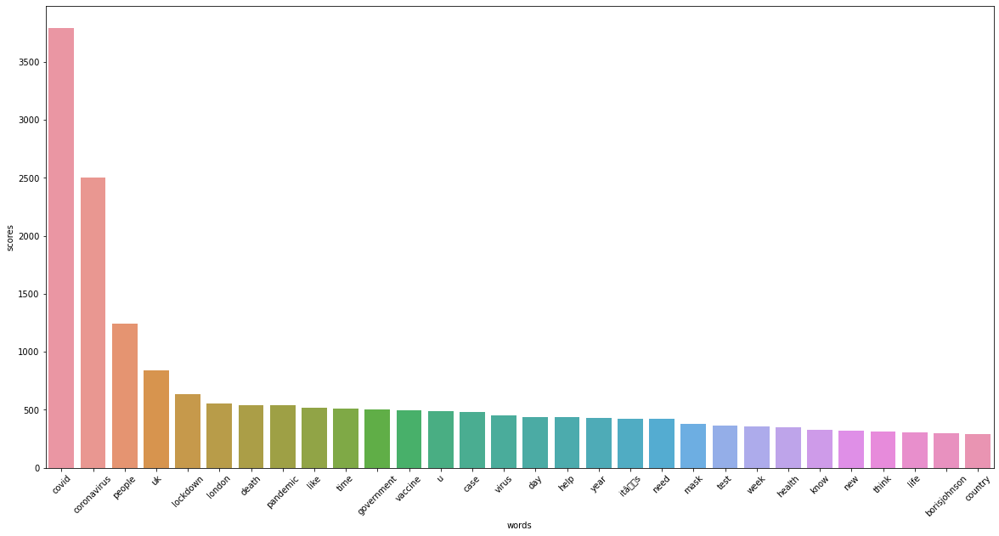

<Figure size 432x288 with 0 Axes>

In [198]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()
plt.savefig("scorWord.png")

In [199]:
pos_df = pd.DataFrame(most_common_pos_words.items(),columns=['words','scores'])

In [200]:
pos_df

,words,scores
0,covid,8857
1,coronavirus,5501
2,new,2399
3,people,2143
4,uk,2045
5,vaccine,1678
6,case,1628
7,london,1491
8,lockdown,1481
9,u,1202


/home/outif/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 128 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/outif/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 153 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/outif/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 128 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/outif/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 153 missing from current font.
  font.set_text(s, 0, flags=flags)


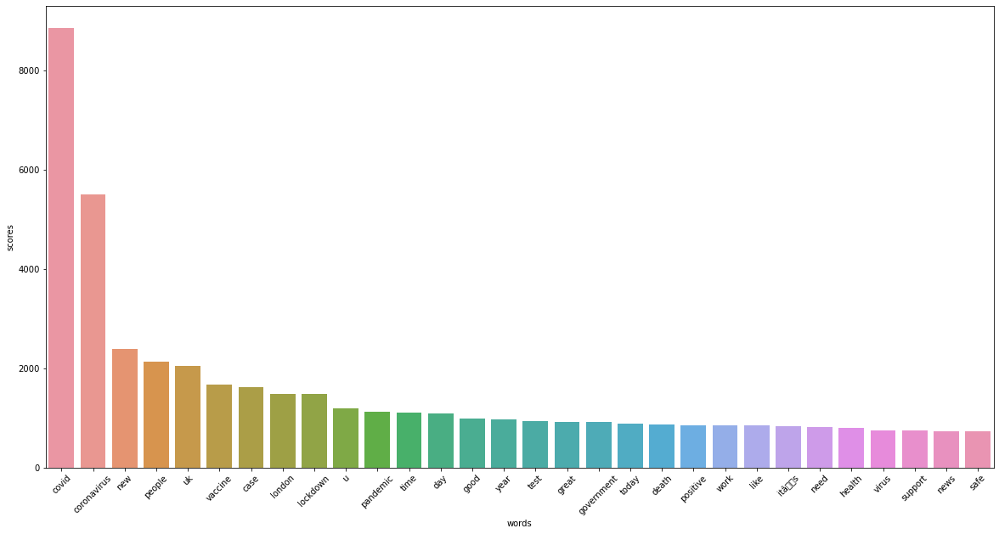

<Figure size 432x288 with 0 Axes>

In [201]:
# Plot with seaborn
pos_df = pd.DataFrame(most_common_pos_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=pos_df)
plt.xticks(rotation=45)
plt.show()
plt.savefig("scorWord2.png")

In [202]:
neut_df = pd.DataFrame(most_common_neut_words.items(),columns=['words','scores'])

In [203]:
neut_df

,words,scores
0,covid,5978
1,coronavirus,4949
2,london,1282
3,uk,1261
4,lockdown,1194
5,vaccine,1096
6,de,994
7,people,718
8,pandemic,710
9,que,564


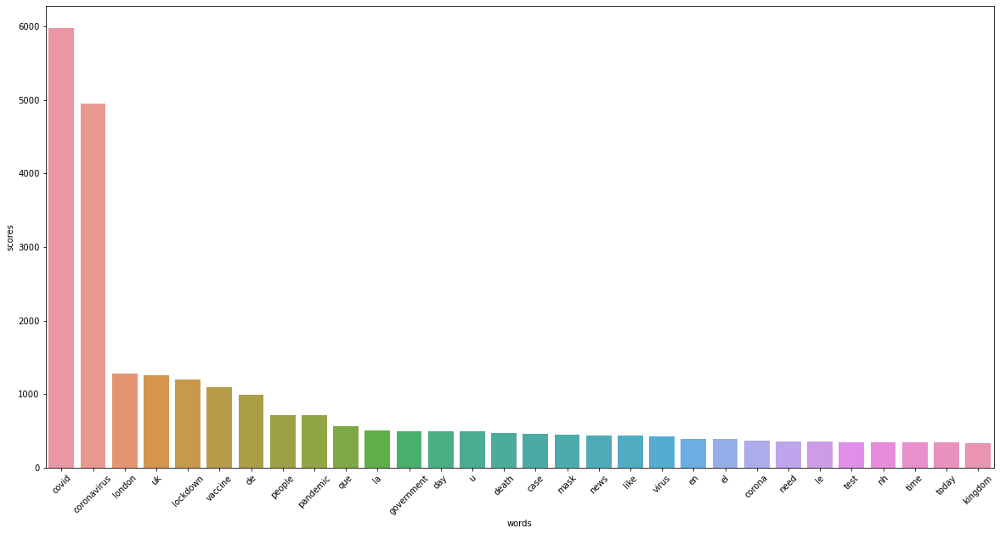

<Figure size 432x288 with 0 Axes>

In [204]:
# Plot with seaborn
pos_df = pd.DataFrame(most_common_pos_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neut_df)
plt.xticks(rotation=45)
plt.show()
plt.savefig("scorWord2.png")

In [208]:
def plot_wordcloud(docx):
    plt.figure(figsize=(20,10))
    mywordcloud = WordCloud().generate(docx)
    plt.imshow(mywordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [209]:

pos_docx = ' '.join(pos_tokens)
neg_docx = ' '.join(neg_tokens)
neu_docx = ' '.join(neut_tokens)

In [217]:
#style drapo for ancien tweets
from wordcloud import WordCloud, ImageColorGenerator
import stylecloud
#import cv2

# Start with one review:
tweet_All = " ".join(str(review) for review in df['Tweet'].astype(str).apply(lambda x: ' '.join(x)))

stylecloud123 =stylecloud.gen_stylecloud(tweet_All)
stylecloud123

In [218]:
#style twiiter for new tweets
from wordcloud import WordCloud, ImageColorGenerator
import stylecloud
#import cv2

# Start with one review:
tweet_All = " ".join(review for review in df['processed_tweet'].apply(lambda x: ' '.join(x)))

stylecloud.gen_stylecloud(tweet_All, icon_name= "fab fa-twitter")

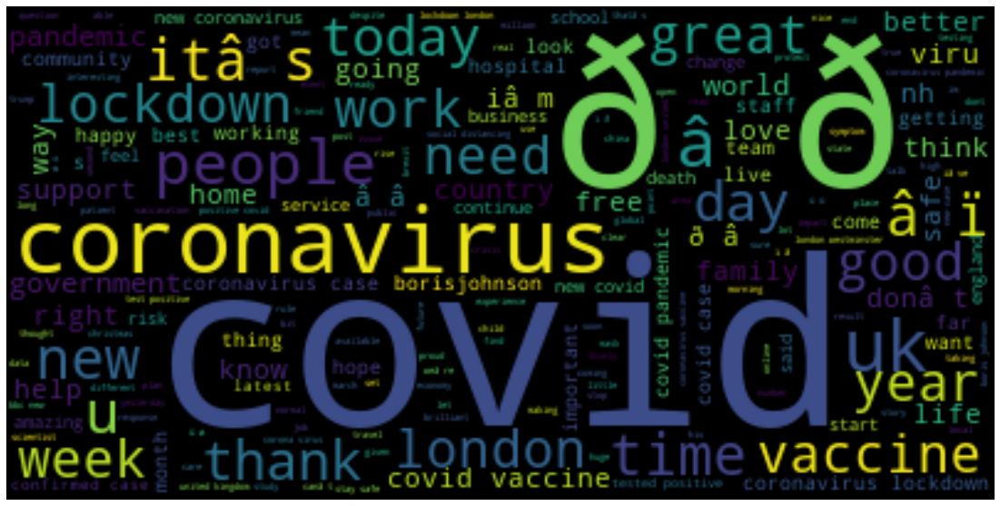

<Figure size 432x288 with 0 Axes>

In [221]:
from wordcloud import WordCloud

plot_wordcloud(pos_docx)
plt.savefig("wordCloud1.png")

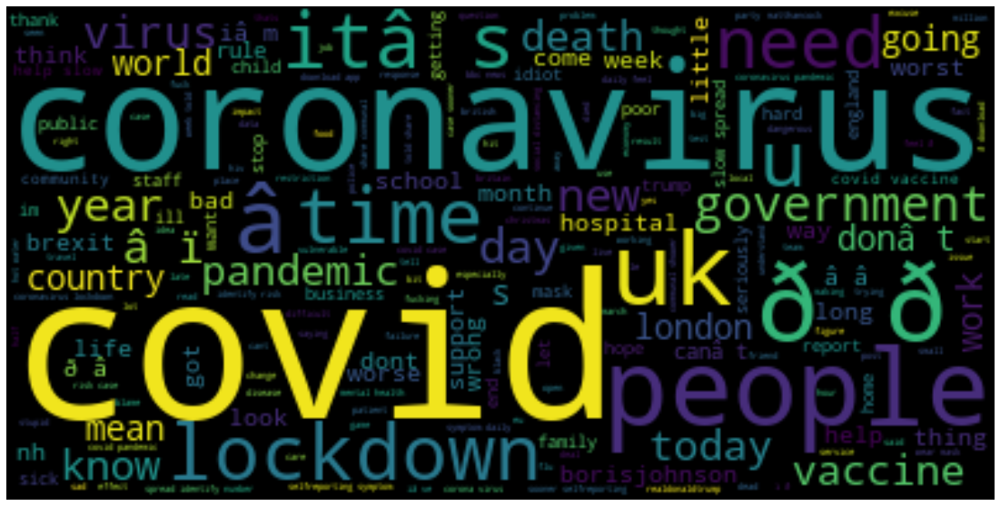

<Figure size 432x288 with 0 Axes>

In [222]:
plot_wordcloud(neg_docx)
plt.savefig("wordCloud2.png")

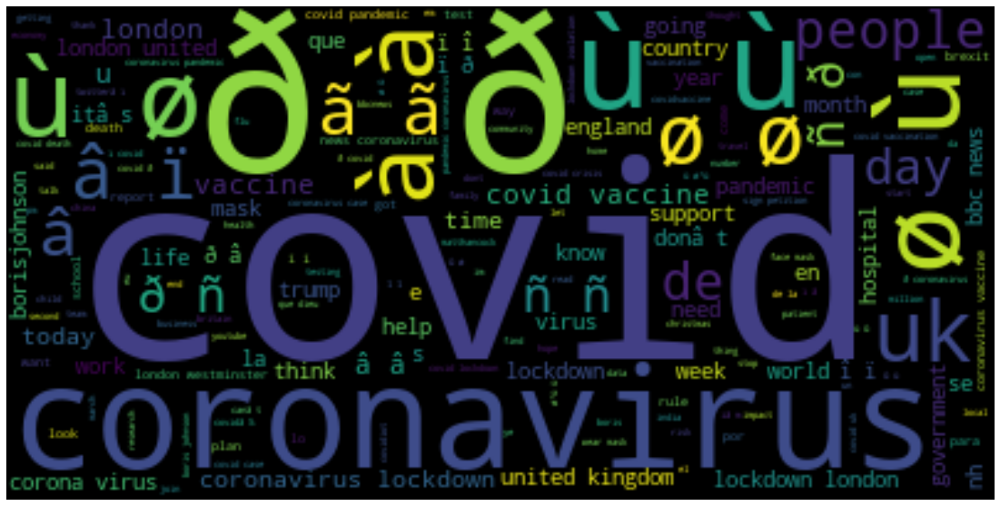

<Figure size 432x288 with 0 Axes>

In [223]:
plot_wordcloud(neu_docx)
plt.savefig("wordCloud3.png")

In [224]:
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /home/outif/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [225]:
stop_words = set(stopwords.words('english'))

# View a few words from the set
list(stop_words)[:4]

['some', "didn't", 'more', 'if']

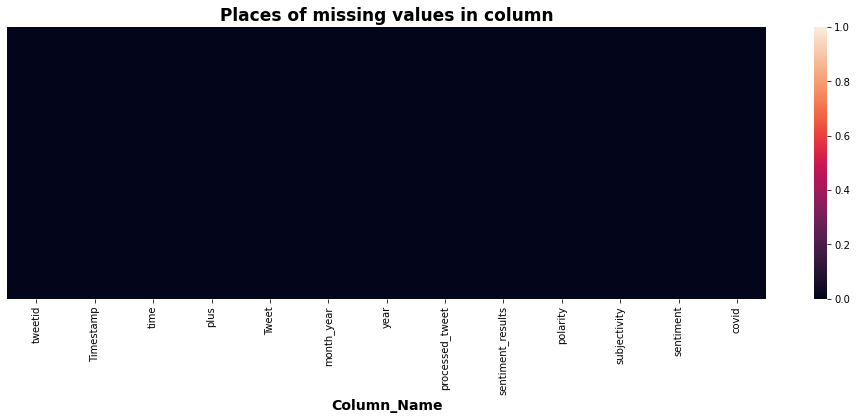

In [226]:
#Heat Map for missing values
plt.figure(figsize=(17, 5))
sns.heatmap(df.isnull(), cbar=True, yticklabels=False)
plt.xlabel("Column_Name", size=14, weight="bold")
plt.title("Places of missing values in column",fontweight="bold",size=17)
plt.show()

In [227]:

loc_analysis = pd.DataFrame(df_new['sentiment'].value_counts().sort_values(ascending=False))
loc_analysis = loc_analysis.rename(columns={'sentiment':'count'})

In [228]:
import plotly.graph_objects as go


In [229]:
plot_size = plt.rcParams["figure.figsize"] 
print(plot_size[0]) 
print(plot_size[1])

plot_size[0] = 8
plot_size[1] = 6
plt.rcParams["figure.figsize"] = plot_size 

6.0
4.0


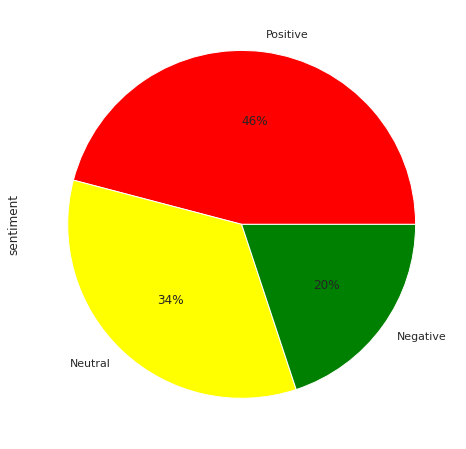

In [238]:
df_new.sentiment.value_counts().plot(kind='pie', autopct='%1.0f%%', colors=["red", "yellow", "green"])
plt.savefig("pourcentage.png")

/home/outif/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


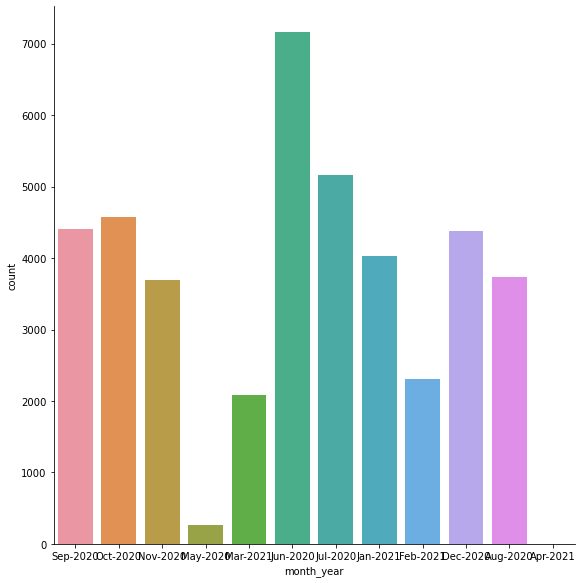

In [231]:
sns.catplot("month_year", data=df_new, kind="count", height=8)


In [232]:
Top_date_Of_tweet= df_new['month_year'].value_counts().head(10)

sns.set(rc={'figure.figsize':(12,8)})
sns.set_style('white')

In [233]:
Top_date_Of_tweet.head(10)

Jun-2020    7163
Jul-2020    5168
Oct-2020    4578
Sep-2020    4413
Dec-2020    4378
Jan-2021    4029
Aug-2020    3739
Nov-2020    3695
Feb-2021    2306
Mar-2021    2081
Name: month_year, dtype: int64

In [234]:
Top_date_Of_tweet_df=pd.DataFrame(Top_date_Of_tweet)
Top_date_Of_tweet_df.reset_index(inplace=True)
Top_date_Of_tweet_df.rename(columns={'index':'date', 'month_year':'date_Count'}, inplace=True)
Top_date_Of_tweet_df

,date,date_Count
0,Jun-2020,7163
1,Jul-2020,5168
2,Oct-2020,4578
3,Sep-2020,4413
4,Dec-2020,4378
5,Jan-2021,4029
6,Aug-2020,3739
7,Nov-2020,3695
8,Feb-2021,2306
9,Mar-2021,2081


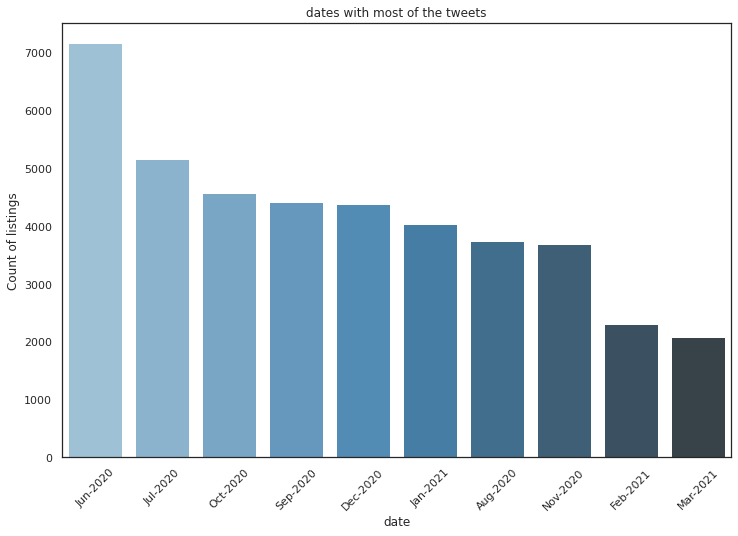

In [239]:
viz_1=sns.barplot(x="date", y="date_Count", data=Top_date_Of_tweet_df,
                 palette='Blues_d')
viz_1.set_title('dates with most of the tweets')
viz_1.set_ylabel('Count of listings')
viz_1.set_xlabel('date')
viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation=45)
plt.savefig("suucce.png")

/home/outif/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


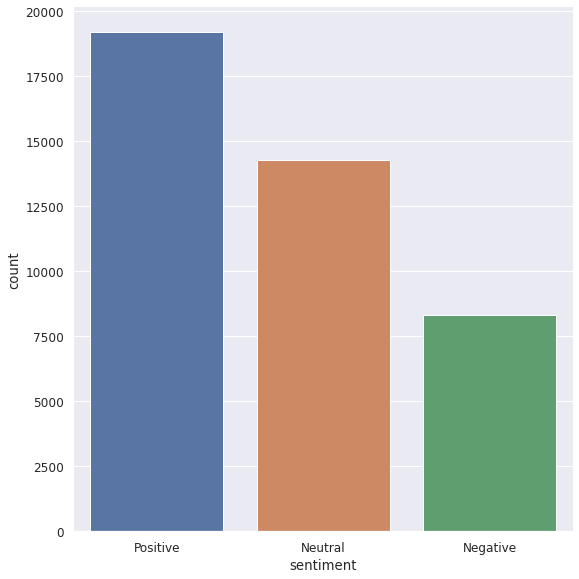

In [240]:
sns.set(font_scale=1.1)
sns.catplot("sentiment", data=df, kind="count", height=8)
plt.savefig("sentiment_scor.png")

In [241]:
df.month_year.value_counts()


Jun-2020    7163
Jul-2020    5168
Oct-2020    4578
Sep-2020    4413
Dec-2020    4378
Jan-2021    4029
Aug-2020    3739
Nov-2020    3695
Feb-2021    2306
Mar-2021    2081
May-2020     267
Apr-2021       2
Name: month_year, dtype: int64

In [242]:
# function to collect hashtags
def hashtag_extract(x):
    hashtags = []
    for i in x:
        ht = re.findall(r'#(\w+)', str(i))
        hashtags.append(ht)
    return hashtags

In [243]:
# extracting hashtags from non racist/sexist tweets
HT_Positive = hashtag_extract(df['Tweet'][df['sentiment'] == 'Positive'])
HT_Neutral = hashtag_extract(df['Tweet'][df['sentiment'] == 'Neutral'])
HT_Negative = hashtag_extract(df['Tweet'][df['sentiment'] == 'Negative'])

# unnesting list
HT_Positive = sum(HT_Positive, [])
HT_Neutral = sum(HT_Neutral, [])
HT_Negative = sum(HT_Negative, [])

In [244]:
print(HT_Positive)

['unsignedhour', 'ASMR', 'BritishSummerTime', 'clocksgoforward', 'AWeekAway', 'trending', 'summer', 'sun', 'coronavirus', 'COVID19', 'RepairShop', 'Coronavirus', 'morningcommute', 'happymonday', 'easter', 'chocolate', 'covid19', 'coronavirus', 'lockdown3', 'lockdown', 'London', 'coronavirus', 'Covid19UK', 'COVID', 'Coronavirus', 'Pandemic', 'coronavirus', 'Gardening', 'Podcaster', 'winning', 'feelingblessed', 'BristolProtests', 'BahrainGP', 'itfc', 'ITZYonKCON3', 'AntiFascistRevolution2021', 'coronavirus', 'BirKereDogruYapTFF', 'thewall', 'ITZY', 'BristolProtests', 'BahrainGP', 'itfc', 'ITZYonKCON3', 'AntiFascistRevolution2021', 'COVID', 'COVID19', 'coronavirus', 'BirKereDogruYapTFF', 'BristolProtests', 'BahrainGP', 'Iran', 'ITZYonKCON3', 'AntiFascistRevolution2021', 'COVID19', 'coronavirus', 'BirKereDogruYapTFF', 'bwfc', 'COVID19', 'Covid19UK', 'pandemic', 'COVID', 'coronavirus', 'WearAMask', 'WearADamnMask', 'SocialDistancing', 'StaySafe', 'Covid_19', 'CoronaVaccine', 'vaccine', 'cor

In [245]:
print(HT_Neutral)

['morningcommute', 'vaccination', 'secondjab', 'covid19', 'coronavirus', 'lockdown3', 'lockdown', 'London', 'CovidVaccine', 'PfizerVaccine', 'coronavirus', 'BREAKING', 'COVID19', 'FRIENDS', 'CORONAVIRUS', 'LOCKDOWN', 'ISOLATION', 'STAYSAFE', 'KEEPFOLLOWINGTHERULES', 'ISAIDIT', 'morningcommute', 'chocolate', 'spring', 'covid19', 'coronavirus', 'lockdown3', 'lockdown', 'London', 'Serbia', 'Belgrade', 'Balkans', 'Vucic', 'China', 'XiJinping', 'Asia', 'vaccine', 'vaccination', 'vaccinenationalism', 'AstraZeneca', 'Moderna', 'Pfizer', 'BioNTech', 'COVID', 'pandemic', 'coronavirus', 'CoronavirusOutbreak', 'lockdown', 'london', 'coronavirus', '2021', 'hydepark', 'hydeparkcorner', 'quarantine', 'AstraZeneca', 'Pfizer', 'Moderna', 'Slovakia', 'Bratislava', 'Caputova', 'Slovak', 'Matovic', 'CEE', 'politics', 'security', 'vaccine', 'vaccination', 'vaccinenationalism', 'AstraZeneca', 'Moderna', 'Pfizer', 'BioNTech', 'COVID', 'pandemic', 'coronavirus', 'SK', 'Step2', 'Coronavirus', 'CoronaVirusUpda

In [246]:
print(HT_Negative)

['coronavirus', 'Mafia', '1', 'killthebill', 'coronavirus', 'ISAIDIT', 'CORONAVIRUS', 'LOCKDOWN', 'ISOLATION', 'SELFISOLATION', 'ZOOM', 'FRIENDS', 'STAYSAFE', 'KEEPFOLLOWINGTHERULES', 'nationaldayofreflection', 'coronavirus', 'lockdown', 'lockdownanniversary', 'theCovid', 'COVID19', 'coronavirus', 'Abdala', 'Riyadh', 'coronavirus', 'Coronavirus', 'morningcommute', 'weekendwanderings', 'hibernating', 'chilling', 'covid19', 'coronavirus', 'lockdown3', 'lockdown', 'London', 'coronavirus', 'London', 'LondonProtest', 'Lockdown', 'COVID19', 'COVID19', 'Protest', 'Coronavirus', 'London', 'Lockdown', 'Tanzania', 'Covid_19', 'AstraZenaca', 'EU', 'CovidVaccine', 'COVID19', 'coronavirus', 'TravelStyle', 'London', 'UK', 'DiamondStyle', 'CookieLove', 'Vegan', 'Dream', 'Covid_19', 'Coronavirus', 'Dessin', 'Illustration', 'Drawing', 'WomenWhoDraw', 'WOWð', 'netherlands', 'lockdown', 'lockdownprotests', 'routemap', 'COVID19', 'coronavirus', 'police', 'PoliceBrutality', 'holland', 'protests', 'opportun

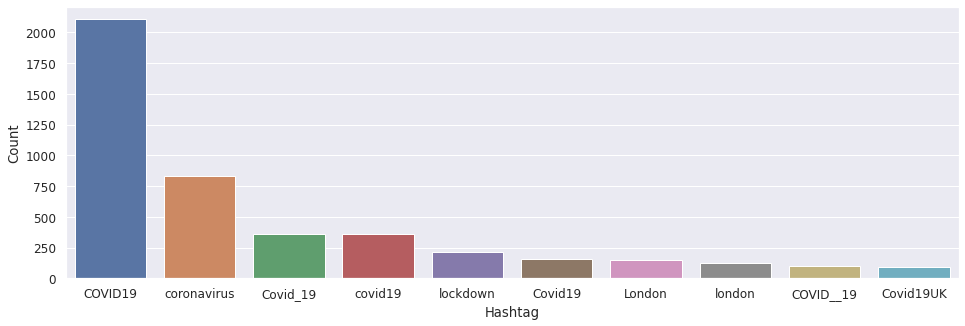

<Figure size 864x576 with 0 Axes>

In [247]:
# making frequency distribution top 10 Extremely Positive hashtags
a = nltk.FreqDist(HT_Negative)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count' : list(a.values())})

d = d.nlargest(columns = 'Count', n = 10)

plt.figure(figsize = (16,5))
ax = sns.barplot(data =d, x = 'Hashtag', y = 'Count')
plt.show()
plt.savefig("hashttagNEG.png")

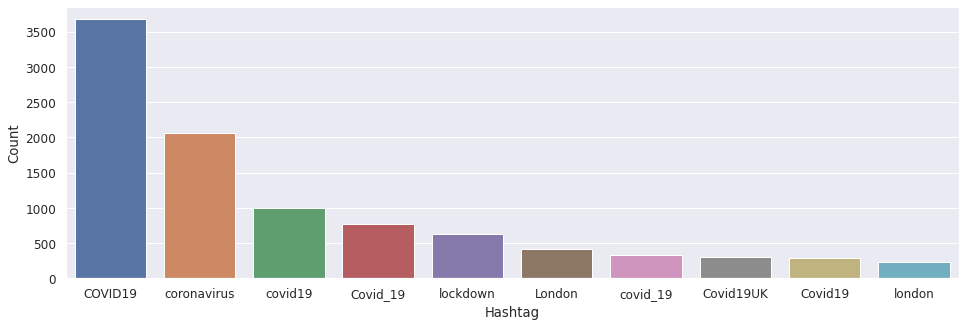

<Figure size 864x576 with 0 Axes>

In [249]:
# making frequency distribution top 10 Extremely Positive hashtags
a = nltk.FreqDist(HT_Neutral)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count' : list(a.values())})

d = d.nlargest(columns = 'Count', n = 10)

plt.figure(figsize = (16,5))
ax = sns.barplot(data =d, x = 'Hashtag', y = 'Count')
plt.show()
plt.savefig("hashtagNeu.png")

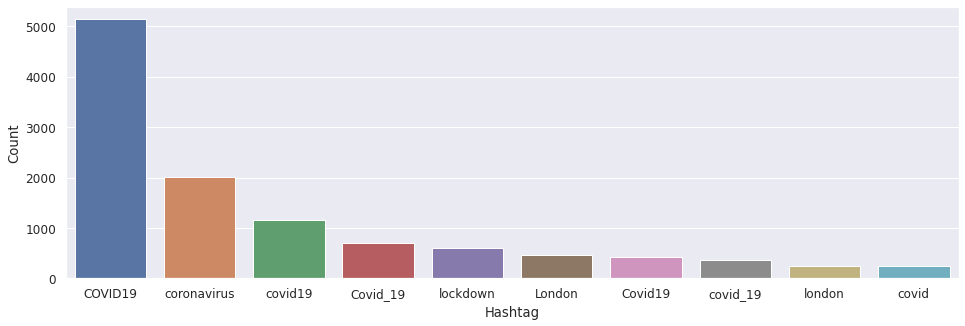

<Figure size 864x576 with 0 Axes>

In [250]:
# making frequency distribution top 10 Extremely Positive hashtags
a = nltk.FreqDist(HT_Positive)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count' : list(a.values())})

d = d.nlargest(columns = 'Count', n = 10)

plt.figure(figsize = (16,5))
ax = sns.barplot(data =d, x = 'Hashtag', y = 'Count')
plt.show()
plt.savefig("hashtagPos.png")

In [252]:
#Extracting Features from Cleaned Tweets

In [253]:
new_df = df[['Tweet','sentiment']]

In [254]:
new_df.head()

,Tweet,sentiment
0,<yungdaveGH> ITS OUT!!! YOUR NEW SUMMER NIGHTS...,Positive
1,<BlueChipIT> So blame the government rather th...,Neutral
2,<BritishHeraldUK> After a major plunge due to ...,Negative
3,"<FelixxMoritz> Well, I guess itâs time to ex...",Positive
4,<E7Drew> @SBurke10 @BBCNews Try reading the St...,Negative


In [104]:
from sklearn.model_selection import train_test_split
#Spitting Our Dataset into Training And Testing Dataset ( For Multiclass Classification)
train,valid = train_test_split(new_df,test_size = 0.2,random_state=0,stratify = new_df.sentiment.values) #stratification means that the train_test_split method returns training and test subsets that have the same proportions of class labels as the input dataset.
print("train shape : ", train.shape)
print("valid shape : ", valid.shape)

train shape :  (33457, 2)
valid shape :  (8365, 2)


In [105]:
df.head(1)

,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet,sentiment_results,polarity,subjectivity,sentiment,covid
0,1377396787011411968,2021-04-01,00:05:59,+0000,<calneeagle> #COVID19,Apr-2021,2021.0,,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.0,Neutral,1


In [106]:
df.processed_tweet.to_csv('new_tweets_clean.csv',index = False)

In [107]:
new_tweet_df= pd.read_csv('new_tweets_clean.csv')
print('Dataset size:',new_tweet_df.shape)
print('Columns are:',new_tweet_df.columns)
new_tweet_df.info()
new_tweet_df.head()

Dataset size: (41822, 1)
Columns are: Index(['processed_tweet'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41822 entries, 0 to 41821
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   processed_tweet  41741 non-null  object
dtypes: object(1)
memory usage: 326.9+ KB


,processed_tweet
0,NaN
1,thankyou dailymirror highlighting terrible pro...
2,one year ago wow vaccine ð vaccine
3,rich country spent trillion protecting economy...
4,number covid case per inhabitant day march mar...


In [108]:
#apprentissage non supervise
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
X = cv.fit_transform(new_tweet_df.processed_tweet.astype('U'))
print(X)


  (0, 38998)	1
  (1, 58051)	1
  (1, 13790)	1
  (1, 26080)	1
  (1, 57859)	1
  (1, 46234)	1
  (1, 53871)	1
  (1, 18221)	1
  (1, 33906)	1
  (1, 55299)	1
  (1, 1909)	1
  (1, 24408)	1
  (1, 3908)	1
  (1, 14506)	1
  (1, 63371)	1
  (1, 33633)	1
  (1, 4438)	1
  (1, 33629)	1
  (1, 11182)	1
  (1, 30451)	1
  (1, 41846)	1
  (1, 11463)	1
  (1, 19458)	1
  (1, 17513)	1
  (2, 41846)	1
  :	:
  (41820, 34071)	1
  (41820, 29610)	1
  (41820, 2715)	1
  (41820, 2721)	1
  (41820, 23626)	1
  (41820, 16551)	1
  (41820, 45353)	1
  (41820, 20669)	1
  (41820, 12294)	1
  (41820, 54992)	1
  (41820, 31822)	1
  (41820, 46606)	1
  (41820, 48557)	1
  (41820, 22304)	1
  (41820, 13905)	1
  (41820, 8608)	1
  (41820, 4154)	1
  (41820, 47031)	1
  (41820, 28108)	1
  (41820, 54314)	1
  (41820, 6425)	1
  (41820, 32669)	1
  (41821, 12294)	1
  (41821, 48311)	1
  (41821, 39681)	1


In [109]:
from sklearn.cluster import KMeans
wcss=[]
for i in range(3,30):
    Kmeans=KMeans(n_clusters=i,init='k-means++',max_iter=300,n_init=10,random_state=0,verbose=True)
    Kmeans.fit(X)
    wcss.append(Kmeans.inertia_)

Initialization complete
Iteration 0, inertia 1024480.0
Iteration 1, inertia 714623.1755938522
Iteration 2, inertia 712941.6105044988
Iteration 3, inertia 711639.6636242
Iteration 4, inertia 711637.5692392114
Iteration 5, inertia 711634.9145416406
Iteration 6, inertia 711624.1491938361
Iteration 7, inertia 711601.6848349492
Iteration 8, inertia 711550.6908810884
Iteration 9, inertia 711395.8964838492
Iteration 10, inertia 710885.8809723258
Iteration 11, inertia 710447.8783731364
Iteration 12, inertia 710192.2042557622
Iteration 13, inertia 709995.6427288805
Iteration 14, inertia 707729.7544219614
Iteration 15, inertia 702509.458727869
Iteration 16, inertia 702387.612726155
Iteration 17, inertia 702387.3391148289
Iteration 18, inertia 702387.3144110201
Converged at iteration 18: strict convergence.
Initialization complete
Iteration 0, inertia 983361.0
Iteration 1, inertia 715988.8898101351
Iteration 2, inertia 715721.9478874563
Iteration 3, inertia 715286.1945095705
Iteration 4, inertia 

Initialization complete
Iteration 0, inertia 1151898.0
Iteration 1, inertia 710206.3138090279
Iteration 2, inertia 707168.4288702923
Iteration 3, inertia 704414.8861535335
Iteration 4, inertia 703026.5140615533
Iteration 5, inertia 702228.6845353891
Iteration 6, inertia 697084.6574642801
Iteration 7, inertia 696380.1616347486
Iteration 8, inertia 696212.9555358372
Iteration 9, inertia 695930.3353081583
Iteration 10, inertia 695871.241782812
Iteration 11, inertia 695860.437397811
Iteration 12, inertia 695858.807656236
Iteration 13, inertia 695858.5985645801
Iteration 14, inertia 695858.5915897705
Converged at iteration 14: strict convergence.
Initialization complete
Iteration 0, inertia 984347.0
Iteration 1, inertia 712692.5403530917
Iteration 2, inertia 708593.842017463
Iteration 3, inertia 706594.6258994676
Iteration 4, inertia 706295.5466638026
Iteration 5, inertia 705606.5061766576
Iteration 6, inertia 705486.3944794477
Iteration 7, inertia 705348.5448637721
Iteration 8, inertia 705

Iteration 15, inertia 695508.9576260273
Iteration 16, inertia 695504.9495844044
Iteration 17, inertia 695500.8522751146
Iteration 18, inertia 695496.1161709953
Iteration 19, inertia 695494.7639777139
Iteration 20, inertia 695494.1965178212
Iteration 21, inertia 695494.0464088523
Iteration 22, inertia 695494.0294881142
Converged at iteration 22: strict convergence.
Initialization complete
Iteration 0, inertia 1127204.0
Iteration 1, inertia 701340.4283585316
Iteration 2, inertia 697550.4183574272
Iteration 3, inertia 695543.0406128993
Iteration 4, inertia 694594.3679432031
Iteration 5, inertia 693958.8412103791
Iteration 6, inertia 693478.1875655672
Iteration 7, inertia 693196.7413314757
Iteration 8, inertia 692520.1136805804
Iteration 9, inertia 689935.7360085387
Iteration 10, inertia 688083.5234192923
Iteration 11, inertia 687937.7565850478
Iteration 12, inertia 687871.0174527515
Iteration 13, inertia 687861.2483658093
Iteration 14, inertia 687858.8130084502
Iteration 15, inertia 68785

Iteration 7, inertia 689834.3396140618
Iteration 8, inertia 689833.6537305388
Iteration 9, inertia 689832.9446766803
Iteration 10, inertia 689832.6886034743
Iteration 11, inertia 689832.5614384725
Iteration 12, inertia 689832.1686408763
Iteration 13, inertia 689831.8252345811
Iteration 14, inertia 689831.7648825235
Iteration 15, inertia 689831.7464130811
Iteration 16, inertia 689831.740057613
Converged at iteration 16: strict convergence.
Initialization complete
Iteration 0, inertia 936342.0
Iteration 1, inertia 700573.7546122709
Iteration 2, inertia 697204.049931215
Iteration 3, inertia 693736.215635393
Iteration 4, inertia 691972.4479060456
Iteration 5, inertia 690252.9351214216
Iteration 6, inertia 689708.5137070921
Iteration 7, inertia 689606.3510128416
Iteration 8, inertia 689488.4061164183
Iteration 9, inertia 689327.1112506103
Iteration 10, inertia 688951.9048630521
Iteration 11, inertia 688399.7141570908
Iteration 12, inertia 687693.38674678
Iteration 13, inertia 687469.6661177

Iteration 18, inertia 689933.8496354007
Iteration 19, inertia 689933.8097836154
Converged at iteration 19: strict convergence.
Initialization complete
Iteration 0, inertia 775954.0
Iteration 1, inertia 705877.9652878906
Iteration 2, inertia 701227.6763729841
Iteration 3, inertia 699826.4481944658
Iteration 4, inertia 694811.6157410833
Iteration 5, inertia 689140.0117949253
Iteration 6, inertia 687767.2422407735
Iteration 7, inertia 687532.7933626961
Iteration 8, inertia 687526.404422895
Iteration 9, inertia 687525.1598440511
Iteration 10, inertia 687524.6683776682
Iteration 11, inertia 687524.3429280461
Iteration 12, inertia 687524.1023099375
Iteration 13, inertia 687523.990319081
Iteration 14, inertia 687523.8943252047
Iteration 15, inertia 687523.8856032955
Converged at iteration 15: strict convergence.
Initialization complete
Iteration 0, inertia 883008.0
Iteration 1, inertia 703922.615587944
Iteration 2, inertia 699927.9045415679
Iteration 3, inertia 697206.2638636488
Iteration 4, 

Iteration 23, inertia 687406.6274714385
Iteration 24, inertia 687406.5942499208
Converged at iteration 24: strict convergence.
Initialization complete
Iteration 0, inertia 830095.0
Iteration 1, inertia 706182.9243128786
Iteration 2, inertia 703524.5829304728
Iteration 3, inertia 701423.6353614562
Iteration 4, inertia 699942.0620998048
Iteration 5, inertia 697757.5506383266
Iteration 6, inertia 692342.3993009563
Iteration 7, inertia 691903.7334964869
Iteration 8, inertia 691658.749334684
Iteration 9, inertia 691590.611247313
Iteration 10, inertia 691542.7713271563
Iteration 11, inertia 691502.5787831051
Iteration 12, inertia 691427.7005200898
Iteration 13, inertia 691335.7902099347
Iteration 14, inertia 691233.4539769813
Iteration 15, inertia 690518.2390346439
Iteration 16, inertia 688605.5888826931
Iteration 17, inertia 688542.7476227692
Iteration 18, inertia 688498.5932425229
Iteration 19, inertia 688453.5492765275
Iteration 20, inertia 688440.3928512548
Iteration 21, inertia 688439.0

Converged at iteration 36: strict convergence.
Initialization complete
Iteration 0, inertia 992845.0
Iteration 1, inertia 693155.8101923624
Iteration 2, inertia 688787.590065389
Iteration 3, inertia 686137.1282690185
Iteration 4, inertia 685385.4732961893
Iteration 5, inertia 685009.3190962083
Iteration 6, inertia 684772.8233681219
Iteration 7, inertia 684541.9691550181
Iteration 8, inertia 684352.7792573285
Iteration 9, inertia 684247.9264856983
Iteration 10, inertia 684234.0848035226
Iteration 11, inertia 684227.9481132772
Iteration 12, inertia 684221.6599300206
Iteration 13, inertia 684218.413890662
Iteration 14, inertia 684217.0934568638
Iteration 15, inertia 684216.500571369
Iteration 16, inertia 684216.2205749244
Iteration 17, inertia 684215.9852407909
Iteration 18, inertia 684215.6556881424
Iteration 19, inertia 684215.5997239951
Converged at iteration 19: strict convergence.
Initialization complete
Iteration 0, inertia 915564.0
Iteration 1, inertia 695328.0373585022
Iteration 2

Iteration 11, inertia 687073.1801411617
Iteration 12, inertia 687072.939536502
Iteration 13, inertia 687072.8270070272
Iteration 14, inertia 687072.7309398621
Iteration 15, inertia 687072.7222178486
Converged at iteration 15: strict convergence.
Initialization complete
Iteration 0, inertia 880104.0
Iteration 1, inertia 700806.9470791947
Iteration 2, inertia 693207.9824185534
Iteration 3, inertia 686590.8697343242
Iteration 4, inertia 685702.1321404492
Iteration 5, inertia 685242.3039067572
Iteration 6, inertia 685114.9081450284
Iteration 7, inertia 685003.8675470989
Iteration 8, inertia 684795.4154693758
Iteration 9, inertia 684285.8481658092
Iteration 10, inertia 683973.648024996
Iteration 11, inertia 683919.6656263378
Iteration 12, inertia 683911.9583692462
Iteration 13, inertia 683910.0607878002
Iteration 14, inertia 683909.4358001105
Iteration 15, inertia 683908.413388594
Iteration 16, inertia 683908.1284466963
Iteration 17, inertia 683908.0120240673
Converged at iteration 17: stri

Iteration 19, inertia 680700.0490417714
Iteration 20, inertia 680677.9957453015
Iteration 21, inertia 680674.9373506182
Iteration 22, inertia 680672.1981649577
Iteration 23, inertia 680665.5316335951
Iteration 24, inertia 680644.1427607689
Iteration 25, inertia 680577.3256345736
Iteration 26, inertia 680553.3019163709
Iteration 27, inertia 680550.5984589418
Iteration 28, inertia 680550.083514963
Iteration 29, inertia 680549.8465729662
Iteration 30, inertia 680549.7529297946
Iteration 31, inertia 680549.7216909546
Iteration 32, inertia 680549.7175063377
Converged at iteration 32: strict convergence.
Initialization complete
Iteration 0, inertia 985771.0
Iteration 1, inertia 690285.2152273346
Iteration 2, inertia 686236.7435329969
Iteration 3, inertia 684241.9521737527
Iteration 4, inertia 683016.4049384168
Iteration 5, inertia 682255.056781052
Iteration 6, inertia 681972.4242860322
Iteration 7, inertia 681667.6046877156
Iteration 8, inertia 681472.3191149292
Iteration 9, inertia 681425.9

Iteration 14, inertia 684883.3454513063
Iteration 15, inertia 684879.9723346835
Iteration 16, inertia 684873.8373947421
Iteration 17, inertia 684870.5504314431
Iteration 18, inertia 684868.6353912378
Iteration 19, inertia 684866.1902221297
Iteration 20, inertia 684863.5994788242
Iteration 21, inertia 684861.5597331442
Iteration 22, inertia 684860.3356031189
Iteration 23, inertia 684859.8832661414
Iteration 24, inertia 684859.2304876877
Iteration 25, inertia 684858.3307249097
Iteration 26, inertia 684857.4994635223
Iteration 27, inertia 684856.60484183
Iteration 28, inertia 684855.3428328958
Iteration 29, inertia 684852.4320790941
Iteration 30, inertia 684846.9457668251
Iteration 31, inertia 684826.6308410437
Iteration 32, inertia 684735.5831798364
Iteration 33, inertia 684633.7102754947
Iteration 34, inertia 684601.2995089163
Iteration 35, inertia 684595.6002192961
Iteration 36, inertia 684593.7226568317
Iteration 37, inertia 684592.8078514724
Iteration 38, inertia 684592.4124921808
It

Initialization complete
Iteration 0, inertia 916909.0
Iteration 1, inertia 695692.8213745466
Iteration 2, inertia 691227.8931012846
Iteration 3, inertia 688226.4500014615
Iteration 4, inertia 685903.5778096815
Iteration 5, inertia 681177.6642042606
Iteration 6, inertia 678047.47818828
Iteration 7, inertia 677706.5373599029
Iteration 8, inertia 677305.1652332122
Iteration 9, inertia 677174.516402024
Iteration 10, inertia 677089.3686052536
Iteration 11, inertia 677054.4096806379
Iteration 12, inertia 677007.0600113949
Iteration 13, inertia 676982.4076441794
Iteration 14, inertia 676959.0138384519
Iteration 15, inertia 676943.2792030589
Iteration 16, inertia 676897.2731212539
Iteration 17, inertia 676483.5978748637
Iteration 18, inertia 675902.250783754
Iteration 19, inertia 675726.1861209214
Iteration 20, inertia 675512.4884234172
Iteration 21, inertia 675497.4747906439
Iteration 22, inertia 675486.0945297255
Iteration 23, inertia 675463.2567608678
Iteration 24, inertia 675399.4131573793

Iteration 26, inertia 682408.5668649593
Converged at iteration 26: strict convergence.
Initialization complete
Iteration 0, inertia 931615.0
Iteration 1, inertia 695392.8429303977
Iteration 2, inertia 691067.9441482587
Iteration 3, inertia 687678.0625463024
Iteration 4, inertia 685297.3460278069
Iteration 5, inertia 683821.9365756556
Iteration 6, inertia 682879.1343630167
Iteration 7, inertia 681115.0957471794
Iteration 8, inertia 678626.5629208575
Iteration 9, inertia 678505.3667393643
Iteration 10, inertia 678419.1816062818
Iteration 11, inertia 678290.8105260457
Iteration 12, inertia 678161.1600801137
Iteration 13, inertia 678058.258009042
Iteration 14, inertia 677968.9269818334
Iteration 15, inertia 677859.4692660776
Iteration 16, inertia 677755.6472410865
Iteration 17, inertia 677743.6250679216
Iteration 18, inertia 677731.0351070852
Iteration 19, inertia 677689.910182058
Iteration 20, inertia 677657.5432566527
Iteration 21, inertia 677653.421874928
Iteration 22, inertia 677650.63

Iteration 2, inertia 697296.7022994254
Iteration 3, inertia 694482.7690432456
Iteration 4, inertia 692590.2870013366
Iteration 5, inertia 691993.0359623655
Iteration 6, inertia 691515.9887489143
Iteration 7, inertia 691134.5860111295
Iteration 8, inertia 690597.5329192397
Iteration 9, inertia 687223.5626709462
Iteration 10, inertia 683094.9074717514
Iteration 11, inertia 682964.6692554466
Iteration 12, inertia 682891.3074658788
Iteration 13, inertia 682769.9911946466
Iteration 14, inertia 682692.0935206464
Iteration 15, inertia 682493.1261742718
Iteration 16, inertia 682031.7293812194
Iteration 17, inertia 681781.8272149608
Iteration 18, inertia 681727.092593409
Iteration 19, inertia 681676.7451585692
Iteration 20, inertia 681610.2810074304
Iteration 21, inertia 681551.3205357736
Iteration 22, inertia 681422.3739088225
Iteration 23, inertia 681256.8680587559
Iteration 24, inertia 680611.4100036357
Iteration 25, inertia 677932.0732029291
Iteration 26, inertia 677656.1869602671
Iteration

Iteration 22, inertia 673604.5314004291
Iteration 23, inertia 673589.4965132825
Iteration 24, inertia 673544.7392813852
Iteration 25, inertia 673403.2882710336
Iteration 26, inertia 673114.0297562828
Iteration 27, inertia 673002.7539713829
Iteration 28, inertia 672996.3891819068
Iteration 29, inertia 672992.783605942
Iteration 30, inertia 672989.489340119
Iteration 31, inertia 672986.7423412888
Iteration 32, inertia 672984.982824994
Iteration 33, inertia 672984.9001459681
Iteration 34, inertia 672984.7819116142
Iteration 35, inertia 672984.5112253162
Iteration 36, inertia 672984.3820627016
Iteration 37, inertia 672984.0371303734
Iteration 38, inertia 672984.0167828666
Iteration 39, inertia 672984.0047434915
Iteration 40, inertia 672983.985507863
Iteration 41, inertia 672983.9622049329
Converged at iteration 41: strict convergence.
Initialization complete
Iteration 0, inertia 732986.0
Iteration 1, inertia 701546.3985878594
Iteration 2, inertia 695393.6705014848
Iteration 3, inertia 6915

Initialization complete
Iteration 0, inertia 764753.0
Iteration 1, inertia 701025.9865470069
Iteration 2, inertia 697074.4435374144
Iteration 3, inertia 694262.6442749553
Iteration 4, inertia 692369.3791831012
Iteration 5, inertia 691774.4877027766
Iteration 6, inertia 691301.5825248896
Iteration 7, inertia 690919.7840378088
Iteration 8, inertia 690309.9057742306
Iteration 9, inertia 687110.1649881601
Iteration 10, inertia 682865.689969854
Iteration 11, inertia 682737.011240396
Iteration 12, inertia 682641.077830263
Iteration 13, inertia 682534.6802022626
Iteration 14, inertia 682462.8078227278
Iteration 15, inertia 682232.8658397134
Iteration 16, inertia 681757.7692138565
Iteration 17, inertia 681545.5940561115
Iteration 18, inertia 681486.241363891
Iteration 19, inertia 681413.4276558221
Iteration 20, inertia 681366.651191628
Iteration 21, inertia 681303.5291141601
Iteration 22, inertia 681150.4162947548
Iteration 23, inertia 680969.5690702855
Iteration 24, inertia 679757.5621847949


Iteration 10, inertia 670713.9667242612
Iteration 11, inertia 670590.543797602
Iteration 12, inertia 670542.2222991463
Iteration 13, inertia 670488.3401164392
Iteration 14, inertia 670482.6012955204
Iteration 15, inertia 670481.4945601305
Iteration 16, inertia 670480.8237298226
Iteration 17, inertia 670480.6795009703
Iteration 18, inertia 670480.6583308006
Converged at iteration 18: strict convergence.
Initialization complete
Iteration 0, inertia 851077.0
Iteration 1, inertia 684224.738935714
Iteration 2, inertia 680654.0790335167
Iteration 3, inertia 678876.7470910979
Iteration 4, inertia 676900.419359872
Iteration 5, inertia 675447.4279206615
Iteration 6, inertia 674327.0295570408
Iteration 7, inertia 673985.5764866874
Iteration 8, inertia 673692.3850473001
Iteration 9, inertia 673476.2980276507
Iteration 10, inertia 673397.201422032
Iteration 11, inertia 673356.2474725044
Iteration 12, inertia 673283.3636700884
Iteration 13, inertia 673064.199099249
Iteration 14, inertia 672718.6141

Iteration 5, inertia 677514.8808217263
Iteration 6, inertia 677437.6805539825
Iteration 7, inertia 677381.6695007015
Iteration 8, inertia 677248.1245121313
Iteration 9, inertia 676740.0113341211
Iteration 10, inertia 676164.8624215035
Iteration 11, inertia 675919.7280164675
Iteration 12, inertia 675833.4824098232
Iteration 13, inertia 675812.9220873715
Iteration 14, inertia 675789.6491464728
Iteration 15, inertia 675732.4329034183
Iteration 16, inertia 675613.9584916711
Iteration 17, inertia 675489.5905087513
Iteration 18, inertia 675033.5780575259
Iteration 19, inertia 674880.5227343853
Iteration 20, inertia 674824.3356019458
Iteration 21, inertia 674796.6389491842
Iteration 22, inertia 674793.6341920273
Iteration 23, inertia 674793.2912169643
Iteration 24, inertia 674793.2618959288
Converged at iteration 24: strict convergence.
Initialization complete
Iteration 0, inertia 764319.0
Iteration 1, inertia 699264.3977440383
Iteration 2, inertia 694525.9544408371
Iteration 3, inertia 69116

Initialization complete
Iteration 0, inertia 850542.0
Iteration 1, inertia 683553.4955189145
Iteration 2, inertia 679965.9058001046
Iteration 3, inertia 678165.4416881999
Iteration 4, inertia 676189.296331751
Iteration 5, inertia 674740.599601017
Iteration 6, inertia 673662.9982160983
Iteration 7, inertia 673296.5864967545
Iteration 8, inertia 672987.007904888
Iteration 9, inertia 672777.4311722624
Iteration 10, inertia 672707.4503120532
Iteration 11, inertia 672665.3271550158
Iteration 12, inertia 672585.0107902574
Iteration 13, inertia 672326.2854051737
Iteration 14, inertia 672025.0082366831
Iteration 15, inertia 671913.8680023748
Iteration 16, inertia 671901.6169292504
Iteration 17, inertia 671873.5130428578
Iteration 18, inertia 671834.1787986561
Iteration 19, inertia 671807.1427757242
Iteration 20, inertia 671789.903005662
Iteration 21, inertia 671774.2476851206
Iteration 22, inertia 671750.6484245977
Iteration 23, inertia 671702.1033004991
Iteration 24, inertia 671553.505309556


Iteration 31, inertia 670724.1253612445
Iteration 32, inertia 670723.9504868849
Iteration 33, inertia 670723.6303593485
Iteration 34, inertia 670722.2300138242
Iteration 35, inertia 670715.103854037
Iteration 36, inertia 670711.7837124779
Iteration 37, inertia 670706.7642195593
Iteration 38, inertia 670703.7423090267
Iteration 39, inertia 670702.6644732646
Iteration 40, inertia 670702.1743308655
Iteration 41, inertia 670702.0983427779
Iteration 42, inertia 670702.0852899642
Converged at iteration 42: strict convergence.
Initialization complete
Iteration 0, inertia 772586.0
Iteration 1, inertia 701766.1313476448
Iteration 2, inertia 694557.456879048
Iteration 3, inertia 688134.333018359
Iteration 4, inertia 683047.67113457
Iteration 5, inertia 681417.568289808
Iteration 6, inertia 681073.682393018
Iteration 7, inertia 680625.8972969231
Iteration 8, inertia 679993.7790138155
Iteration 9, inertia 679126.2323689895
Iteration 10, inertia 678869.5009057184
Iteration 11, inertia 678476.503626

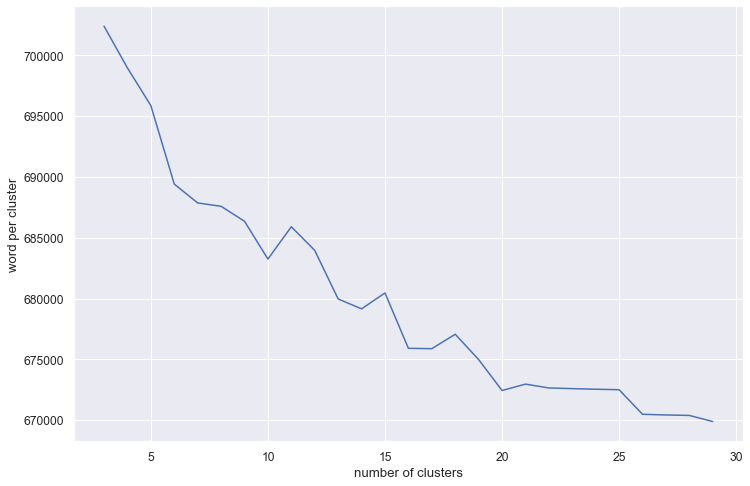

In [515]:

import matplotlib.pyplot as plt
plt.plot(range(3,30),wcss)
plt.xlabel('number of clusters')
plt.ylabel('word per cluster')
plt.show()
plt.savefig("cluster.png")

Initialization complete
Iteration 0, inertia 775399.0
Iteration 1, inertia 704964.5811956889
Iteration 2, inertia 699780.1311161619
Iteration 3, inertia 697891.2181209126
Iteration 4, inertia 692884.3500303987
Iteration 5, inertia 687141.4924767464
Iteration 6, inertia 685615.0517531796
Iteration 7, inertia 685220.7301614779
Iteration 8, inertia 685154.7808120385
Iteration 9, inertia 685135.8675315126
Iteration 10, inertia 685127.4140102789
Iteration 11, inertia 685123.7961781455
Iteration 12, inertia 685120.1995174497
Iteration 13, inertia 685114.1786862192
Iteration 14, inertia 685105.7400965255
Iteration 15, inertia 685094.3296451798
Iteration 16, inertia 685091.9457205313
Iteration 17, inertia 685091.4700503497
Iteration 18, inertia 685091.3038828195
Iteration 19, inertia 685091.1948010187
Iteration 20, inertia 685090.977367665
Iteration 21, inertia 685090.909600539
Iteration 22, inertia 685090.7055816024
Iteration 23, inertia 685090.6645693743
Iteration 24, inertia 685090.60932615

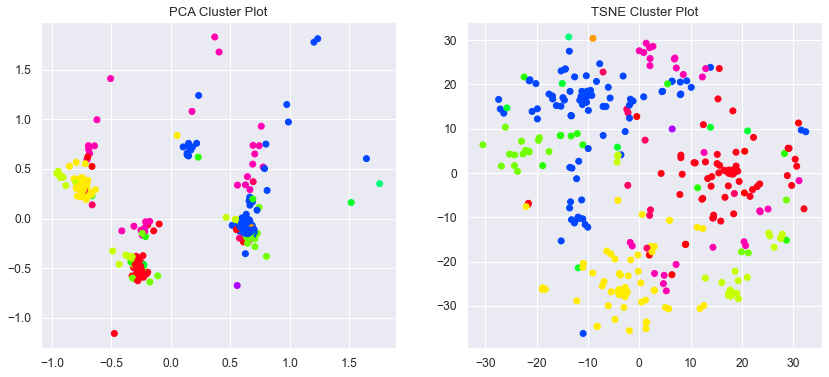

In [516]:
clusters = KMeans(n_clusters=20,init='k-means++',max_iter=300,n_init=10,random_state=0,verbose=True).fit_predict(X)

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.cm as cm
def plot_tsne_pca(data, labels):
    max_label = max(labels)
    max_items = np.random.choice(range(data.shape[0]), size=1000, replace=False) 
    pca = PCA(n_components=2).fit_transform(data[max_items,:].todense())
    tsne = TSNE().fit_transform(PCA(n_components=50).fit_transform(data[max_items,:].todense()))
    idx = np.random.choice(range(pca.shape[0]), size=300, replace=False)
    label_subset = labels[max_items]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
    f, ax = plt.subplots(1, 2, figsize=(14, 6))
    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster Plot')
    
    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster Plot')
    
plot_tsne_pca(X, clusters)
plt.savefig("plot_tsne_pca.png")

In [517]:
true_k=30
Kmeans=KMeans(n_clusters=true_k,init='k-means++',n_init=1)
Kmeans.fit(X)

KMeans(n_clusters=30, n_init=1)

In [518]:
print("Top terms per cluster:")
order_centroids = Kmeans.cluster_centers_.argsort()[:, ::-1]
terms = cv.get_feature_names()
for i in range(true_k):
    print("Cluster %d:" % i)
    print("-----------------------")
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind])
    print()
print("\n")

Top terms per cluster:
Cluster 0:
-----------------------
 think
 covid
 coronavirus
 people
 year
 itâ
 still
 time
 would
 like

Cluster 1:
-----------------------
 lockdown
 coronavirus
 london
 morningcommute
 westminster
 covid
 staysafe
 friend
 isolation
 happy

Cluster 2:
-----------------------
 uk
 covid
 coronavirus
 news
 government
 pandemic
 hiv
 london
 case
 health

Cluster 3:
-----------------------
 new
 coronavirus
 case
 covid
 uk
 report
 cyprus
 record
 cypruscoronavirus
 death

Cluster 4:
-----------------------
 covid
 coronavirus
 pandemic
 get
 time
 test
 one
 due
 new
 like

Cluster 5:
-----------------------
 better
 risk
 france
 bring
 notice
 whiner
 went
 time
 situ
 rate

Cluster 6:
-----------------------
 covid
 art
 coronavirus
 corona
 artwork
 artist
 streetart
 artistsoninstagram
 artlovers
 artoftheday

Cluster 7:
-----------------------
 øªø
 øª
 øªù
 úº
 ø¹ø
 ø³ø
 ø¹ù
 ø³
 øù
 ø³ù

Cluster 8:
-----------------------
 gym
 covid
 leisure
 centr

In [519]:
sentiment_counts = df.sentiment.value_counts()
number_of_tweets = df.tweetid.count()
print(sentiment_counts)
print(number_of_tweets)

Positive    19192
Neutral     14293
Negative     8337
Name: sentiment, dtype: int64
41821


In [520]:
from nltk import ngrams
def ngrams(input_list):
    #onegrams = input_list
    bigrams = [' '.join(t) for t in list(zip(input_list, input_list[1:]))]
    trigrams = [' '.join(t) for t in list(zip(input_list, input_list[1:], input_list[2:]))]
    return bigrams+trigrams
df['grams'] = df.processed_tweet.apply(ngrams)
df[['grams']].head()

,grams
0,[]
1,"[t h, h a, a n, n k, k y, y o, o u, u , d, ..."
2,"[o n, n e, e , y, y e, e a, a r, r , a, ..."
3,"[r i, i c, c h, h , c, c o, o u, u n, n t, ..."
4,"[n u, u m, m b, b e, e r, r , c, c o, o v, ..."


In [521]:
#support victor machine

In [522]:
#naive bayses

In [523]:
df = df.sample(frac=1)
df = df[:200000]

In [524]:
print("Dataset shape:", df.shape)

Dataset shape: (41822, 14)


In [525]:
df.head(1)

,tweetid,Timestamp,time,plus,Tweet,month_year,year,processed_tweet,sentiment_results,polarity,subjectivity,sentiment,covid,grams
23985,1281927674378760192,2020-07-11,13:25:49,+0000,<smileyyearwood> Local NHS #COVID__19 unit say...,Jul-2020,2020.0,local nh covid unit say symptom likely march o...,"{'polarity': 0.07714285714285715, 'subjectivit...",0.077143,0.487143,Positive,0,"[l o, o c, c a, a l, l , n, n h, h , c, ..."


In [528]:
df['sentiment'].unique()

array(['Positive', 'Neutral', 'Negative'], dtype=object)

In [529]:
df.describe()

,year,polarity,subjectivity,covid
count,41820.000000,41822.000000,41822.000000,41822.000000
mean,2020.201315,0.078154,0.359255,0.530367
std,0.400988,0.251083,0.303156,0.499083
min,2020.000000,-1.000000,0.000000,0.000000
25%,2020.000000,0.000000,0.000000,0.000000
50%,2020.000000,0.000000,0.375000,1.000000
75%,2020.000000,0.200000,0.562500,1.000000
max,2021.000000,1.000000,1.000000,1.000000


In [537]:
X = df['processed_tweet'].values
y = df['sentiment'].values

In [538]:
print(X.shape)
print(y.shape)

(41822,)
(41822,)


In [540]:
# sklearn
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report

from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB


In [541]:
#Convert a collection of raw documents to a matrix of TF-IDF features.
vector = TfidfVectorizer(sublinear_tf=True)
X = vector.fit_transform(X)
print(f'Vector fitted.')
print('No. of feature_words: ', len(vector.get_feature_names()))

Vector fitted.
No. of feature_words:  67036


In [542]:
print(X.shape)
print(y.shape)

(41822, 67036)
(41822,)


In [543]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=101)

In [544]:
print("X_train", X_train.shape)
print("y_train", y_train.shape)
print()
print("X_test", X_test.shape)
print("y_test", y_test.shape)

X_train (33457, 67036)
y_train (33457,)

X_test (8365, 67036)
y_test (8365,)


In [611]:
def model_Evaluate(model):
    #accuracy of model on training data
    acc_train=model.score(X_train, y_train)
    #accuracy of model on test data
    acc_test=model.score(X_test, y_test)
    
    print('Accuracy of model on training data : {}'.format(acc_train*100))
    print('Accuracy of model on testing data : {} \n'.format(acc_test*100))
    # Predict values for Test dataset
    y_pred = model.predict(X_test)

    # Print the evaluation metrics for the dataset.
    print(classification_report(y_test, y_pred))
    
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(y_test, y_pred)
    categories  = ['Negative','Positive']
    group_names = ['True Neg','False Pos', 'False Neg','True Pos']
    group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]
    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(3,3)
    sns.heatmap(cf_matrix,annot = labels, linewidths=0.2, cmap = 'Reds', fmt='',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

In [612]:
lg = LogisticRegression()
history=lg.fit(X_train, y_train)
model_Evaluate(lg)

C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy of model on training data : 100.0
Accuracy of model on testing data : 79.86849970113569 

              precision    recall  f1-score   support

    Negative       0.76      0.66      0.71      1693
     Neutral       0.77      0.85      0.81      2888
    Positive       0.84      0.82      0.83      3784

    accuracy                           0.80      8365
   macro avg       0.79      0.78      0.78      8365
weighted avg       0.80      0.80      0.80      8365



ValueError: `data` and `annot` must have same shape.

In [327]:
df[categorical].head()


,tweetid,time,plus,Tweet,month_year,processed_tweet,sentiment_results,sentiment
0,1377396084905926658,00:03:12,+0000,<CleanUpTadworth> ThankYou @DailyMirror for hi...,Apr-2021,thankyou dailymirror highlighting terrible pro...,"{'polarity': -0.2333333333333333, 'subjectivit...",Negative
1,1377368070151405581,22:11:52,+0000,<OliGuy> One year ago. Wow. Vaccine ðŸ’‰ #vac...,Mar-2021,one year ago wow vaccine ðÿ’‰ vaccine,"{'polarity': 0.1, 'subjectivity': 1.0, 'sentim...",Positive
2,1377358400443478017,21:33:27,+0000,<dcollen> Rich countries have spent over $14 t...,Mar-2021,rich country spent trillion protecting economy...,"{'polarity': -0.07083333333333333, 'subjectivi...",Negative
3,1377356369653866500,21:25:23,+0000,<CecileLPPSC> This is the number of #Covid_19 ...,Mar-2021,number covid case per inhabitant day march mar...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",Neutral
4,1377351539602284545,21:06:11,+0000,<DrFoxycleo> Hmmmmm ðŸ¤”ðŸ¤¨ðŸ¥³ UK fines Ch...,Mar-2021,hmmmmm ðÿ¤”ðÿ¤¨ðÿ¥³ uk fine chris oyakhilome h...,"{'polarity': 0.09583333333333334, 'subjectivit...",Positive


In [328]:
df[categorical].isnull().sum()


tweetid              1
time                 1
plus                 1
Tweet                1
month_year           2
processed_tweet      0
sentiment_results    0
sentiment            0
dtype: int64

In [329]:
# afficher les nombres de fréquences des valeurs dans les variables catégorielles
for var in categorical: 
    
    print(df[var].value_counts())

1302211586380247040    2
1351089992261644289    2
1274421609022083073    2
1340790223865847813    2
1272054220016037888    2
                      ..
1343975454668025856    1
1354357646615310339    1
1308375529138028545    1
1268864256679849985    1
1316133254668472321    1
Name: tweetid, Length: 39696, dtype: int64
12:48:03    9
19:18:48    7
11:02:06    7
11:14:32    7
09:47:34    7
           ..
22:51:07    1
02:57:16    1
09:43:31    1
08:18:36    1
17:58:34    1
Name: time, Length: 30100, dtype: int64
+0000    41819
ay fr        1
Name: plus, dtype: int64
<GThieuss> Que Dieu Ã©pargne le monde de #CORONAVIRUS . Que Dieu guÃ©risse les malades, assiste les prisonniers et qu'il bÃ©nisse les morts. Que Dieu remplisse nos vies de SantÃ©, Paix, Bonheur, Argent, longue vie, ouvre toutes les portes de reussites pour nous tous et qu'il benisse Le MondeðŸ™�ðŸ�¾    33
<Blod_wen> Help slow the spread of #COVID19 and identify at risk cases sooner by self-reporting your symptoms daily, even if y

Name: sentiment_results, Length: 12212, dtype: int64
Positive    19202
Neutral     14282
Negative     8337
Name: sentiment, dtype: int64


In [330]:
# afficher la distribution de fréquence des variables catégorielles
for var in categorical: 
    
    print(df[var].value_counts()/np.float(len(df)))

1302211586380247040    0.000048
1351089992261644289    0.000048
1274421609022083073    0.000048
1340790223865847813    0.000048
1272054220016037888    0.000048
                         ...   
1343975454668025856    0.000024
1354357646615310339    0.000024
1308375529138028545    0.000024
1268864256679849985    0.000024
1316133254668472321    0.000024
Name: tweetid, Length: 39696, dtype: float64
12:48:03    0.000215
19:18:48    0.000167
11:02:06    0.000167
11:14:32    0.000167
09:47:34    0.000167
              ...   
22:51:07    0.000024
02:57:16    0.000024
09:43:31    0.000024
08:18:36    0.000024
17:58:34    0.000024
Name: time, Length: 30100, dtype: float64
+0000    0.999952
ay fr    0.000024
Name: plus, dtype: float64
<GThieuss> Que Dieu Ã©pargne le monde de #CORONAVIRUS . Que Dieu guÃ©risse les malades, assiste les prisonniers et qu'il bÃ©nisse les morts. Que Dieu remplisse nos vies de SantÃ©, Paix, Bonheur, Argent, longue vie, ouvre toutes les portes de reussites pour nous tous 

Name: sentiment_results, Length: 12212, dtype: float64
Positive    0.459147
Neutral     0.341503
Negative    0.199350
Name: sentiment, dtype: float64


In [331]:
df.sentiment.value_counts()

Positive    19202
Neutral     14282
Negative     8337
Name: sentiment, dtype: int64

In [332]:
df.polarity.unique()

array([-0.23333333,  0.1       , -0.07083333, ..., -0.03125   ,
        0.31428571,  0.20596591])

In [333]:
# check frequency distribution of values in occupation variable

df.polarity.value_counts()

 0.000000    14282
 0.500000     1134
 0.250000      913
 0.400000      831
 0.136364      824
             ...  
 0.036111        1
-0.054167        1
 0.061806        1
 0.122917        1
-0.213333        1
Name: polarity, Length: 3920, dtype: int64

In [334]:
df.month_year.value_counts()

Jun-2020    7163
Jul-2020    5168
Oct-2020    4578
Sep-2020    4413
Dec-2020    4378
Jan-2021    4029
Aug-2020    3739
Nov-2020    3695
Feb-2021    2306
Mar-2021    2082
May-2020     267
Apr-2021       1
Name: month_year, dtype: int64

In [340]:
X=df.drop('polarity',axis=1)
y=df['polarity']


In [352]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
X = cv.fit_transform(df.polarity.astype('U'))
print(X)

  (0, 2203)	1
  (2, 911)	1
  (4, 1146)	1
  (7, 2574)	1
  (10, 399)	1
  (13, 1594)	1
  (15, 3139)	1
  (18, 2719)	1
  (22, 565)	1
  (24, 894)	1
  (25, 2448)	1
  (27, 1503)	1
  (28, 3209)	1
  (29, 905)	1
  (31, 3000)	1
  (33, 234)	1
  (34, 2422)	1
  (35, 672)	1
  (40, 2478)	1
  (43, 2304)	1
  (46, 1506)	1
  (52, 1942)	1
  (53, 2375)	1
  (54, 1505)	1
  (55, 2029)	1
  :	:
  (41775, 2802)	1
  (41778, 1897)	1
  (41780, 894)	1
  (41782, 2595)	1
  (41783, 732)	1
  (41784, 2304)	1
  (41785, 873)	1
  (41786, 1788)	1
  (41787, 1395)	1
  (41788, 1536)	1
  (41789, 1307)	1
  (41790, 1769)	1
  (41791, 1536)	1
  (41792, 2160)	1
  (41794, 1536)	1
  (41796, 2014)	1
  (41798, 3139)	1
  (41801, 234)	1
  (41803, 1536)	1
  (41806, 1581)	1
  (41810, 2537)	1
  (41811, 1536)	1
  (41812, 2204)	1
  (41816, 1965)	1
  (41818, 917)	1


In [353]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
y = cv.fit_transform(df.processed_tweet.astype('U'))
print(y)

  (0, 57918)	1
  (0, 13774)	1
  (0, 26046)	1
  (0, 57727)	1
  (0, 46141)	1
  (0, 53749)	1
  (0, 18203)	1
  (0, 33841)	1
  (0, 55172)	1
  (0, 1905)	1
  (0, 24374)	1
  (0, 3898)	1
  (0, 14496)	1
  (0, 63225)	1
  (0, 33569)	1
  (0, 4429)	1
  (0, 33565)	1
  (0, 11163)	1
  (0, 30403)	1
  (0, 41762)	1
  (0, 11443)	1
  (0, 19438)	1
  (0, 17497)	1
  (1, 41762)	1
  (1, 65597)	1
  :	:
  (41819, 34008)	1
  (41819, 29559)	1
  (41819, 2709)	1
  (41819, 2715)	1
  (41819, 23596)	1
  (41819, 16535)	1
  (41819, 45263)	1
  (41819, 20641)	1
  (41819, 12271)	1
  (41819, 54865)	1
  (41819, 31773)	1
  (41819, 46512)	1
  (41819, 48451)	1
  (41819, 22275)	1
  (41819, 13889)	1
  (41819, 8601)	1
  (41819, 4143)	1
  (41819, 46931)	1
  (41819, 28065)	1
  (41819, 54187)	1
  (41819, 6425)	1
  (41819, 32612)	1
  (41820, 12271)	1
  (41820, 48206)	1
  (41820, 39599)	1
